# ⚽️ Project Background

In modern football, **data analysis** plays a crucial role in evaluating player performance and market value.  
This project aims to build **machine learning models** to:

- **Predict player performance** (top scorer, assist, defensive actions, and goalkeeper saves) based on match statistics.  
- Apply **clustering** to group players by **market value**, providing **strategic insights** for **scouting** and **transfer decisions** in a more **objective and efficient** manner.

---

# 💼 Business Problem & Main Project

Football clubs face major challenges in:

- Objectively evaluating **player performance**
- Efficiently managing **player market value**

Assessments based solely on **observation** or **basic statistics** are often **inaccurate** and insufficient to support strategic decisions such as:

- Player acquisition or sales  
- Scouting  
- Position placement  
- Player rotation

🎯 **Machine Learning Solution:**

- **Performance prediction** based on player position and key statistical indicators such as:
  - Goals
  - Assists
  - Defensive contributions
  - Goalkeeper saves

- **Player segmentation** based on **market value**, enabling management to take a more **strategic and data-driven** approach in player investment decisions.

---

# ⚽️ Project Background – Predicting Football Player Overall Rating

In the modern football industry, a player’s **overall rating** is a key indicator used by:

- Coaches  
- Data analysts  
- Talent scouts  

To evaluate **individual player potential and performance**.

This rating reflects a **comprehensive assessment** of a player's contribution across various aspects of the game, including:

- Offensive ability  
- Defensive skills  
- Ball control  

---

# 📚 Data Sources

Two major sources were used in this project:

### 1. [Sofascore](https://www.sofascore.com/)
Provides technical performance metrics such as:

- Number of goals  
- Key passes  
- Successful tackles  
- Match-by-match player ratings  

### 2. [Transfermarkt](https://www.transfermarkt.com/)
Provides demographic and career information, including:

- Age and playing position  
- Career statistics and market value  
- Club transfer history  

---

📌 *Data from these two sources were combined to build predictive models capable of estimating players’ overall ratings objectively.*


## **LIBRARIES**

In [ ]:
import time
import numpy as np
import pandas as pd
import joblib

# Visualisasi
import matplotlib.pyplot as plt
import seaborn as sns

# Statistik
from scipy import stats

# Scikit-learn: preprocessing & split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV

# Scikit-learn: model
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neural_network import MLPRegressor

# Scikit-learn: evaluasi
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score



# 🧠 Data Understanding

The dataset contains **1,748 players** from top European leagues such as **La Liga, Premier League, and Serie A**.  
Each row represents **one player** with **27 metrics** covering performance statistics, profile data, and market value.

---

### 📊 Source: **Sofascore**
Performance metrics derived from match statistics:

#### 🔥 Offensive Performance:
- Goals  
- Expected goals (xG)  
- Big chances missed  
- Big chances created  
- Total shots  
- Goal conversion %

#### 🎯 Playmaking Contribution:
- Assists  
- Key passes  
- Accurate passes %  
- Accurate passes (raw count)  
- Successful dribbles

#### 🛡️ Defensive Performance:
- Tackles  
- Interceptions  
- Clearances  
- Errors leading to goal

#### 🧤 Goalkeeper Statistics:
- Saves  
- Clean sheets  
- Penalties saved  
- Saves from inside the box  
- Runs out

#### 📈 Overall Performance:
- Average Sofascore

---

### 💰 Source: **Transfermarkt**
Player profile and market information:

- League  
- Team  
- Name  
- Age  
- Position  
- Market value


In [ ]:
# Load the previously cleaned dataset

df = pd.read_csv("FIFA.csv")
df

,League,Team,Name,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,...,Accurate passes %,Key passes,Saves,Clean sheets,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value
0,Laliga,CA Osasuna,Aitor Fernández,0.0,0.00,0.0,0.0,0.0,0.00,8.40,...,60.98,0.0,5.0,1.0,0.0,3.0,0.0,Goalkeeper,34.0,€1.50m
1,Laliga,FC Barcelona,Raphinha,16.0,16.89,17.0,49.0,101.0,15.84,7.85,...,78.70,88.0,0.0,0.0,0.0,0.0,0.0,Left Winger,28.0,€80.00m
2,Premier League,Arsenal,Neto,0.0,0.00,0.0,0.0,0.0,0.00,7.85,...,61.11,0.0,11.0,0.0,0.0,8.0,1.0,Goalkeeper,35.0,€2.00m
3,Premier League,Liverpool,Mohamed Salah,28.0,24.14,22.0,55.0,121.0,23.14,7.81,...,74.23,87.0,0.0,0.0,0.0,0.0,0.0,Right Winger,32.0,€55.00m
4,Laliga,FC Barcelona,Lamine Yamal,6.0,8.67,14.0,138.0,119.0,5.04,7.73,...,78.69,61.0,0.0,0.0,0.0,0.0,0.0,Right Winger,17.0,€180.00m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1743,Serie A,Genoa,Sebastian Otoa,0.0,0.00,0.0,0.0,0.0,0.00,5.00,...,84.85,0.0,0.0,0.0,0.0,0.0,0.0,Centre-Back,21.0,€2.00m
1744,Serie A,Torino,Aaron Ciammaglichella,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,Central Midfield,21.0,€1.10m
1745,Serie A,Como,Oliver Abildgaard,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,100.00,0.0,0.0,0.0,0.0,0.0,0.0,Defensive Midfield,28.0,€1.50m
1746,Serie A,Verona,Yllan Okou,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,Centre-Back,22.0,€900k


In [ ]:
df

,League,Team,Name,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,...,Accurate passes %,Key passes,Saves,Clean sheets,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value
0,Laliga,CA Osasuna,Aitor Fernández,0.0,0.00,0.0,0.0,0.0,0.00,8.40,...,60.98,0.0,5.0,1.0,0.0,3.0,0.0,Goalkeeper,34.0,€1.50m
1,Laliga,FC Barcelona,Raphinha,16.0,16.89,17.0,49.0,101.0,15.84,7.85,...,78.70,88.0,0.0,0.0,0.0,0.0,0.0,Left Winger,28.0,€80.00m
2,Premier League,Arsenal,Neto,0.0,0.00,0.0,0.0,0.0,0.00,7.85,...,61.11,0.0,11.0,0.0,0.0,8.0,1.0,Goalkeeper,35.0,€2.00m
3,Premier League,Liverpool,Mohamed Salah,28.0,24.14,22.0,55.0,121.0,23.14,7.81,...,74.23,87.0,0.0,0.0,0.0,0.0,0.0,Right Winger,32.0,€55.00m
4,Laliga,FC Barcelona,Lamine Yamal,6.0,8.67,14.0,138.0,119.0,5.04,7.73,...,78.69,61.0,0.0,0.0,0.0,0.0,0.0,Right Winger,17.0,€180.00m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1743,Serie A,Genoa,Sebastian Otoa,0.0,0.00,0.0,0.0,0.0,0.00,5.00,...,84.85,0.0,0.0,0.0,0.0,0.0,0.0,Centre-Back,21.0,€2.00m
1744,Serie A,Torino,Aaron Ciammaglichella,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,Central Midfield,21.0,€1.10m
1745,Serie A,Como,Oliver Abildgaard,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,100.00,0.0,0.0,0.0,0.0,0.0,0.0,Defensive Midfield,28.0,€1.50m
1746,Serie A,Verona,Yllan Okou,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,Centre-Back,22.0,€900k


# **EDA**

# **DATA PREPROCESSING**

## 🔍 Check Structure and Missing Values

- Initial checks:
  - `df.dtypes` → Data type of each column  
  - `df.shape` → Dataset dimensions  
  - `df.isna().sum()` → Number of missing values per column

---

## 🛠️ Handling Missing & Cleaning

- Convert `'Market value'` column from string to numeric format.  
- Drop irrelevant columns not useful for modeling.  
- Remove original column after conversion if no longer needed.

---

## ⚙️ Feature Engineering

Create new features to enrich the dataset:

- `Goal_Contribution` = Goals + Assists  
- `Offensive_Impact` = Total shots × Goal conversion %  
- `Defensive_Efficiency` = (Tackles + Interceptions) / Errors leading to goal  
- `xG_Efficiency` = Goals / Expected goals (xG)  
  - ❗ Handle `Inf` or `NaN` values caused by division by zero

---

## 📌 Position Column Standardization

- Map positions into **11 main categories** for consistent analysis:  
  - Example: `LW`, `RW`, `ST` → `Forward`; `CDM`, `CM`, `CAM` → `Midfielder`  
- Manually fix inconsistent or uncommon entries to ensure naming uniformity

---

## 🎂 Age Data Correction

- Update `Age` column:
  - Identify and correct entries where `Age = 0`  
  - Fill in with valid estimates or reference-based values


In [ ]:
df.dtypes

,0
League,object
Team,object
Name,object
Goals,float64
Expected goals (xG),float64
Big chances missed,float64
Successful dribbles,float64
Total shots,float64
Goal conversion %,float64
Average Sofascore,float64


In [ ]:
df.shape

(1748, 27)

In [ ]:
df.isna().sum()

,0
League,0
Team,0
Name,0
Goals,0
Expected goals (xG),0
Big chances missed,0
Successful dribbles,0
Total shots,0
Goal conversion %,0
Average Sofascore,0


In [ ]:
# Tampilkan jumlah dan persen NaN per kolom
missing_data = pd.DataFrame({
    'Missing Values': df.isna().sum(),
    'Percentage (%)': (df.isna().mean() * 100).round(2)
})
missing_data = missing_data[missing_data['Missing Values'] > 0]  # Hanya yang memiliki NaN
display(missing_data)


,Missing Values,Percentage (%)
Market value,23,1.32


In [ ]:
def clean_market_value(value):
    try:
        if pd.isna(value) or str(value).strip() == "":
            return 0.0
        # Ubah ke string, hilangkan simbol €, koma, spasi, simbol duplikat
        value = str(value).replace('€', '').replace('€€', '').replace(',', '').strip().lower()
        # Tangani satuan 'm' dan 'k'
        if value.endswith('m'):
            return float(value.replace('m', '')) * 1_000_000
        elif value.endswith('k'):
            return float(value.replace('k', '')) * 1_000
        else:
            return float(value)  # untuk yang tidak pakai 'm' atau 'k'
    except:
        return 0.0  # fallback untuk format yang tidak bisa dikonversi


In [ ]:
df['Market value (EUR)'] = df['Market value'].apply(clean_market_value)


In [ ]:
df['Market value (EUR)'] = df['Market value (EUR)'].astype(int)


In [ ]:
print(df[['Market value', 'Market value (EUR)']].head(10))


  Market value  Market value (EUR)
0       €1.50m             1500000
1      €80.00m            80000000
2       €2.00m             2000000
3      €55.00m            55000000
4     €180.00m           180000000
5     €130.00m           130000000
6      €55.00m            55000000
7     €150.00m           150000000
8       €4.00m             4000000
9     €170.00m           170000000


In [ ]:
df.drop(columns=['Market value'], inplace=True)


In [ ]:
# Feature Engineering: Buat fitur baru (tanpa Market per Minute)

# 1. Goal Contribution
df['Goal_Contribution'] = df['Goals'] + df['Assists']

# 2. Offensive Impact
df['Offensive_Impact'] = df['Goals'] + df['Key passes'] + df['Successful dribbles']

# 3. Defensive Efficiency
df['Defensive_Efficiency'] = df['Tackles'] + df['Interceptions'] + df['Clearances']

# 4. xG Efficiency
df['xG_Efficiency'] = df['Goals'] / df['Expected goals (xG)']
df['xG_Efficiency'].replace([np.inf, -np.inf], 0, inplace=True)
df['xG_Efficiency'].fillna(0, inplace=True)


<ipython-input-13-e0a8fca302af>:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['xG_Efficiency'].replace([np.inf, -np.inf], 0, inplace=True)
<ipython-input-13-e0a8fca302af>:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace

In [ ]:
df

,League,Team,Name,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
0,Laliga,CA Osasuna,Aitor Fernández,0.0,0.00,0.0,0.0,0.0,0.00,8.40,...,0.0,3.0,0.0,Goalkeeper,34.0,1500000,0.0,0.0,2.0,0.000000
1,Laliga,FC Barcelona,Raphinha,16.0,16.89,17.0,49.0,101.0,15.84,7.85,...,0.0,0.0,0.0,Left Winger,28.0,80000000,25.0,153.0,64.0,0.947306
2,Premier League,Arsenal,Neto,0.0,0.00,0.0,0.0,0.0,0.00,7.85,...,0.0,8.0,1.0,Goalkeeper,35.0,2000000,0.0,0.0,3.0,0.000000
3,Premier League,Liverpool,Mohamed Salah,28.0,24.14,22.0,55.0,121.0,23.14,7.81,...,0.0,0.0,0.0,Right Winger,32.0,55000000,46.0,170.0,33.0,1.159901
4,Laliga,FC Barcelona,Lamine Yamal,6.0,8.67,14.0,138.0,119.0,5.04,7.73,...,0.0,0.0,0.0,Right Winger,17.0,180000000,18.0,205.0,55.0,0.692042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1743,Serie A,Genoa,Sebastian Otoa,0.0,0.00,0.0,0.0,0.0,0.00,5.00,...,0.0,0.0,0.0,Centre-Back,21.0,2000000,0.0,0.0,6.0,0.000000
1744,Serie A,Torino,Aaron Ciammaglichella,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.0,0.0,0.0,Central Midfield,21.0,1100000,0.0,0.0,0.0,0.000000
1745,Serie A,Como,Oliver Abildgaard,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.0,0.0,0.0,Defensive Midfield,28.0,1500000,0.0,0.0,0.0,0.000000
1746,Serie A,Verona,Yllan Okou,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.0,0.0,0.0,Centre-Back,22.0,900000,0.0,0.0,0.0,0.000000


In [ ]:
df.dtypes

,0
League,object
Team,object
Name,object
Goals,float64
Expected goals (xG),float64
Big chances missed,float64
Successful dribbles,float64
Total shots,float64
Goal conversion %,float64
Average Sofascore,float64


In [ ]:
df.isna().sum()

,0
League,0
Team,0
Name,0
Goals,0
Expected goals (xG),0
Big chances missed,0
Successful dribbles,0
Total shots,0
Goal conversion %,0
Average Sofascore,0


In [ ]:
print(df['Position'].unique())


['Goalkeeper' 'Left Winger' 'Right Winger' 'Attacking Midfield'
 'Centre-Forward' 'Central Midfield' 'Attacking Midfielder'
 'Central Midfielder' 'Centre Back' 'Defensive Midfielder' 'Centre-Back'
 'Right-Back' 'Defensive Midfield' 'Left-Back' 'Right Midfield'
 'Left Midfield' 'Forward' 'Left Back' 'Right Back' 'Second Striker'
 'Centre Forward' 'Striker' 'Right Midfielder' 'Winger' 'Left Midfielder'
 'Midfielder' 'Defender Right' 'Midfielder Right' 'James Abankwah'
 'Left-Midfield']


In [ ]:
# Kamus pemetaan posisi lama ke posisi baru
position_mapping = {
    # Defenders
    'Centre-Back': 'Centre Defender',
    'Centre Back': 'Centre Defender',
    'Left-Back': 'Left Defender',
    'Left Back': 'Left Defender',
    'Right-Back': 'Right Defender',
    'Right Back': 'Right Defender',
    'Defensive Midfielder': 'Centre Defender',
    'Defensive Midfield': 'Centre Defender',
    'Defender Right': 'Right Defender',

    # Midfielders
    'Central Midfield': 'Centre Midfielder',
    'Central Midfielder': 'Centre Midfielder',
    'Midfielder': 'Centre Midfielder',
    'Left Midfield': 'Left Midfielder',
    'Right Midfield': 'Right Midfielder',
    'Midfielder Right': 'Right Midfielder',
    'Left-Midfield': 'Left Midfielder',

    # Attacking Mid
    'Attacking Midfield': 'Attacking Midfielder',
    'Attacking Midfielder': 'Attacking Midfielder',

    # Forwards
    'Centre Forward': 'Centre Forward',
    'Centre-Forward': 'Centre Forward',
    'Forward': 'Centre Forward',
    'Striker': 'Centre Forward',
    'Second Striker': 'Centre Forward',

    # Wingers
    'Winger': 'Winger',

    # Goalkeeper
    'Goalkeeper': 'Goalkeeper',

    # Kesalahan entri (bisa dihapus atau diganti Unknown)
    'James Abankwah': 'Centre Defender'
}

# Terapkan ke DataFrame
df['Position'] = df['Position'].replace(position_mapping)


In [ ]:
# Ubah posisi pemain sesuai yang kamu inginkan
df.loc[df['Name'] == 'Assane Diao', 'Position'] = 'Right Winger'
df.loc[df['Name'] == 'Stanis Idumbo Muzambo', 'Position'] = 'Centre Midfielder'
df.loc[df['Name'] == 'Tadeo Allende', 'Position'] = 'Right Winger'
df.loc[df['Name'] == 'Germán Valera', 'Position'] = 'Right Winger'
df.loc[df['Name'] == 'Iker Benito', 'Position'] = 'Left Winger'
df.loc[df['Name'] == 'Rodrigo Abajas', 'Position'] = 'Left Defender'


In [ ]:
print(df['Position'].unique())


['Goalkeeper' 'Left Winger' 'Right Winger' 'Attacking Midfielder'
 'Centre Forward' 'Centre Midfielder' 'Centre Defender' 'Right Defender'
 'Left Defender' 'Right Midfielder' 'Left Midfielder']


In [ ]:
df[df["Age"] == 0]

,League,Team,Name,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
1576,Serie A,Verona,Alphadjo Cissè,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.0,0.0,0.0,Attacking Midfielder,0.0,0,0.0,0.0,0.0,0.000000
1629,Serie A,Verona,Giangiacomo Magnani,1.0,1.15,1.0,1.0,11.0,9.09,6.67,...,0.0,0.0,0.0,Centre Defender,0.0,2700000,1.0,3.0,110.0,0.869565


In [ ]:
# Perbarui umur pemain yang sebelumnya bernilai 0
df.loc[df["Name"] == "Alphadjo Cissè", "Age"] = 18
df.loc[df["Name"] == "Giangiacomo Magnani", "Age"] = 29
df[df["Name"].isin(["Alphadjo Cissè", "Giangiacomo Magnani"])]


,League,Team,Name,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
1576,Serie A,Verona,Alphadjo Cissè,0.0,0.00,0.0,0.0,0.0,0.00,0.00,...,0.0,0.0,0.0,Attacking Midfielder,18.0,0,0.0,0.0,0.0,0.000000
1629,Serie A,Verona,Giangiacomo Magnani,1.0,1.15,1.0,1.0,11.0,9.09,6.67,...,0.0,0.0,0.0,Centre Defender,29.0,2700000,1.0,3.0,110.0,0.869565


# **PREDICT TOP SCORE**

## **SPLIT DATA**

In [ ]:
# Simpan data identitas
name_team = df[['Name', 'Team', 'League']].copy()

# Jadikan 3 kolom sebagai index
name_team = name_team.set_index(['League', 'Team', 'Name'])


In [ ]:
drop_columns = ['Goals', 'Name', 'Saves', 'Clean sheets',
       'Penalties saved', 'Saves from inside box', 'Runs out']
X = df.drop(columns=drop_columns)
y = df['Goals']


In [ ]:
X.isna().sum()

,0
League,0
Team,0
Expected goals (xG),0
Big chances missed,0
Successful dribbles,0
Total shots,0
Goal conversion %,0
Average Sofascore,0
Tackles,0
Interceptions,0


In [ ]:
y.isna().sum()

np.int64(0)

## **HANDLING OUTLIER**

In [ ]:
import scipy.stats as stats

def check_plot(df, variable):
    # fungsi mengambil kerangka data (df) dan
    # variabel yang diminati sebagai argumen

    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    plt.savefig(f'{col}_distribution.jpg', format='jpg')
    plt.show()

In [ ]:
# Pilih kolom numerik
numeric_cols = X.select_dtypes(include=['number']).columns
numeric_cols

Index(['Expected goals (xG)', 'Big chances missed', 'Successful dribbles',
       'Total shots', 'Goal conversion %', 'Average Sofascore', 'Tackles',
       'Interceptions', 'Clearances', 'Errors leading to goal',
       'Big chances created', 'Assists', 'Accurate passes',
       'Accurate passes %', 'Key passes', 'Age', 'Market value (EUR)',
       'Goal_Contribution', 'Offensive_Impact', 'Defensive_Efficiency',
       'xG_Efficiency'],
      dtype='object')

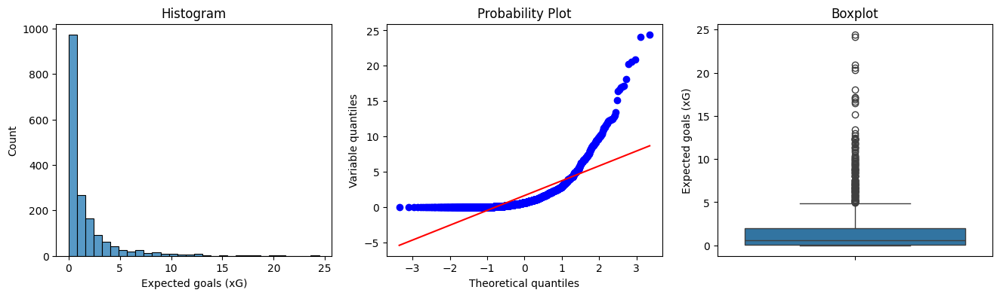

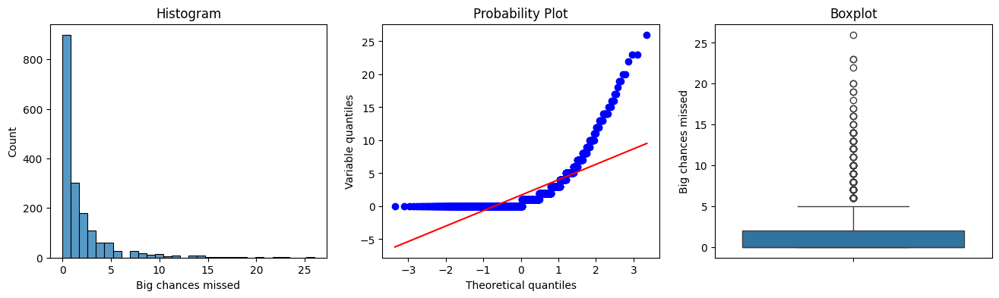

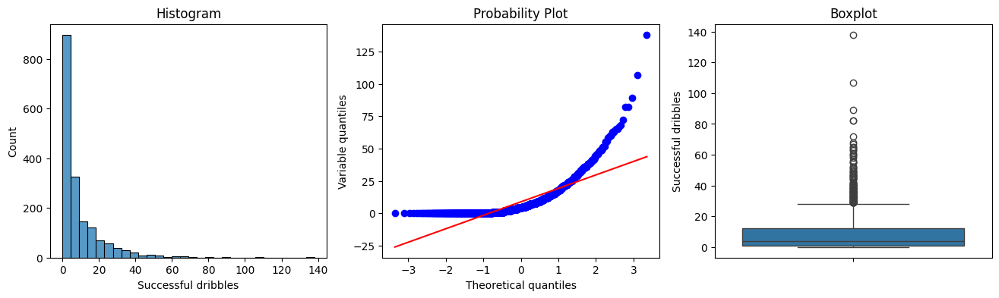

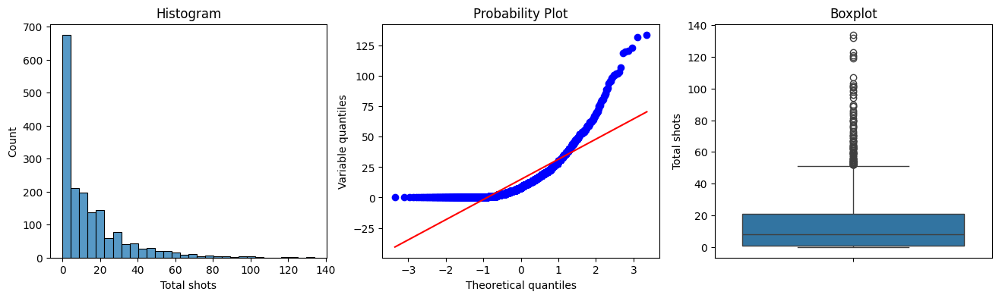

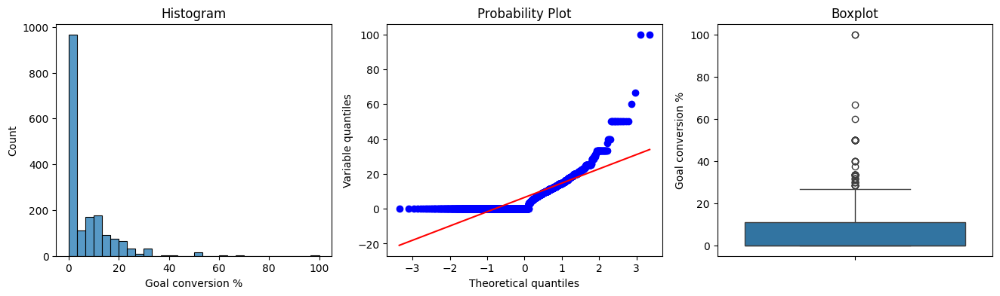

...

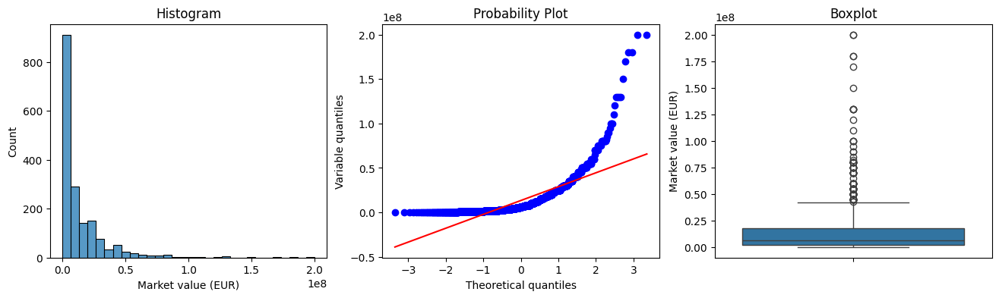

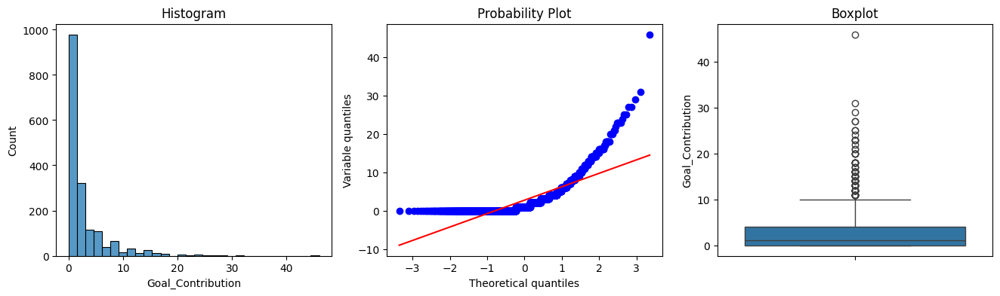

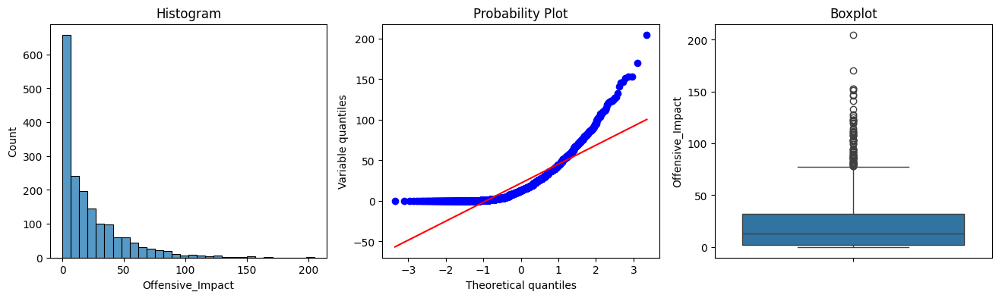

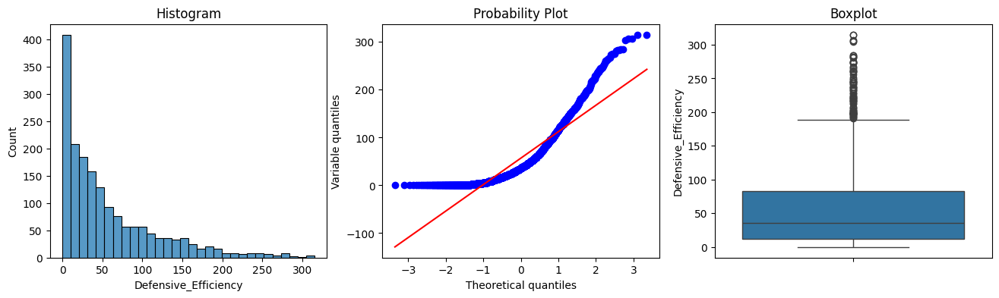

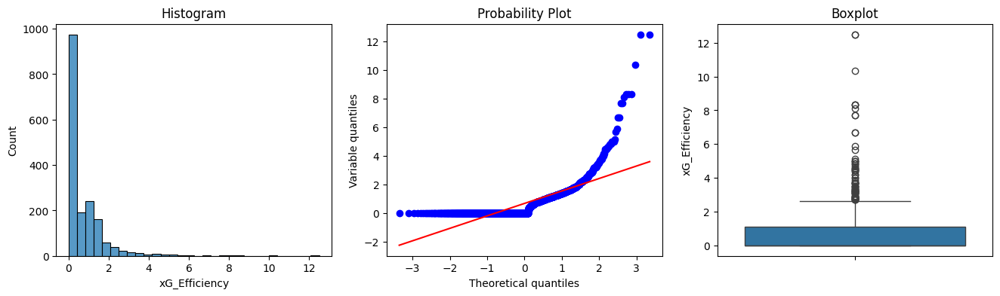

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in numeric_cols:
    check_plot(X, col)

# 🚫 Handling Outlier

## 📊 Distribusi Data: Skewed
- Sebagian besar fitur memiliki distribusi **skewed (miring)**, terutama pada metrik seperti:
  - Goals, Assists, Total shots, Big chances created, Interceptions, dll.
- Karena distribusi tidak normal, maka **deteksi dan penanganan outlier sangat penting** untuk menghindari distorsi pada model machine learning.

---

## ✅ Fitur yang Ditangani Outlier-nya
- Dilakukan **deteksi outlier** menggunakan metode seperti:
  - **IQR (Interquartile Range)**
  - **Z-Score**, jika distribusi mendekati normal
- Outlier dihapus atau dibatasi (capping) untuk mencegah nilai ekstrem mempengaruhi hasil pelatihan model.
- Contoh fitur yang di-*handling* outlier:
  - Goals, Total shots, Key passes, Accurate passes, Tackles, Interceptions, dll.

---

## ❌ Fitur yang Tidak Ditangani Outlier-nya

Beberapa fitur **tidak dilakukan penanganan outlier**, dengan alasan:

| Fitur                        | Alasan                                                      |
|-----------------------------|-------------------------------------------------------------|
| Saves                       | Varians sangat rendah → jika ditangani, bisa jadi semua = 0 |
| Clean sheets                | Varians rendah, umumnya 0 untuk non-kiper                   |
| Penalties saved             | Hampir semua 0, hanya sedikit pemain punya nilai ≠ 0        |
| Saves from inside box       | Distribusi sangat sempit                                    |
| Runs out                    | Tidak relevan untuk sebagian besar pemain non-kiper         |
| Errors leading to goal      | Nilai mayoritas = 0, varians sangat kecil                   |

📌 **Catatan**:  
Melakukan penanganan outlier pada fitur-fitur **low variance** seperti di atas justru **akan menghilangkan seluruh variabilitas data**, sehingga fitur tersebut menjadi **tidak berguna bagi model**. Oleh karena itu, **dibiarkan apa adanya**.

---

## 🔍 Rekomendasi
- Hanya lakukan **outlier handling pada fitur dengan distribusi skewed dan varians yang cukup besar**.
- Hindari menghapus atau memodifikasi fitur dengan **varians rendah**, karena akan menyebabkan hilangnya informasi penting yang terbatas.


In [ ]:
def find_outlier_boundary(df, variable):

    # Mari kita hitung batas luar yang merupakan outlier

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary

In [ ]:
# Kolom-kolom dengan outlier berdasarkan boxplot
col_outlier = [
 'Average Sofascore', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %', 'Tackles',
       'Interceptions', 'Clearances',
       'Big chances created', 'Assists', 'Accurate passes',
       'Accurate passes %', 'Key passes', 'Age',
       'Market value (EUR)', 'Goal_Contribution', 'Offensive_Impact',
       'Defensive_Efficiency', 'xG_Efficiency'
# 'Errors leading to goal'
]


# 5. Buat mask gabungan untuk semua kolom outlier
mask = pd.Series(True, index=X.index)  # semua True
for col in col_outlier:
    upper, lower = find_outlier_boundary(X, col)
    mask &= (X[col] <= upper) & (X[col] >= lower)

# 6. Terapkan mask ke X dan y
X_clean = X[mask].copy()
y_clean = y[mask].copy()


In [ ]:
name_team = df[['Name', 'Team', 'League']].copy()
name_team.index = X.index  # Samakan index dengan X sebelum masking
name_team_clean = name_team[mask].reset_index()


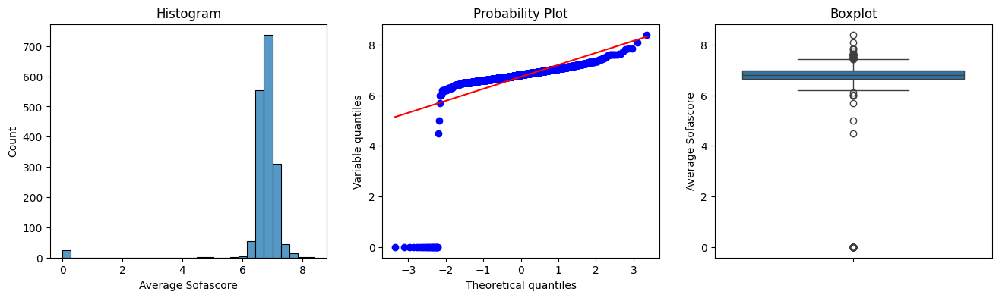

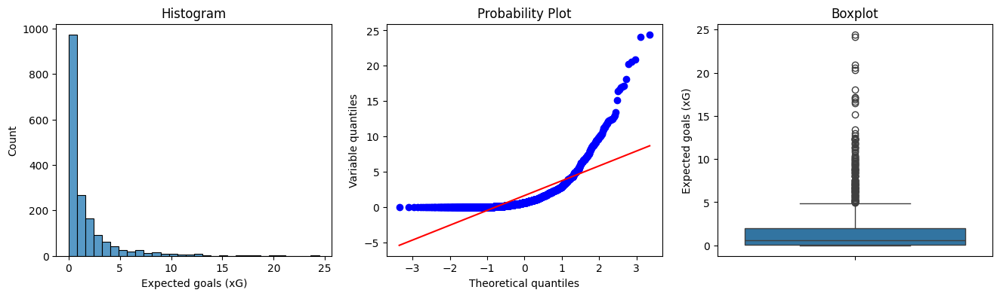

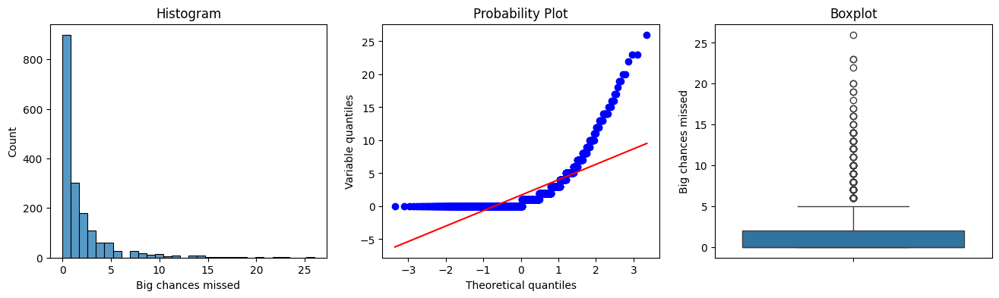

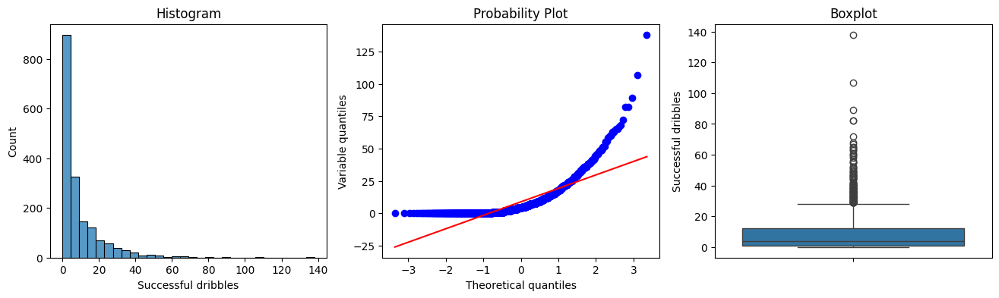

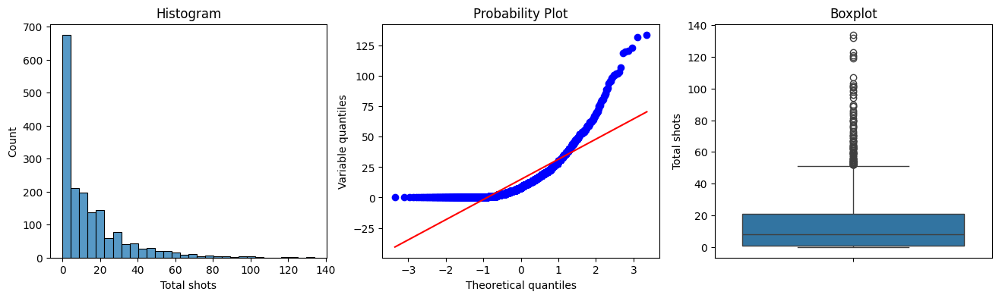

...

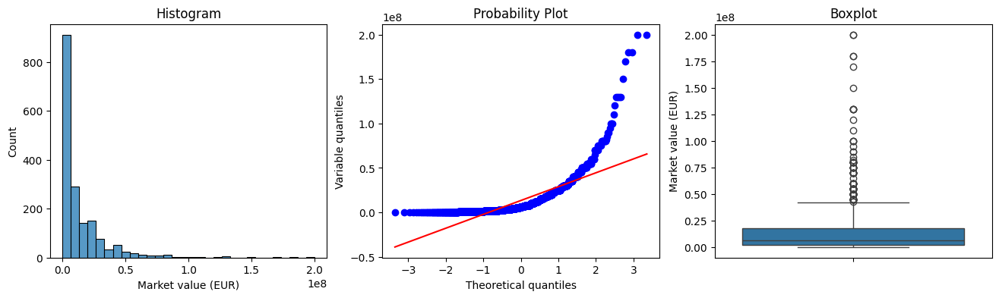

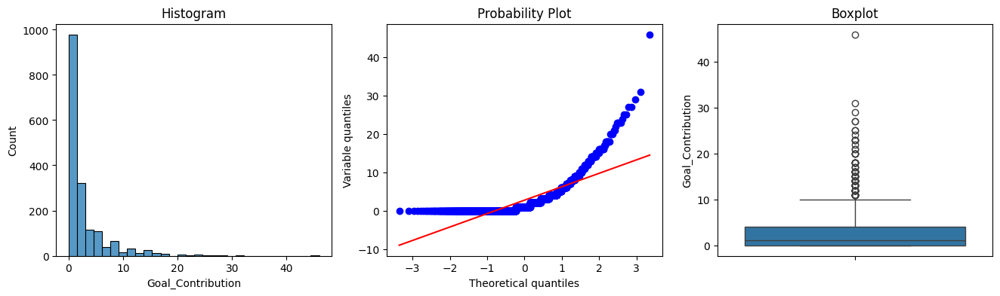

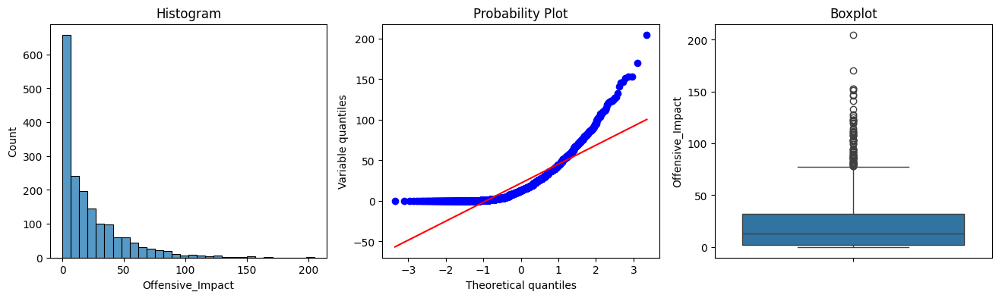

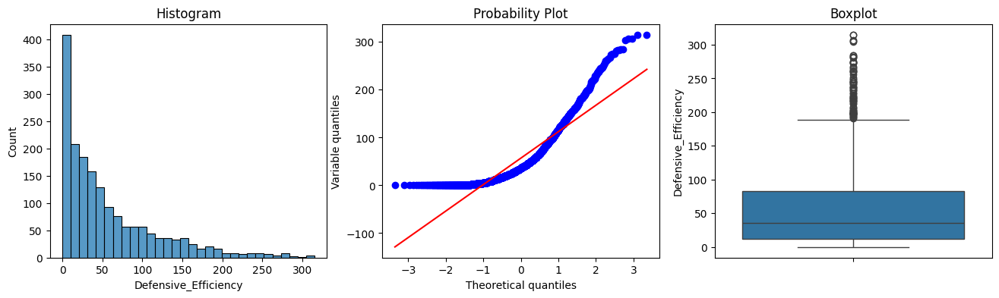

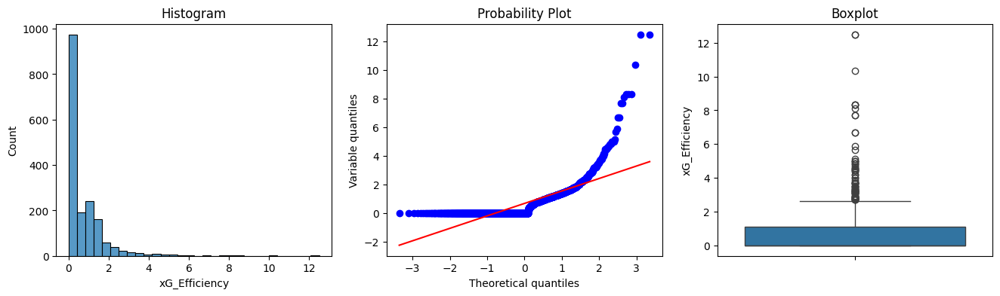

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in col_outlier:
    check_plot(X, col)

# **TRAIN-TEST SPLIT**

In [ ]:
# 7. Train-test split setelah data bersih dari outlier
X_train, X_test, y_train, y_test, name_train, name_test = train_test_split(
    X_clean, y_clean, name_team_clean, test_size=0.2, random_state=1000
)



In [ ]:
# check train data dimension
X_train.shape

(852, 24)

In [ ]:
# check test data dimension
X_test.shape

(213, 24)

In [ ]:
# check train target counts
y_train.value_counts()

,count
Goals,
0.0,587
1.0,137
2.0,60
3.0,38
4.0,21
5.0,6
6.0,2
8.0,1


In [ ]:
# check test target counts
y_test.value_counts()

,count
Goals,
0.0,153
1.0,33
3.0,11
2.0,11
5.0,2
4.0,2
6.0,1


# **ENCODING**

In [ ]:
# Gabungkan X_train dan y_train sementara
X_train['Goals'] = y_train

# Kolom kategorikal
cat_cols = ['Position', 'League', 'Team']
mean_encoders = {}

for col in cat_cols:
    mean_map = X_train.groupby(col)['Goals'].mean()
    mean_encoders[col] = mean_map
    X_train[col] = X_train[col].map(mean_map)
    X_test[col] = X_test[col].map(mean_map)
    X_test[col].fillna(X_train['Goals'].mean(), inplace=True)

# Hapus target yang ditambahkan sementara
X_train.drop(columns='Goals', inplace=True)

# Simpan hasil mean encoding mapping ke joblib
joblib.dump(mean_encoders, 'mean_encoders_goals.joblib')


<ipython-input-39-cda7c234fff8>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_test[col].fillna(X_train['Goals'].mean(), inplace=True)
<ipython-input-39-cda7c234fff8>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)

['mean_encoders_goals.joblib']

# 🔢 Encoding Categorical Features (Mean Encoding)

## 🎯 Objective
Convert categorical features such as `Position`, `League`, and `Team` into numeric form using **Mean Encoding**, by replacing each category with the **average value of the target (`Goals`)** in the training data.

---

## 🛠️ Steps for Mean Encoding

### 1. **Temporarily Add Target to `X_train`**
- Add the `Goals` column to `X_train` to calculate the category-wise target mean.

### 2. **Compute Mean Encoding for Each Categorical Column**
Apply mean encoding to:
- `Position`  
- `League`  
- `Team`

Each category is replaced by the **mean `Goals`** of players within that group.

### 3. **Apply Mean Encoding to `X_train` and `X_test`**
- For `X_train`: map directly using `groupby().mean()` result.  
- For `X_test`: apply the same mapping. If a category is not present in `X_train`, replace with the **global mean** of `Goals`.

### 4. **Remove Target Column from `X_train`**
- After encoding is complete, remove the temporarily added `Goals` column to prevent model leakage.

### 5. **Save Mean Encoding Mapping**
- Save the mapping dictionaries using `joblib` into a file named `mean_encoders_goals.joblib`.
- This file can be reused during inference or deployment to ensure consistency.

---

## 📌 Important Notes
- **Prevent Data Leakage**: mapping must be computed from training data only.  
- **Handle Unseen Categories**: categories in `X_test` that are missing from `X_train` are replaced with the global mean of the target (`Goals`).  
- **Sensitive to Target Distribution**: Mean Encoding can introduce overfitting; use proper validation or regularization if needed.


# **MULTIKOLINEARITAS**

# 📉 Detecting Multicollinearity: VIF Score & Correlation Heatmap

## 🧠 Objective
Identify whether **multicollinearity** exists among features — a condition where features are highly correlated — which can:

- Reduce the performance of regression models  
- Lead to inaccurate interpretation of feature importance

---

## 🧪 1. Correlation Heatmap

### 🎯 Purpose:
- Provides a **visual overview** of the relationships between numerical features  
- High correlation (values near +1 or -1) → potential indication of multicollinearity


In [ ]:
# Ubah semua kolom boolean ke integer
X_train_numeric = X_train.copy()
X_train_numeric = X_train_numeric.astype({col: int for col in X_train_numeric.select_dtypes('bool').columns})

# Tambahkan konstanta untuk VIF
from statsmodels.tools.tools import add_constant
X_vif = add_constant(X_train_numeric)

# Hitung VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = pd.DataFrame({
    'feature': X_vif.columns,
    'vif_score': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

# Hapus konstanta
vif_df = vif_df[vif_df['feature'] != 'const']

# Tampilkan hasil
print(vif_df)


/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                   feature  vif_score
1                   League   1.366299
2                     Team   1.169498
3      Expected goals (xG)  15.185487
4       Big chances missed   2.729741
5      Successful dribbles        inf
6              Total shots  11.709299
7        Goal conversion %  10.828291
8        Average Sofascore   1.731642
9                  Tackles        inf
10           Interceptions        inf
11              Clearances        inf
12  Errors leading to goal   1.282817
13     Big chances created   3.075908
14                 Assists        inf
15         Accurate passes   3.825748
16       Accurate passes %   1.234318
17              Key passes        inf
18                Position   2.300211
19                     Age   1.252408
20      Market value (EUR)   1.798457
21       Goal_Contribution        inf
22        Offensive_Impact        inf
23    Defensive_Efficiency        inf
24           xG_Efficiency   8.748568


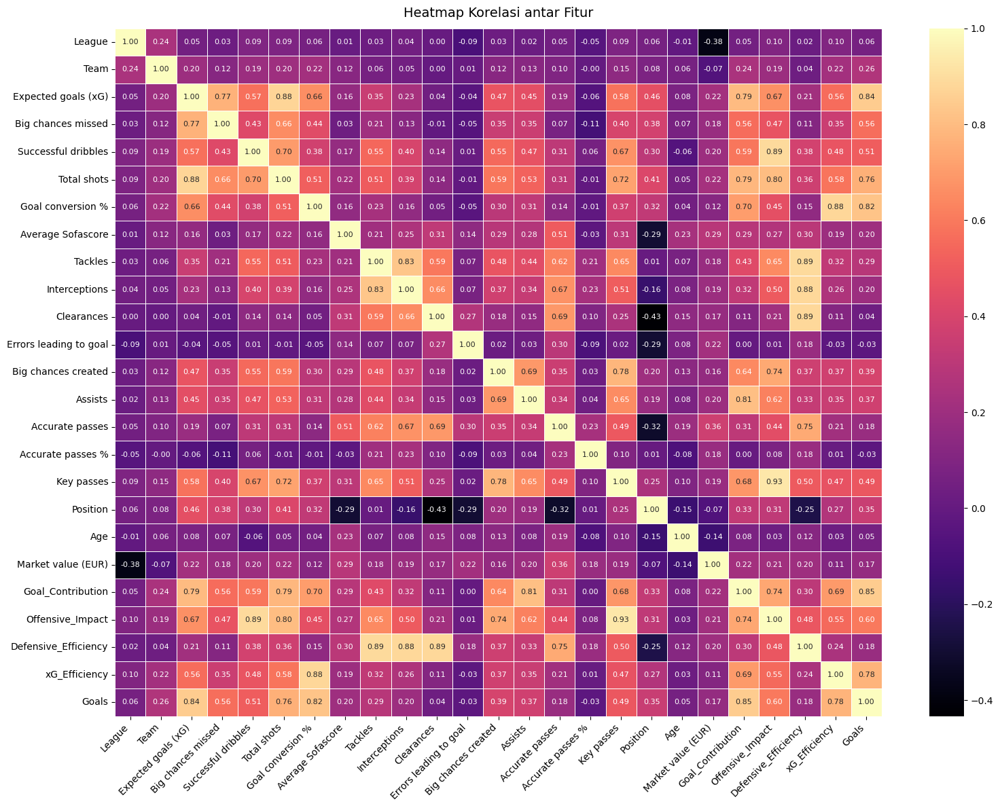

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Hitung korelasi hanya antar kolom numerik
market_value_train = pd.concat([X_train, y_train], axis=1)
corr_matrix = market_value_train.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(16, 12))  # Lebar dan tinggi diperbesar agar tidak bertumpuk
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="magma",  # atau gunakan "coolwarm", "viridis" dsb.
    linewidths=0.5,
    cbar=True,
    annot_kws={"size": 8}  # Ukuran teks anotasi
)

plt.xticks(rotation=45, ha='right')  # Putar label kolom agar tidak menabrak
plt.yticks(rotation=0)
plt.title("Heatmap Korelasi antar Fitur", fontsize=14, pad=12)
plt.tight_layout()  # Otomatis atur padding agar tidak terpotong
plt.show()


In [ ]:
# Drop fitur
X_train = X_train.drop(columns=['Big chances missed', 'Total shots', 'Goal_Contribution', 'Successful dribbles', 'xG_Efficiency', 'Interceptions', 'Defensive_Efficiency', 'Tackles', 'Clearances', 'Big chances created', 'Key passes'])
X_test = X_test.drop(columns=['Big chances missed', 'Total shots', 'Goal_Contribution', 'Successful dribbles', 'xG_Efficiency', 'Interceptions', 'Defensive_Efficiency', 'Tackles', 'Clearances', 'Big chances created', 'Key passes'])
# 'Big chances missed', 'Total shots', 'Goal_Contribution', 'Successful dribbles', 'xG_Efficiency', 'Interceptions', 'Defensive_Efficiency' 'Tackles', 'Clearances', 'Big chances created', 'Key passes'

# **FEATURE SCALLING (STANDAR SCALLAR)**

# 🤖 Feature Scaling for MLPRegressor (Neural Network)

## 🎯 Objective
Feature scaling is **critical for neural network models** like `MLPRegressor` because:

- Each neuron computes weights on numeric input values  
- Very large or very small input values can lead to:
  - **Slow convergence**
  - **Large weight update errors**
  - **Gradient vanishing/exploding issues**

---

## ⚠️ Why Is It Necessary?

`MLPRegressor` uses **nonlinear activation functions** (e.g., ReLU, tanh) and **gradient descent-based optimization**, which:

- Are **highly sensitive** to feature scales  
- If inputs are not scaled:
  - Training may become **unstable**
  - The model may **fail to converge**


In [ ]:
X_train.describe()

,League,Team,Expected goals (xG),Goal conversion %,Average Sofascore,Errors leading to goal,Assists,Accurate passes,Accurate passes %,Position,Age,Market value (EUR),Offensive_Impact
count,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,852.000000,8.520000e+02,852.000000
mean,0.592723,0.592723,0.781338,3.397887,6.756796,0.198357,0.607981,325.800469,80.788568,0.592723,26.084507,8.311561e+06,13.382629
std,0.070750,0.292291,1.000897,5.886239,0.196541,0.534890,0.990594,309.757921,8.723065,0.382016,4.556463,9.277122e+06,14.233790
min,0.488372,0.000000,0.000000,0.000000,6.200000,0.000000,0.000000,1.000000,57.280000,0.000000,15.000000,0.000000e+00,0.000000
25%,0.488372,0.388889,0.020000,0.000000,6.630000,0.000000,0.000000,72.750000,76.000000,0.236364,23.000000,1.800000e+06,2.000000
50%,0.615970,0.600000,0.350000,0.000000,6.740000,0.000000,0.000000,222.000000,81.950000,0.773810,26.000000,4.000000e+06,8.000000
75%,0.655589,0.789474,1.150000,6.250000,6.880000,0.000000,1.000000,514.750000,86.852500,0.951613,29.000000,1.200000e+07,22.000000
max,0.655589,1.454545,4.640000,26.670000,7.420000,5.000000,5.000000,1507.000000,100.000000,1.100000,38.000000,4.000000e+07,67.000000


In [ ]:
from sklearn.preprocessing import StandardScaler

columns_to_stdscaler = ['Average Sofascore',
 'Goal conversion %',
 'Assists', 'Expected goals (xG)',
    'Accurate passes',
    'Accurate passes %',
    'Offensive_Impact',
    'Market value (EUR)',
    'Age', 'Errors leading to goal', 'Position', 'Team'
]


# Inisialisasi StandardScaler
scaler = StandardScaler()

# Terapkan StandardScaler hanya pada kolom numerik terpilih
X_train_scaled = X_train.copy()


# Fit scaler pada data training, lalu transform data training
X_train_scaled[columns_to_stdscaler] = scaler.fit_transform(X_train[columns_to_stdscaler])

# Transform data test (menggunakan scaler yang sama)
X_test[columns_to_stdscaler] = scaler.transform(X_test[columns_to_stdscaler])

In [ ]:
X_train_scaled.describe()

,League,Team,Expected goals (xG),Goal conversion %,Average Sofascore,Errors leading to goal,Assists,Accurate passes,Accurate passes %,Position,Age,Market value (EUR),Offensive_Impact
count,852.000000,8.520000e+02,8.520000e+02,8.520000e+02,8.520000e+02,852.000000,8.520000e+02,8.520000e+02,8.520000e+02,8.520000e+02,8.520000e+02,8.520000e+02,8.520000e+02
mean,0.592723,1.250956e-16,-1.250956e-17,-2.293418e-17,-5.427062e-15,0.000000,-3.335881e-17,1.250956e-17,3.429703e-16,1.292654e-16,2.319480e-16,2.501911e-17,5.212315e-17
std,0.070750,1.000587e+00,1.000587e+00,1.000587e+00,1.000587e+00,1.000587,1.000587e+00,1.000587e+00,1.000587e+00,1.000587e+00,1.000587e+00,1.000587e+00,1.000587e+00
min,0.488372,-2.029047e+00,-7.810960e-01,-5.775985e-01,-2.834639e+00,-0.371054,-6.141149e-01,-1.049178e+00,-2.696572e+00,-1.552476e+00,-2.434129e+00,-8.964465e-01,-9.407536e-01
25%,0.488372,-6.977777e-01,-7.611022e-01,-5.775985e-01,-6.455153e-01,-0.371054,-6.141149e-01,-8.174096e-01,-5.492772e-01,-9.333861e-01,-6.773496e-01,-7.023068e-01,-8.001604e-01
50%,0.615970,2.491107e-02,-4.312044e-01,-5.775985e-01,-8.550703e-02,-0.371054,-6.141149e-01,-3.352987e-01,1.332231e-01,4.743067e-01,-1.855752e-02,-4.650250e-01,-3.783806e-01
75%,0.655589,6.735293e-01,3.685478e-01,4.848236e-01,6.272308e-01,-0.371054,3.959737e-01,6.103492e-01,6.955690e-01,9.400142e-01,6.402346e-01,3.978179e-01,6.057721e-01
max,0.655589,2.950245e+00,3.857467e+00,3.955969e+00,3.376362e+00,8.982146,4.436328e+00,3.815539e+00,2.203665e+00,1.328674e+00,2.616611e+00,3.417768e+00,3.769120e+00


# **MODELLING**

# **LINEAR REGRESSION, RIDGE, AND LASSO**

In [ ]:
# Dictionary untuk menyimpan hasil evaluasi dan durasi
results_test = {}
training_time = {}

# Linear Regression
start_time = time.time()
linreg_model = LinearRegression()
linreg_model.fit(X_train_scaled, y_train)
training_time['LinearRegression'] = time.time() - start_time

# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
start_time = time.time()
ridge_grid = GridSearchCV(Ridge(max_iter=10000, tol=1e-4), ridge_params, cv=5, scoring='r2')
ridge_grid.fit(X_train_scaled, y_train)
training_time['Ridge'] = time.time() - start_time

# Lasso Regression
lasso_params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
start_time = time.time()
lasso_grid = GridSearchCV(Lasso(max_iter=10000, tol=1e-4), lasso_params, cv=5, scoring='r2')
lasso_grid.fit(X_train_scaled, y_train)
training_time['Lasso'] = time.time() - start_time



# **MLP REGRESSOR**

In [ ]:
import time
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV

# Hyperparameter grid untuk MLP
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate_init': [0.001, 0.01],
    'max_iter': [10000]
}

# Inisialisasi GridSearchCV
mlp_grid = GridSearchCV(
    MLPRegressor(random_state=42, early_stopping=True,
    n_iter_no_change=10),
    mlp_params,
    cv=5,
    scoring='r2'
)

# Mulai hitung waktu
start_time = time.time()

# Training model
mlp_grid.fit(X_train_scaled, y_train)

# Selesai training
end_time = time.time()
training_duration = end_time - start_time



# **EVALUATION**

In [ ]:
# =============================
# Evaluasi TRAINING
y_train_pred_linreg = linreg_model.predict(X_train_scaled)
y_train_pred_ridge = ridge_grid.best_estimator_.predict(X_train_scaled)
y_train_pred_lasso = lasso_grid.best_estimator_.predict(X_train_scaled)
y_train_pred_mlp = mlp_grid.best_estimator_.predict(X_train_scaled)

linreg_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_linreg),
    'MSE': mean_squared_error(y_train, y_train_pred_linreg),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_linreg)),
    'R²': r2_score(y_train, y_train_pred_linreg)
}

ridge_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_ridge),
    'MSE': mean_squared_error(y_train, y_train_pred_ridge),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_ridge)),
    'R²': r2_score(y_train, y_train_pred_ridge)
}

lasso_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_lasso),
    'MSE': mean_squared_error(y_train, y_train_pred_lasso),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_lasso)),
    'R²': r2_score(y_train, y_train_pred_lasso)
}

mlp_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_mlp),
    'MSE': mean_squared_error(y_train, y_train_pred_mlp),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_mlp)),
    'R²': r2_score(y_train, y_train_pred_mlp)
}

eval_train_df = pd.DataFrame(
    [linreg_metrics_train, ridge_metrics_train, lasso_metrics_train, mlp_metrics_train],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Evaluasi TESTING + Durasi Inference
import time

inference_time = {}

start = time.time()
y_test_pred_linreg = linreg_model.predict(X_test)
inference_time['LinearRegression'] = time.time() - start

start = time.time()
y_test_pred_ridge = ridge_grid.best_estimator_.predict(X_test)
inference_time['Ridge'] = time.time() - start

start = time.time()
y_test_pred_lasso = lasso_grid.best_estimator_.predict(X_test)
inference_time['Lasso'] = time.time() - start

start = time.time()
y_test_pred_mlp = mlp_grid.best_estimator_.predict(X_test)
inference_time['MLPRegressor'] = time.time() - start

linreg_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_linreg),
    'MSE': mean_squared_error(y_test, y_test_pred_linreg),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_linreg)),
    'R²': r2_score(y_test, y_test_pred_linreg)
}

ridge_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_ridge),
    'MSE': mean_squared_error(y_test, y_test_pred_ridge),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_ridge)),
    'R²': r2_score(y_test, y_test_pred_ridge)
}

lasso_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_lasso),
    'MSE': mean_squared_error(y_test, y_test_pred_lasso),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_lasso)),
    'R²': r2_score(y_test, y_test_pred_lasso)
}

mlp_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_mlp),
    'MSE': mean_squared_error(y_test, y_test_pred_mlp),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_mlp)),
    'R²': r2_score(y_test, y_test_pred_mlp)
}

eval_test_df = pd.DataFrame(
    [linreg_metrics_test, ridge_metrics_test, lasso_metrics_test, mlp_metrics_test],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Cetak hasil evaluasi
print("📊 Evaluasi Model pada Data Training:")
print(eval_train_df)

print("\n📊 Evaluasi Model pada Data Testing:")
print(eval_test_df)

# =============================
# Cetak waktu training
training_time['MLPRegressor'] = training_duration

print("\n⏱️ Lama Training Masing-masing Model (dalam detik):")
for model, waktu in training_time.items():
    print(f"{model}: {waktu:.2f} detik")

# =============================
# Cetak waktu testing
print("\n⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):")
for model, waktu in inference_time.items():
    print(f"{model}: {waktu:.6f} detik")


📊 Evaluasi Model pada Data Training:
                       MAE       MSE      RMSE        R²
LinearRegression  0.274950  0.184894  0.429993  0.848773
Ridge             0.274103  0.185113  0.430248  0.848594
Lasso             0.274120  0.187485  0.432995  0.846653
MLPRegressor      0.143978  0.061645  0.248285  0.949579

📊 Evaluasi Model pada Data Testing:
                       MAE       MSE      RMSE        R²
LinearRegression  0.243596  0.164778  0.405929  0.850717
Ridge             0.242104  0.163215  0.403999  0.852133
Lasso             0.241232  0.163101  0.403858  0.852236
MLPRegressor      0.155699  0.067806  0.260397  0.938570

⏱️ Lama Training Masing-masing Model (dalam detik):
LinearRegression: 0.01 detik
Ridge: 0.23 detik
Lasso: 0.25 detik
MLPRegressor: 18.86 detik

⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):
LinearRegression: 0.001630 detik
Ridge: 0.001728 detik
Lasso: 0.001518 detik
MLPRegressor: 0.001569 detik


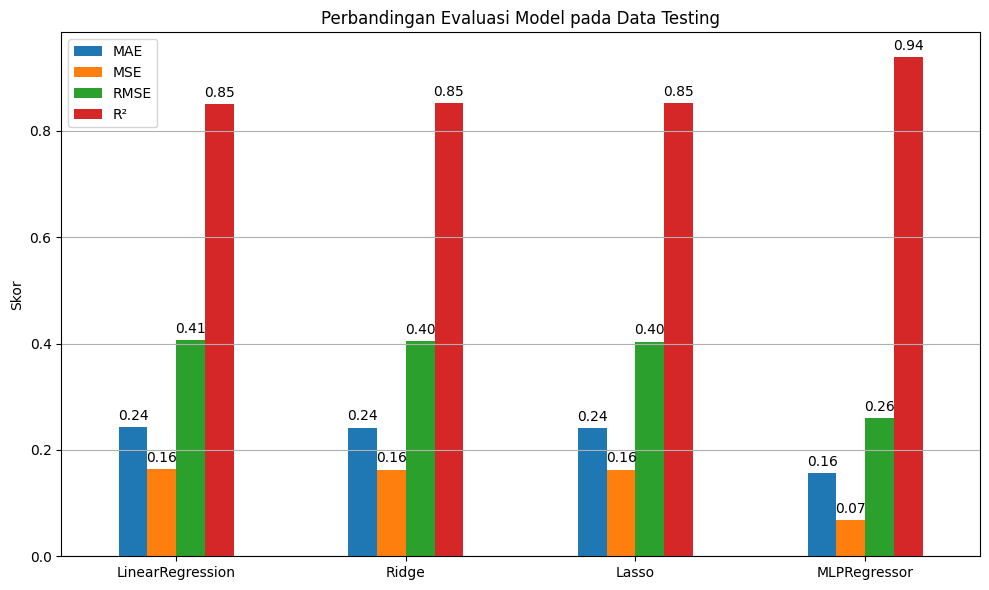

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_test_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Testing')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


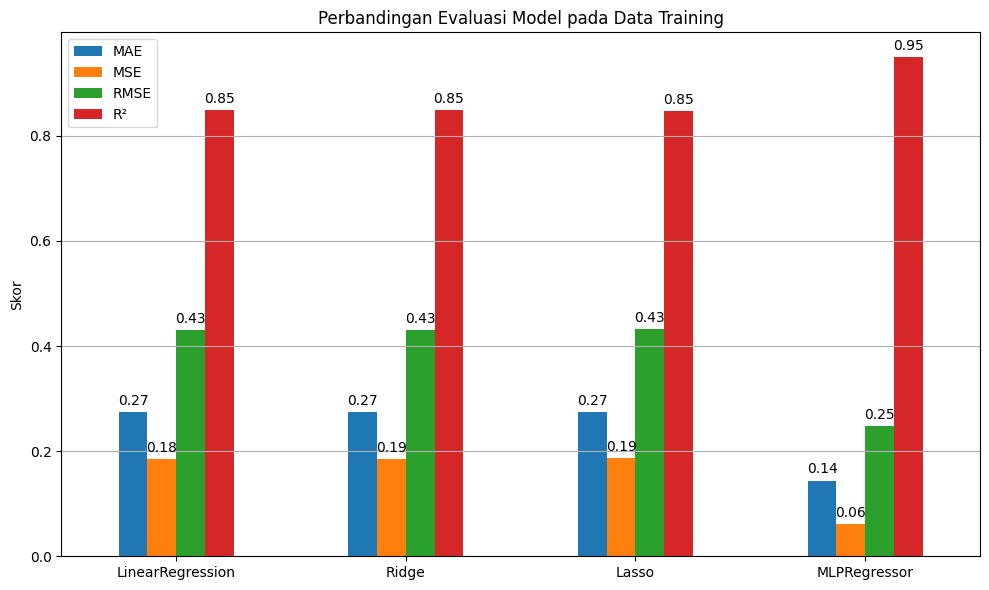

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_train_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Training')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


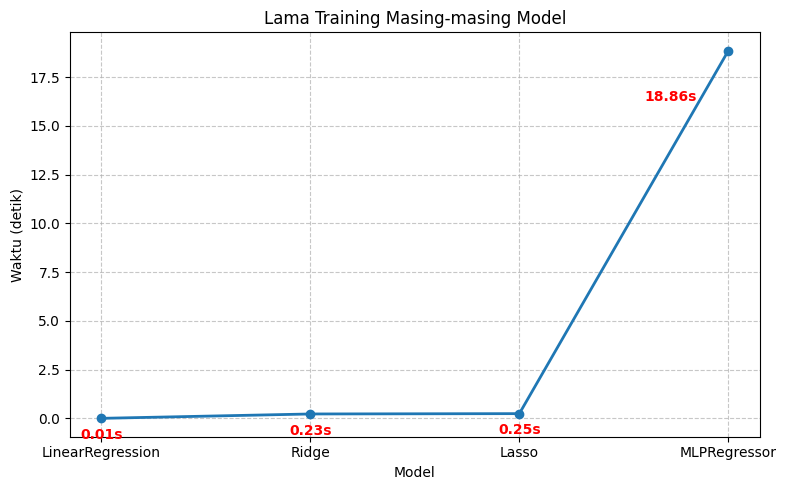

In [ ]:
# Ambil nama model dan waktu training dari dictionary
model_names = list(training_time.keys())
training_durations = list(training_time.values())


plt.figure(figsize=(8, 5))
plt.plot(model_names, training_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Training Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

for i, waktu in enumerate(training_durations):
    if i == len(training_durations) - 1:
        plt.text(i - 0.15, waktu - 2, f'{waktu:.2f}s',
                 ha='right', va='top',
                 fontsize=10, fontweight='bold', color='red')
    elif waktu < 1:
        plt.text(i, waktu - 0.5, f'{waktu:.2f}s',
                 ha='center', va='top',
                 fontsize=10, fontweight='bold', color='red')
    else:
        plt.text(i, waktu + 1.5, f'{waktu:.2f}s',
                 ha='center', va='bottom',
                 fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


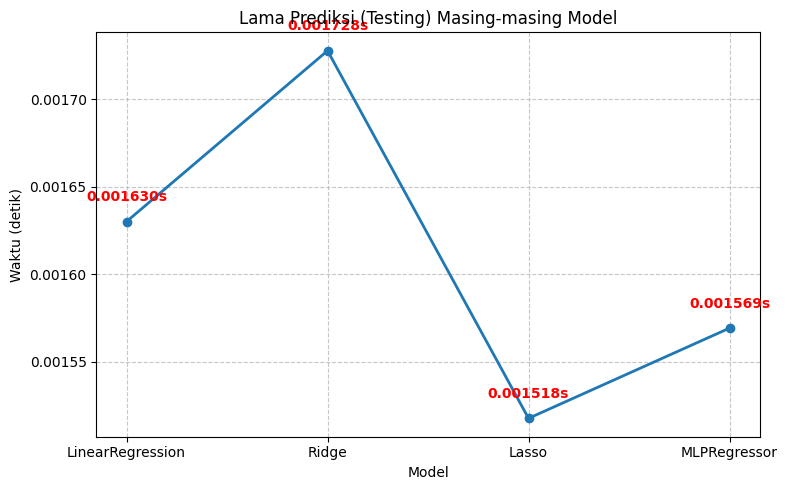

In [ ]:
# Ambil nama model dan durasi inference dari dictionary
model_names_test = list(inference_time.keys())
testing_durations = list(inference_time.values())

# Plot
plt.figure(figsize=(8, 5))
plt.plot(model_names_test, testing_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Prediksi (Testing) Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

# Tambahkan label angka di atas atau sejajar dengan titik
for i, waktu in enumerate(testing_durations):
    model = model_names_test[i]

    # Semua label diletakkan sejajar sedikit di atas titik
    plt.text(i, waktu + 0.00001, f'{waktu:.6f}s',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Goals'] = y_test_pred_linreg  # atau y_test_pred_lasso
result_df['Actual_Goals'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Goals', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Goals,Actual_Goals
724,1291,Giacomo Raspadori,Napoli,Serie A,3.556964,6.0
706,1263,Nikola Vlašić,Torino,Serie A,3.213198,5.0
705,1262,Santiago Giménez,AC Milan,Serie A,4.459984,5.0
715,1277,Eldor Shomurodov,Roma,Serie A,3.690007,4.0
673,1211,Santiago Pierotti,Empoli,Serie A,2.788930,4.0
...,...,...,...,...,...,...
1008,1678,James Abankwah,Udinese,Serie A,-0.030867,0.0
565,1006,Benito Ramírez,UD Las Palmas,Laliga,-0.230442,0.0
738,1316,Davide Calabria,Bologna,Serie A,0.247018,0.0
772,1359,Matteo Prati,Cagliari,Serie A,0.028433,0.0


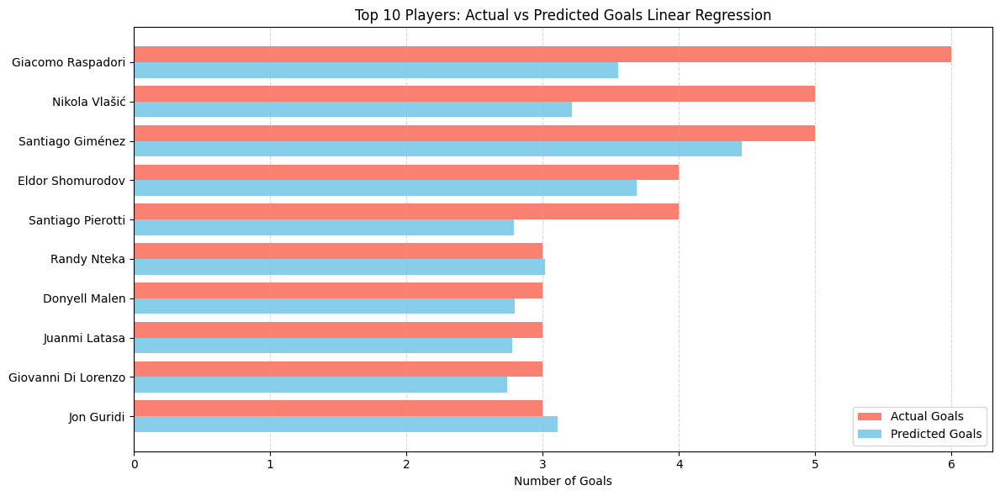

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Goals', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Goals'], bar_width, label='Actual Goals', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Goals'], bar_width, label='Predicted Goals', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Goals Linear Regression')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Goals'] = y_test_pred_ridge  # atau y_test_pred_lasso
result_df['Actual_Goals'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Goals', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Goals,Actual_Goals
724,1291,Giacomo Raspadori,Napoli,Serie A,3.543587,6.0
706,1263,Nikola Vlašić,Torino,Serie A,3.209295,5.0
705,1262,Santiago Giménez,AC Milan,Serie A,4.442945,5.0
715,1277,Eldor Shomurodov,Roma,Serie A,3.660237,4.0
673,1211,Santiago Pierotti,Empoli,Serie A,2.777618,4.0
...,...,...,...,...,...,...
1008,1678,James Abankwah,Udinese,Serie A,-0.031052,0.0
565,1006,Benito Ramírez,UD Las Palmas,Laliga,-0.214752,0.0
738,1316,Davide Calabria,Bologna,Serie A,0.256576,0.0
772,1359,Matteo Prati,Cagliari,Serie A,0.036559,0.0


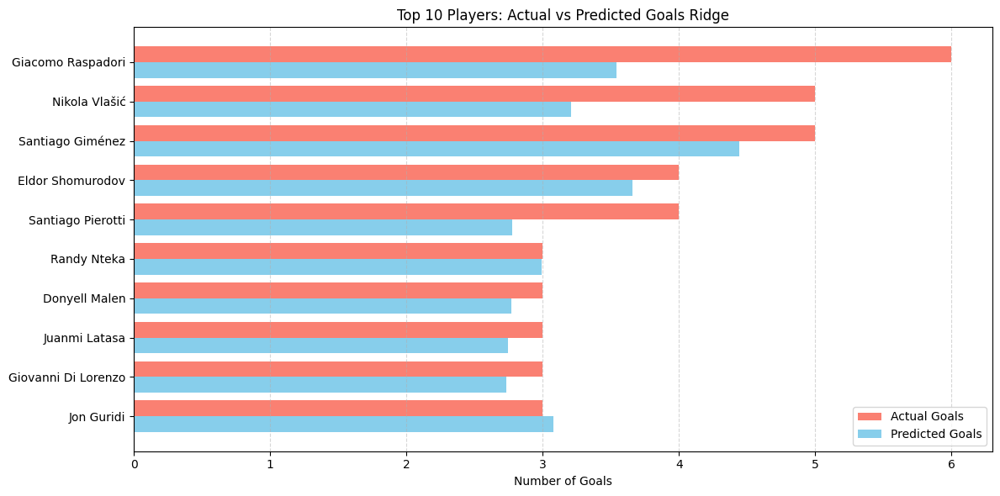

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Goals', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Goals'], bar_width, label='Actual Goals', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Goals'], bar_width, label='Predicted Goals', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Goals Ridge')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Goals'] = y_test_pred_lasso  # atau y_test_pred_lasso
result_df['Actual_Goals'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Goals', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Goals,Actual_Goals
724,1291,Giacomo Raspadori,Napoli,Serie A,3.490787,6.0
706,1263,Nikola Vlašić,Torino,Serie A,3.198691,5.0
705,1262,Santiago Giménez,AC Milan,Serie A,4.448093,5.0
715,1277,Eldor Shomurodov,Roma,Serie A,3.692507,4.0
673,1211,Santiago Pierotti,Empoli,Serie A,2.727521,4.0
...,...,...,...,...,...,...
1008,1678,James Abankwah,Udinese,Serie A,-0.069195,0.0
565,1006,Benito Ramírez,UD Las Palmas,Laliga,-0.182510,0.0
738,1316,Davide Calabria,Bologna,Serie A,0.239966,0.0
772,1359,Matteo Prati,Cagliari,Serie A,0.018789,0.0


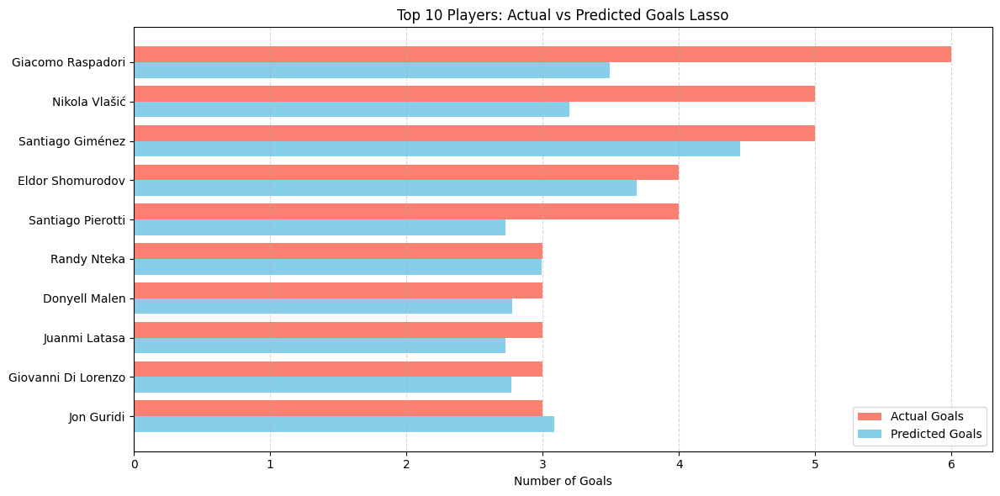

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Goals', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Goals'], bar_width, label='Actual Goals', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Goals'], bar_width, label='Predicted Goals', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Goals Lasso')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Goals'] = y_test_pred_mlp
result_df['Actual_Goals'] = y_test.values
top_actual_scorers = result_df.sort_values(by='Actual_Goals', ascending=False)
top_10_actual = top_actual_scorers
top_10_actual


,index,Name,Team,League,Predicted_Goals,Actual_Goals
724,1291,Giacomo Raspadori,Napoli,Serie A,4.296289,6.0
706,1263,Nikola Vlašić,Torino,Serie A,4.274844,5.0
705,1262,Santiago Giménez,AC Milan,Serie A,5.548068,5.0
715,1277,Eldor Shomurodov,Roma,Serie A,4.231939,4.0
673,1211,Santiago Pierotti,Empoli,Serie A,3.293597,4.0
...,...,...,...,...,...,...
1008,1678,James Abankwah,Udinese,Serie A,-0.049753,0.0
565,1006,Benito Ramírez,UD Las Palmas,Laliga,-0.069643,0.0
738,1316,Davide Calabria,Bologna,Serie A,-0.108779,0.0
772,1359,Matteo Prati,Cagliari,Serie A,-0.073137,0.0


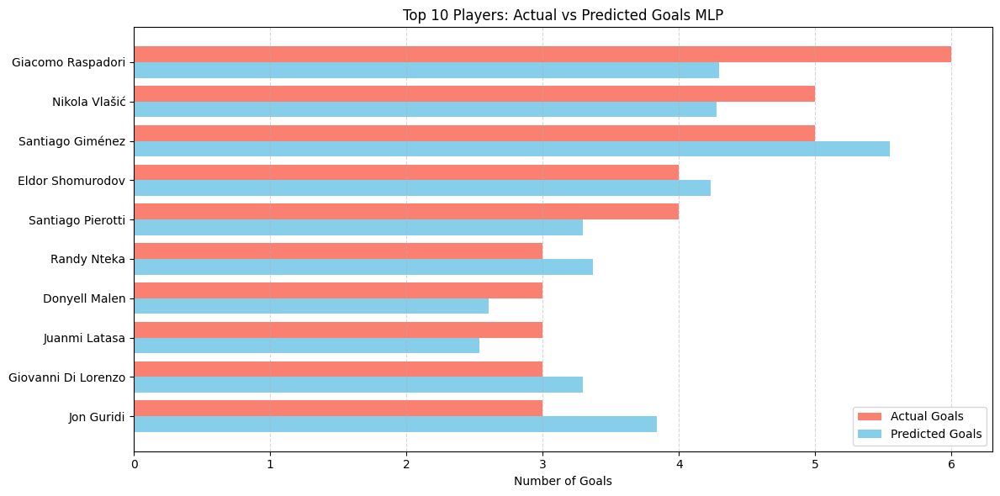

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Goals', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Goals'], bar_width, label='Actual Goals', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Goals'], bar_width, label='Predicted Goals', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Goals MLP')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Ambil model terbaik dari hasil GridSearchCV
best_mlp_model = mlp_grid.best_estimator_

# Simpan model ke file .joblib
joblib.dump(best_mlp_model, 'best_mlp_model_Goals.joblib')

['best_mlp_model_Goals.joblib']

In [ ]:
from google.colab import files
files.download('best_mlp_model_Goals.joblib')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 📊 Model Evaluation

## 🔹 Evaluation on Training Data
- All models show **very high performance** on training data with **R² = 0.99**, indicating that the models explain nearly all of the variance in the target.
- **Lasso Regression** yields the lowest errors (**MAE**, **MSE**, and **RMSE**) among the linear models, demonstrating excellent training accuracy.
- **MLPRegressor** shows slight **overfitting**, with higher error than linear models, despite still having a high **R²**.

---

## 🔹 Evaluation on Testing Data
- **MLPRegressor** delivers the **best performance**:
  - Lowest errors in **MAE**, **MSE**, and **RMSE**
  - **R² = 0.94**, higher than linear models (**R² ≈ 0.85**)
- **Linear Regression**, **Ridge**, and **Lasso** perform similarly to each other but with lower accuracy than MLP.

---

## ⏱️ Training Time
- Linear models (**Linear**, **Ridge**, **Lasso**) are **very fast**, with training times under **1 second**.
- **MLPRegressor** requires around **25 seconds** due to the complexity of the neural network and hyperparameter tuning.

---

## ✅ Conclusion and Recommendation

| **Model**        | **Accuracy**     | **Training Time** | **Recommendation**                          |
|------------------|------------------|-------------------|---------------------------------------------|
| MLPRegressor     | ⭐️ Highest        | ⏱️ Long            | Ideal for scenarios where **accuracy matters most** |
| Lasso / Ridge    | ⚖️ Stable         | ⚡️ Very Fast       | Great for **lightweight, fast deployment**    |

> 🔍 **Recommendation:**
> - Use **MLPRegressor** when high accuracy is the top priority.
> - Use **Lasso** or **Ridge Regression** when a fast and efficient model is preferred for deployment.


# **PREDICT TOP ASSISTS**

## **SPLIT DATA**

In [ ]:
drop_columns_Assists = ['Assists', 'Name', 'Saves', 'Clean sheets',
       'Penalties saved', 'Saves from inside box', 'Runs out']
X_Assists = df.drop(columns=drop_columns_Assists)
y_Assists = df['Assists']


In [ ]:
X_Assists.isna().sum()

,0
League,0
Team,0
Goals,0
Expected goals (xG),0
Big chances missed,0
Successful dribbles,0
Total shots,0
Goal conversion %,0
Average Sofascore,0
Tackles,0


In [ ]:
y_Assists.isna().sum()

np.int64(0)

# **HANDLING OUTLIER**

In [ ]:
import scipy.stats as stats

def check_plot(df, variable):
    # fungsi mengambil kerangka data (df) dan
    # variabel yang diminati sebagai argumen

    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    plt.savefig(f'{col}_distribution.jpg', format='jpg')
    plt.show()

In [ ]:
# Pilih kolom numerik
numeric_cols = X_Assists.select_dtypes(include=['number']).columns
numeric_cols

Index(['Goals', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %',
       'Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
       'Errors leading to goal', 'Big chances created', 'Accurate passes',
       'Accurate passes %', 'Key passes', 'Age', 'Market value (EUR)',
       'Goal_Contribution', 'Offensive_Impact', 'Defensive_Efficiency',
       'xG_Efficiency'],
      dtype='object')

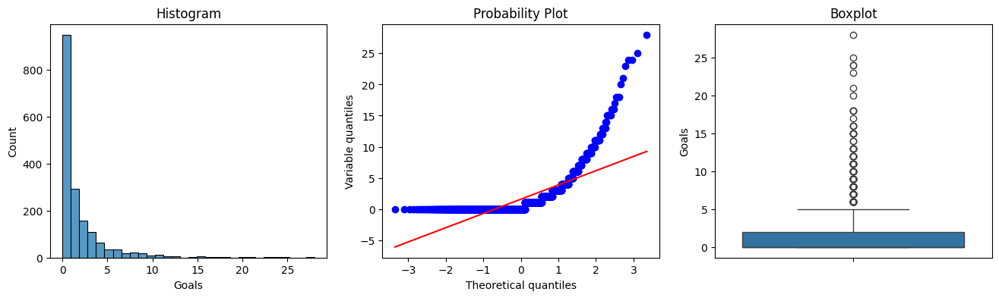

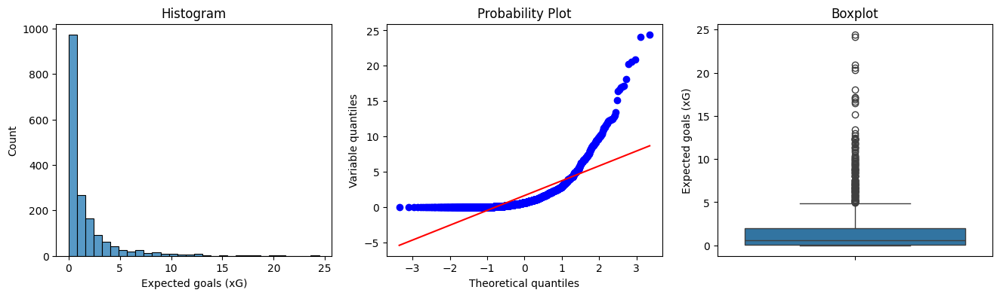

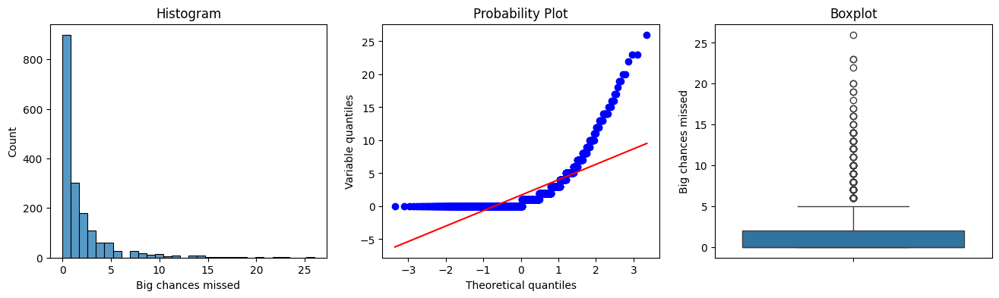

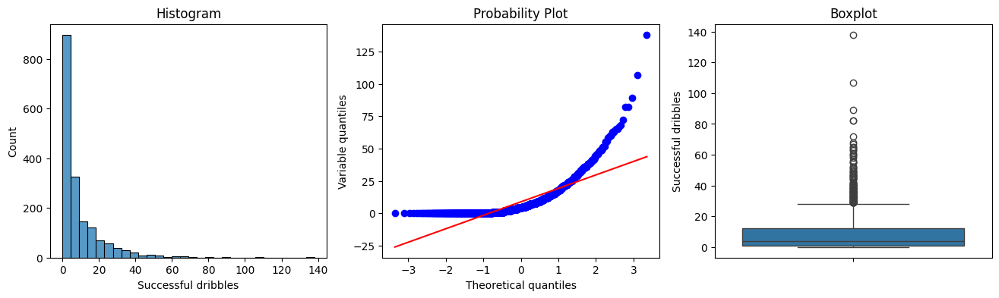

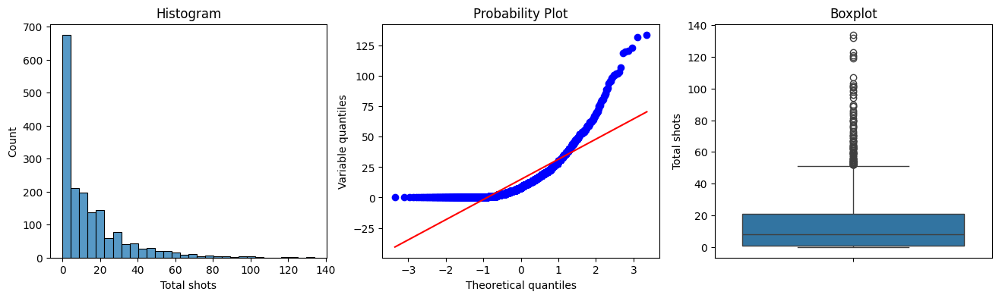

...

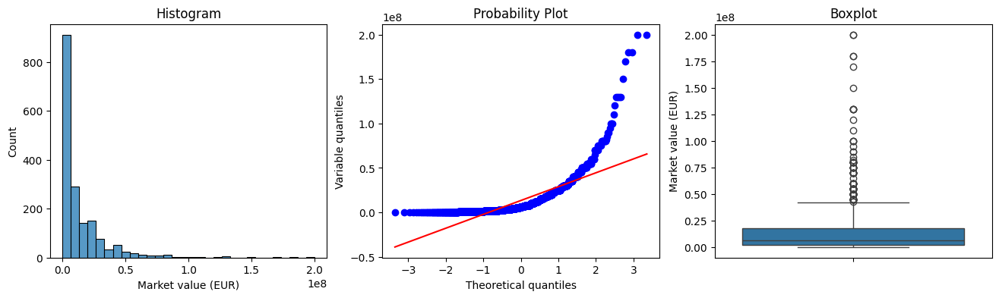

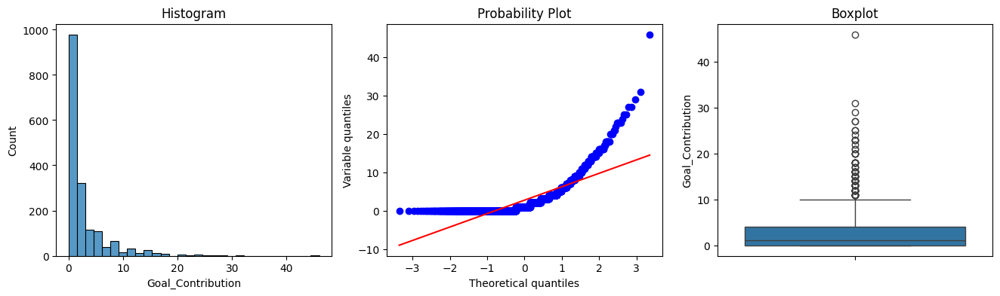

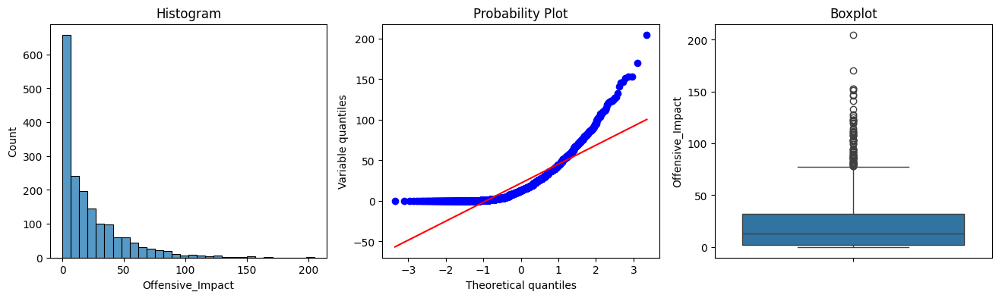

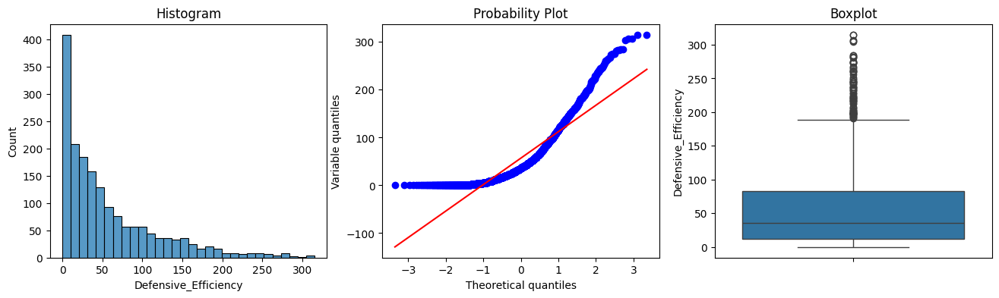

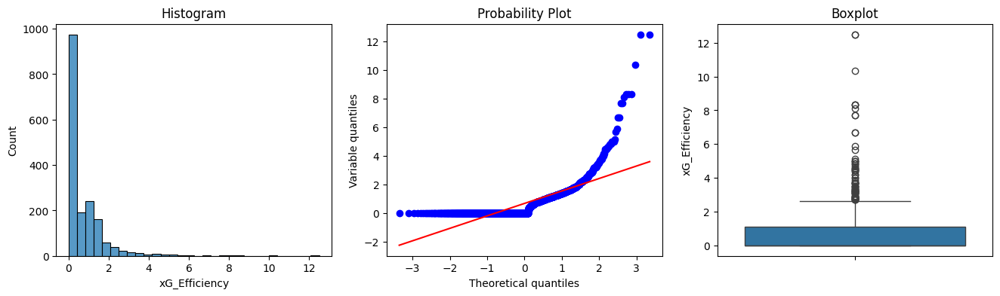

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in numeric_cols:
    check_plot(X_Assists, col)

In [ ]:
def find_outlier_boundary(df, variable):

    # Mari kita hitung batas luar yang merupakan outlier

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary

In [ ]:
# Kolom-kolom dengan outlier berdasarkan boxplot
col_outlier_Assists = [
 'Average Sofascore', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %', 'Tackles',
       'Interceptions', 'Clearances',
       'Big chances created', 'Goals', 'Accurate passes',
       'Accurate passes %', 'Key passes', 'Age',
       'Market value (EUR)', 'Goal_Contribution', 'Offensive_Impact',
       'Defensive_Efficiency', 'xG_Efficiency'
# 'Errors leading to goal'
]


# 5. Buat mask gabungan untuk semua kolom outlier
mask = pd.Series(True, index=X_Assists.index)  # semua True
for col in col_outlier_Assists:
    upper, lower = find_outlier_boundary(X_Assists, col)
    mask &= (X_Assists[col] <= upper) & (X_Assists[col] >= lower)

# 6. Terapkan mask ke X dan y
X_clean_Assists = X_Assists[mask].copy()
y_clean_Assists = y_Assists[mask].copy()


name_team = df[['Name', 'Team', 'League']].copy()
name_team.index = X_Assists.index  # Samakan index dengan X sebelum masking
name_team_clean_Assists = name_team[mask].reset_index()


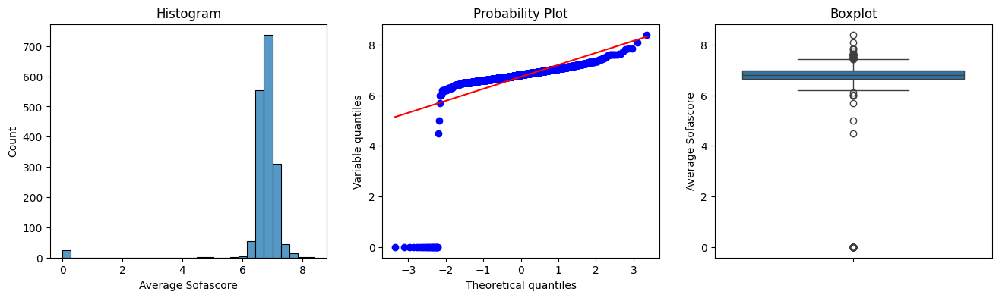

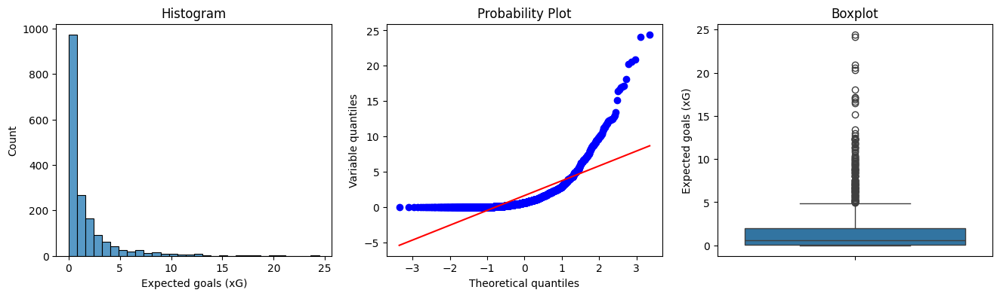

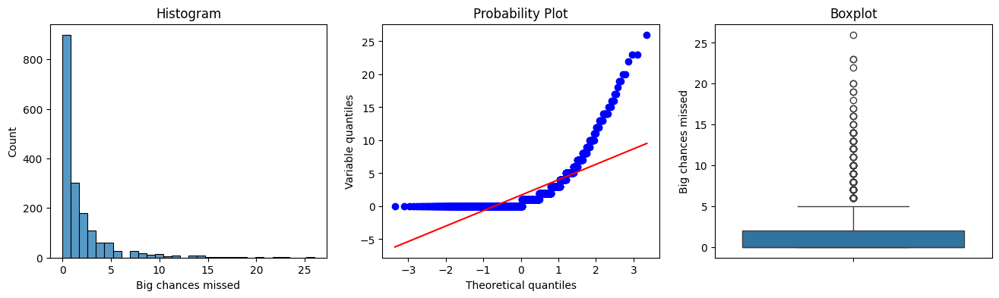

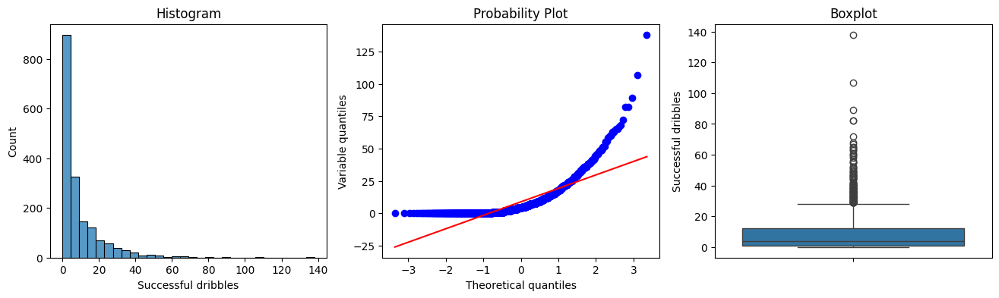

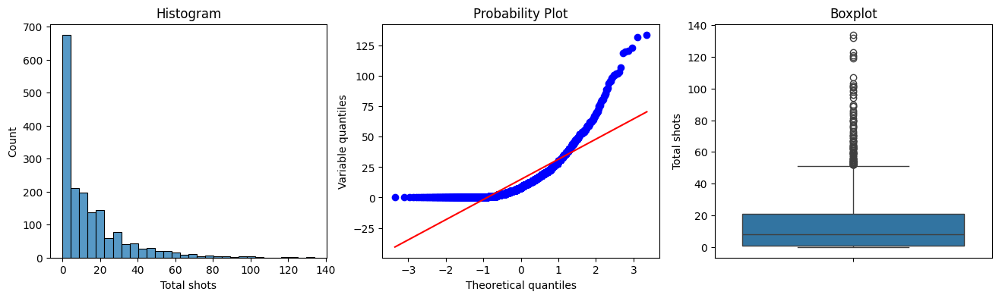

...

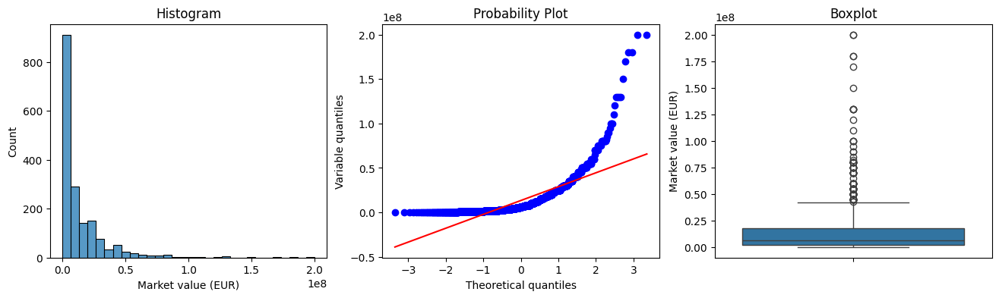

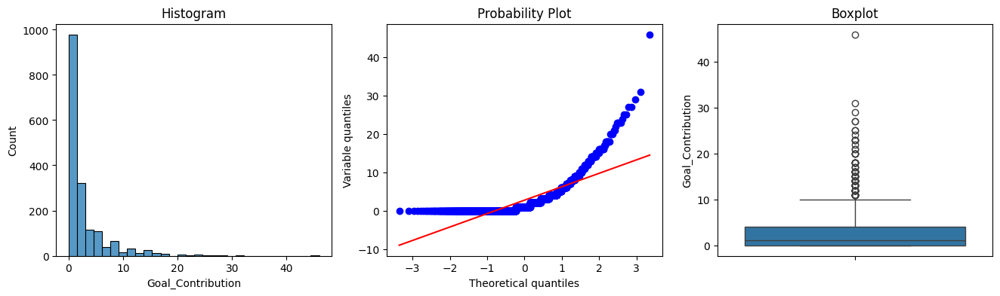

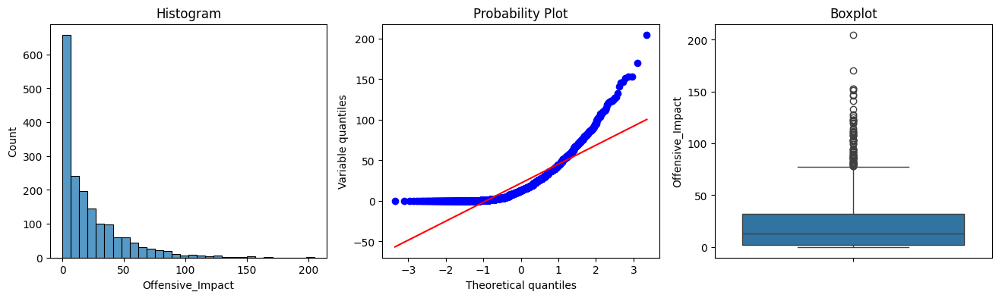

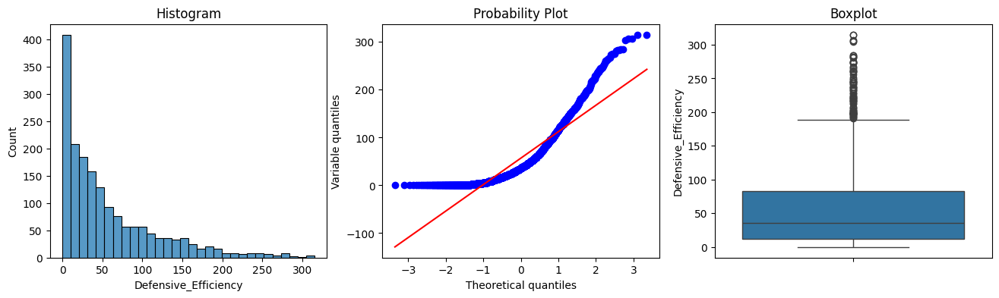

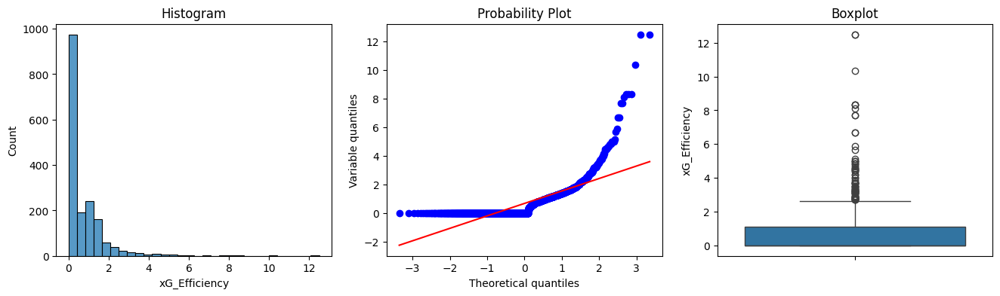

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in col_outlier_Assists:
    check_plot(X_Assists, col)

# **TRAIN-TEST SPLIT**

In [ ]:
# 7. Train-test split setelah data bersih dari outlier
X_train_Assist, X_test_Assists, y_train_Assists, y_test_Assists, name_train, name_test = train_test_split(
    X_clean_Assists, y_clean_Assists, name_team_clean_Assists, test_size=0.2, random_state=1000
)

In [ ]:
X_train_Assist.shape

(851, 24)

In [ ]:
X_test_Assists.shape

(213, 24)

In [ ]:
# check train target counts
y_train_Assists.value_counts()

,count
Assists,
0.0,555
1.0,164
2.0,76
3.0,32
4.0,20
6.0,2
5.0,2


In [ ]:
y_test_Assists.value_counts()

,count
Assists,
0.0,131
1.0,41
2.0,27
3.0,11
4.0,2
6.0,1


# **ENCODING**

In [ ]:
# Gabungkan X_train dan y_train untuk keperluan mean encoding
X_train_Assist['Assists'] = y_train_Assists  # sementara tambahkan target

# Daftar kolom kategorikal
cat_cols_Assists = ['Position', 'League', 'Team']

# Inisialisasi dictionary untuk menyimpan mapping mean encoding
mean_encoders_assists = {}

for col in cat_cols_Assists:
    # Hitung rata-rata target (Assists) berdasarkan kategori
    mean_map_Assists = X_train_Assist.groupby(col)['Assists'].mean()

    # Simpan mapping-nya ke dictionary
    mean_encoders_assists[col] = mean_map_Assists

    # Mapping ke training dan testing set
    X_train_Assist[col] = X_train_Assist[col].map(mean_map_Assists)
    X_test_Assists[col] = X_test_Assists[col].map(mean_map_Assists)

    # Tangani kategori baru di test set (yang tidak ada di training)
    X_test_Assists[col].fillna(X_train_Assist['Assists'].mean(), inplace=True)

# Hapus kolom target sementara dari X_train
X_train_Assist.drop(columns='Assists', inplace=True)

# Simpan encoder ke file joblib
joblib.dump(mean_encoders_assists, "mean_encoders_assists.joblib")

<ipython-input-77-26eba9175507>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_test_Assists[col].fillna(X_train_Assist['Assists'].mean(), inplace=True)
<ipython-input-77-26eba9175507>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(val

['mean_encoders_assists.joblib']

# **MULTICOLLINEARITY**

In [ ]:
# Ubah semua kolom boolean ke integer
X_train_numeric_Assists = X_train_Assist.copy()
X_train_numeric_Assists = X_train_numeric_Assists.astype({col: int for col in X_train_numeric_Assists.select_dtypes('bool').columns})

# Tambahkan konstanta untuk VIF
from statsmodels.tools.tools import add_constant
X_vif = add_constant(X_train_numeric_Assists)

# Hitung VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = pd.DataFrame({
    'feature': X_vif.columns,
    'vif_score': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

# Hapus konstanta
vif_df = vif_df[vif_df['feature'] != 'const']

# Tampilkan hasil
print(vif_df)


                   feature  vif_score
1                   League   1.211947
2                     Team   1.165732
3                    Goals        inf
4      Expected goals (xG)  14.577413
5       Big chances missed   2.761723
6      Successful dribbles        inf
7              Total shots  10.678194
8        Goal conversion %  10.240392
9        Average Sofascore   1.747306
10                 Tackles        inf
11           Interceptions        inf
12              Clearances        inf
13  Errors leading to goal   1.264438
14     Big chances created   3.264586
15         Accurate passes   3.910109
16       Accurate passes %   1.297154
17              Key passes        inf
18                Position   1.776258
19                     Age   1.260856
20      Market value (EUR)   1.638030
21       Goal_Contribution   6.348635
22        Offensive_Impact        inf
23    Defensive_Efficiency        inf
24           xG_Efficiency   8.697336


/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


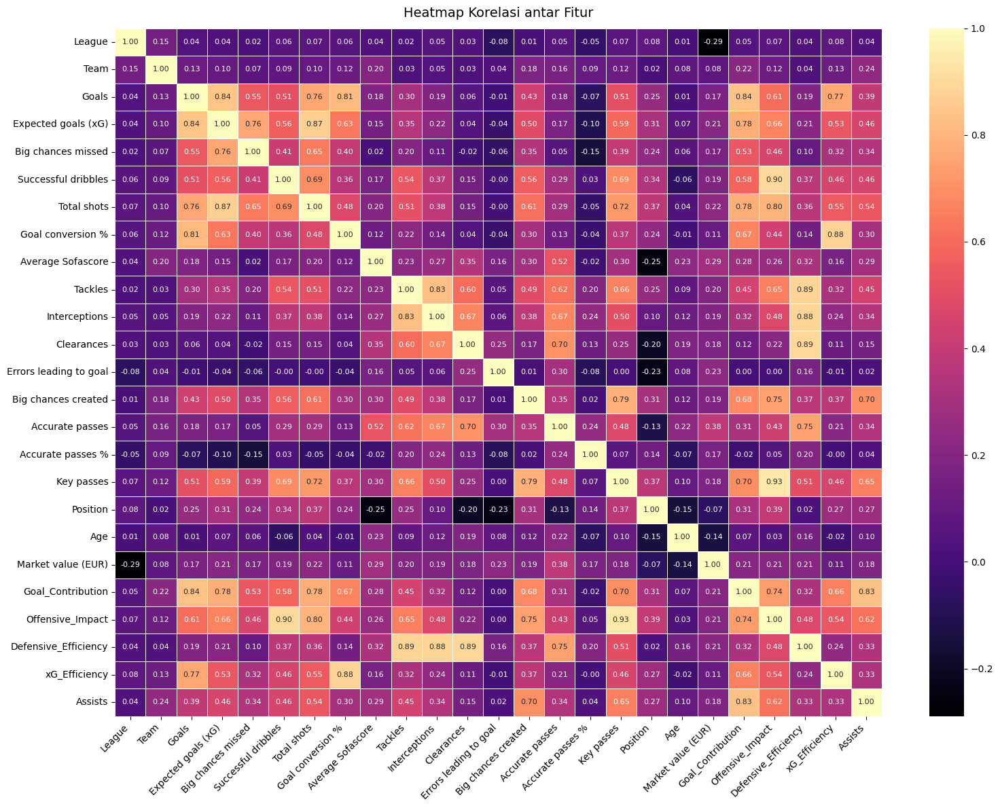

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Hitung korelasi hanya antar kolom numerik
market_value_train = pd.concat([X_train_Assist, y_train_Assists], axis=1)
corr_matrix = market_value_train.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(16, 12))  # Lebar dan tinggi diperbesar agar tidak bertumpuk
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="magma",  # atau gunakan "coolwarm", "viridis" dsb.
    linewidths=0.5,
    cbar=True,
    annot_kws={"size": 8}  # Ukuran teks anotasi
)

plt.xticks(rotation=45, ha='right')  # Putar label kolom agar tidak menabrak
plt.yticks(rotation=0)
plt.title("Heatmap Korelasi antar Fitur", fontsize=14, pad=12)
plt.tight_layout()  # Otomatis atur padding agar tidak terpotong
plt.show()


In [ ]:
# Drop fitur
X_train_Assist = X_train_Assist.drop(columns=['Goals', 'Total shots', 'Goal conversion %', 'Expected goals (xG)', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Defensive_Efficiency', 'Key passes', 'Offensive_Impact'])
X_test_Assists = X_test_Assists.drop(columns=['Goals', 'Total shots', 'Goal conversion %', 'Expected goals (xG)', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Defensive_Efficiency', 'Key passes', 'Offensive_Impact'
])
# 'Goals', 'Total shots', 'Goal conversion %', 'Expected goals (xG)', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Defensive_Efficiency', 'Key passes', 'Offensive_Impact'

# **FEATURE SCALLING (STANDAR SCALLAR)**

In [ ]:
X_train_Assist.describe()

,League,Team,Big chances missed,Average Sofascore,Tackles,Clearances,Errors leading to goal,Big chances created,Accurate passes,Accurate passes %,Position,Age,Market value (EUR),Goal_Contribution
count,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,8.510000e+02,851.000000
mean,0.603995,0.603995,0.808461,6.756005,14.470035,16.920094,0.184489,1.095182,323.494712,80.710517,0.603995,26.104583,8.160034e+06,1.169213
std,0.036018,0.244175,1.257345,0.195803,15.640144,18.844833,0.522477,1.558767,310.766087,8.683992,0.278660,4.591769,9.206495e+06,1.712801
min,0.560000,0.000000,0.000000,6.200000,0.000000,0.000000,0.000000,0.000000,1.000000,57.280000,0.127660,15.000000,0.000000e+00,0.000000
25%,0.560000,0.454545,0.000000,6.620000,2.000000,2.000000,0.000000,0.000000,71.000000,75.720000,0.349112,23.000000,1.800000e+06,0.000000
50%,0.593407,0.600000,0.000000,6.730000,9.000000,10.000000,0.000000,0.000000,216.000000,81.840000,0.611765,26.000000,4.000000e+06,0.000000
75%,0.646341,0.777778,1.000000,6.880000,23.000000,25.000000,0.000000,2.000000,497.500000,86.835000,0.784615,29.000000,1.150000e+07,2.000000
max,0.646341,1.230769,5.000000,7.420000,69.000000,81.000000,5.000000,7.000000,1507.000000,100.000000,2.000000,38.000000,4.000000e+07,9.000000


In [ ]:
from sklearn.preprocessing import StandardScaler

columns_to_stdscaler = ['Average Sofascore',
    'Big chances missed',
    'Tackles', 'Clearances',
    'Errors leading to goal',
    'Big chances created',
    'Accurate passes',
    'Accurate passes %',
    'Market value (EUR)',
    'Age', 'Goal_Contribution', 'Position', 'Team'
]


# Inisialisasi StandardScaler
scaler = StandardScaler()

# Terapkan StandardScaler hanya pada kolom numerik terpilih
X_train_scaled_Assists = X_train_Assist.copy()


# Fit scaler pada data training, lalu transform data training
X_train_scaled_Assists[columns_to_stdscaler] = scaler.fit_transform(X_train_Assist[columns_to_stdscaler])

# Transform data test (menggunakan scaler yang sama)
X_test_Assists[columns_to_stdscaler] = scaler.transform(X_test_Assists[columns_to_stdscaler])

In [ ]:
X_train_scaled_Assists.describe()

,League,Team,Big chances missed,Average Sofascore,Tackles,Clearances,Errors leading to goal,Big chances created,Accurate passes,Accurate passes %,Position,Age,Market value (EUR),Goal_Contribution
count,851.000000,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02,8.510000e+02
mean,0.603995,1.043688e-17,-4.592227e-17,1.753396e-15,3.757277e-17,-3.757277e-17,1.669901e-17,4.174752e-17,-7.097078e-17,8.349503e-18,2.504851e-17,1.795143e-16,1.252426e-17,-7.097078e-17
std,0.036018,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00,1.000588e+00
min,0.560000,-2.475067e+00,-6.433684e-01,-2.841282e+00,-9.257296e-01,-8.983918e-01,-3.533116e-01,-7.030085e-01,-1.038351e+00,-2.699714e+00,-1.710385e+00,-2.419789e+00,-8.868557e-01,-6.830335e-01
25%,0.560000,-6.124193e-01,-6.433684e-01,-6.950079e-01,-7.977784e-01,-7.921995e-01,-3.533116e-01,-7.030085e-01,-8.129690e-01,-5.750180e-01,-9.152112e-01,-6.765167e-01,-6.912266e-01,-6.830335e-01
50%,0.593407,-1.637204e-02,-6.433684e-01,-1.328886e-01,-3.499490e-01,-3.674303e-01,-3.533116e-01,-7.030085e-01,-3.461057e-01,1.301414e-01,2.789771e-02,-2.278955e-02,-4.521243e-01,-6.830335e-01
75%,0.646341,7.121301e-01,1.524259e-01,6.336377e-01,5.457099e-01,4.290119e-01,-3.533116e-01,5.808118e-01,5.602529e-01,7.056759e-01,6.485548e-01,6.309376e-01,3.629970e-01,4.853313e-01
max,0.646341,2.568410e+00,3.335603e+00,3.393133e+00,3.488589e+00,3.402396e+00,9.222108e+00,3.790362e+00,3.810587e+00,2.222575e+00,5.012652e+00,2.592119e+00,3.460458e+00,4.574608e+00


# **MODELLING**

# **LINEAR REGRESSION, RIDGE, AND LASSO**

In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Dictionary untuk menyimpan hasil evaluasi dan durasi
results_test = {}
training_time = {}

# Linear Regression
start_time = time.time()
linreg_model = LinearRegression()
linreg_model.fit(X_train_scaled_Assists, y_train_Assists)
training_time['LinearRegression'] = time.time() - start_time

# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
start_time = time.time()
ridge_grid = GridSearchCV(Ridge(max_iter=10000, tol=1e-4), ridge_params, cv=5, scoring='r2')
ridge_grid.fit(X_train_scaled_Assists, y_train_Assists)
training_time['Ridge'] = time.time() - start_time

# Lasso Regression
lasso_params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
start_time = time.time()
lasso_grid = GridSearchCV(Lasso(max_iter=10000, tol=1e-4), lasso_params, cv=5, scoring='r2')
lasso_grid.fit(X_train_scaled_Assists, y_train_Assists)
training_time['Lasso'] = time.time() - start_time



# **MLP REGRESSOR**

In [ ]:
import time
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV

# Hyperparameter grid untuk MLP
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate_init': [0.001, 0.01],
    'max_iter': [10000]
}

# Inisialisasi GridSearchCV
mlp_grid = GridSearchCV(
    MLPRegressor(random_state=42, early_stopping=True,
    n_iter_no_change=10),
    mlp_params,
    cv=5,
    scoring='r2'
)

# Mulai hitung waktu
start_time = time.time()

# Training model
mlp_grid.fit(X_train_scaled_Assists, y_train_Assists)

# Selesai training
end_time = time.time()
training_duration = end_time - start_time



# **EVALUATION**

In [ ]:
# =============================
# Evaluasi TRAINING
y_train_pred_linreg_Assits = linreg_model.predict(X_train_scaled_Assists)
y_train_pred_ridge_Assits = ridge_grid.best_estimator_.predict(X_train_scaled_Assists)
y_train_pred_lasso_Assits = lasso_grid.best_estimator_.predict(X_train_scaled_Assists)
y_train_pred_mlp_Assits = mlp_grid.best_estimator_.predict(X_train_scaled_Assists)

linreg_metrics_train = {
    'MAE': mean_absolute_error(y_train_Assists, y_train_pred_linreg_Assits),
    'MSE': mean_squared_error(y_train_Assists, y_train_pred_linreg_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_train_Assists, y_train_pred_linreg_Assits)),
    'R²': r2_score(y_train_Assists, y_train_pred_linreg_Assits)
}

ridge_metrics_train = {
    'MAE': mean_absolute_error(y_train_Assists, y_train_pred_ridge_Assits),
    'MSE': mean_squared_error(y_train_Assists, y_train_pred_ridge_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_train_Assists, y_train_pred_ridge_Assits)),
    'R²': r2_score(y_train_Assists, y_train_pred_ridge_Assits)
}

lasso_metrics_train = {
    'MAE': mean_absolute_error(y_train_Assists, y_train_pred_lasso_Assits),
    'MSE': mean_squared_error(y_train_Assists, y_train_pred_lasso_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_train_Assists, y_train_pred_lasso_Assits)),
    'R²': r2_score(y_train_Assists, y_train_pred_lasso_Assits)
}

mlp_metrics_train = {
    'MAE': mean_absolute_error(y_train_Assists, y_train_pred_mlp_Assits),
    'MSE': mean_squared_error(y_train_Assists, y_train_pred_mlp_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_train_Assists, y_train_pred_mlp_Assits)),
    'R²': r2_score(y_train_Assists, y_train_pred_mlp_Assits)
}

eval_train_df = pd.DataFrame(
    [linreg_metrics_train, ridge_metrics_train, lasso_metrics_train, mlp_metrics_train],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Evaluasi TESTING + Waktu Inference
import time

inference_time_assists = {}

start = time.time()
y_test_pred_linreg_Assits = linreg_model.predict(X_test_Assists)
inference_time_assists['LinearRegression'] = time.time() - start

start = time.time()
y_test_pred_ridge_Assits = ridge_grid.best_estimator_.predict(X_test_Assists)
inference_time_assists['Ridge'] = time.time() - start

start = time.time()
y_test_pred_lasso_Assits = lasso_grid.best_estimator_.predict(X_test_Assists)
inference_time_assists['Lasso'] = time.time() - start

start = time.time()
y_test_pred_mlp_Assits = mlp_grid.best_estimator_.predict(X_test_Assists)
inference_time_assists['MLPRegressor'] = time.time() - start

linreg_metrics_test = {
    'MAE': mean_absolute_error(y_test_Assists, y_test_pred_linreg_Assits),
    'MSE': mean_squared_error(y_test_Assists, y_test_pred_linreg_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_test_Assists, y_test_pred_linreg_Assits)),
    'R²': r2_score(y_test_Assists, y_test_pred_linreg_Assits)
}

ridge_metrics_test = {
    'MAE': mean_absolute_error(y_test_Assists, y_test_pred_ridge_Assits),
    'MSE': mean_squared_error(y_test_Assists, y_test_pred_ridge_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_test_Assists, y_test_pred_ridge_Assits)),
    'R²': r2_score(y_test_Assists, y_test_pred_ridge_Assits)
}

lasso_metrics_test = {
    'MAE': mean_absolute_error(y_test_Assists, y_test_pred_lasso_Assits),
    'MSE': mean_squared_error(y_test_Assists, y_test_pred_lasso_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_test_Assists, y_test_pred_lasso_Assits)),
    'R²': r2_score(y_test_Assists, y_test_pred_lasso_Assits)
}

mlp_metrics_test = {
    'MAE': mean_absolute_error(y_test_Assists, y_test_pred_mlp_Assits),
    'MSE': mean_squared_error(y_test_Assists, y_test_pred_mlp_Assits),
    'RMSE': np.sqrt(mean_squared_error(y_test_Assists, y_test_pred_mlp_Assits)),
    'R²': r2_score(y_test_Assists, y_test_pred_mlp_Assits)
}

eval_test_df = pd.DataFrame(
    [linreg_metrics_test, ridge_metrics_test, lasso_metrics_test, mlp_metrics_test],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Cetak hasil evaluasi
print("📊 Evaluasi Model pada Data Training:")
print(eval_train_df)

print("\n📊 Evaluasi Model pada Data Testing:")
print(eval_test_df)

# =============================
# Cetak waktu training
training_time['MLPRegressor'] = training_duration

print("\n⏱️ Lama Training Masing-masing Model (dalam detik):")
for model, waktu in training_time.items():
    print(f"{model}: {waktu:.2f} detik")

# =============================
# Cetak waktu inference
print("\n⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):")
for model, waktu in inference_time_assists.items():
    print(f"{model}: {waktu:.6f} detik")


📊 Evaluasi Model pada Data Training:
                       MAE       MSE      RMSE        R²
LinearRegression  0.320234  0.267057  0.516776  0.743939
Ridge             0.320687  0.267248  0.516960  0.743756
Lasso             0.315860  0.268025  0.517711  0.743011
MLPRegressor      0.286522  0.205810  0.453662  0.802665

📊 Evaluasi Model pada Data Testing:
                       MAE       MSE      RMSE        R²
LinearRegression  0.343397  0.301862  0.549419  0.709504
Ridge             0.346259  0.304411  0.551734  0.707051
Lasso             0.340528  0.304382  0.551708  0.707078
MLPRegressor      0.354931  0.301977  0.549524  0.709393

⏱️ Lama Training Masing-masing Model (dalam detik):
LinearRegression: 0.00 detik
Ridge: 0.15 detik
Lasso: 0.11 detik
MLPRegressor: 14.42 detik

⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):
LinearRegression: 0.001635 detik
Ridge: 0.001675 detik
Lasso: 0.001591 detik
MLPRegressor: 0.001571 detik


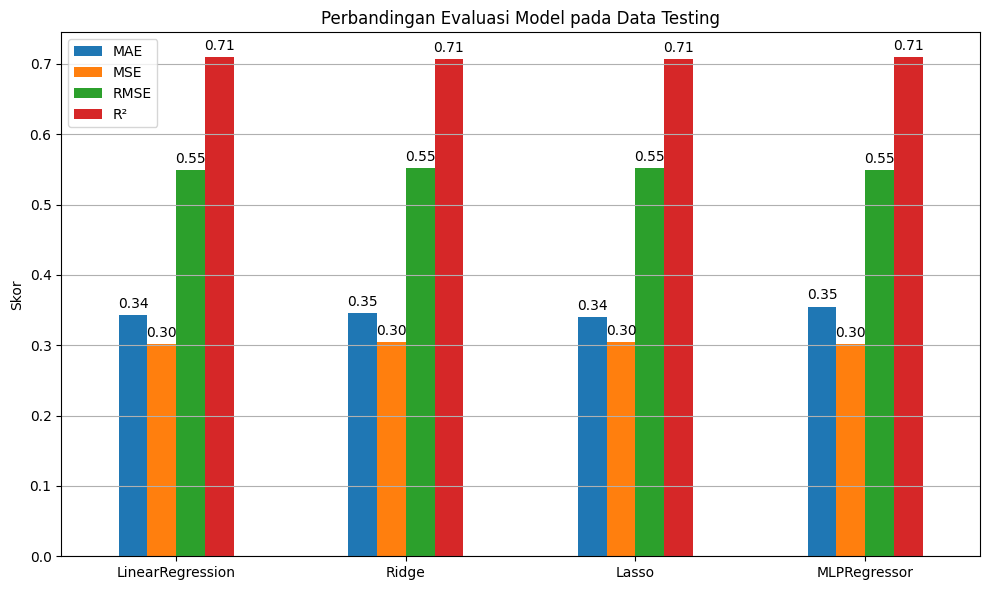

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_test_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Testing')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


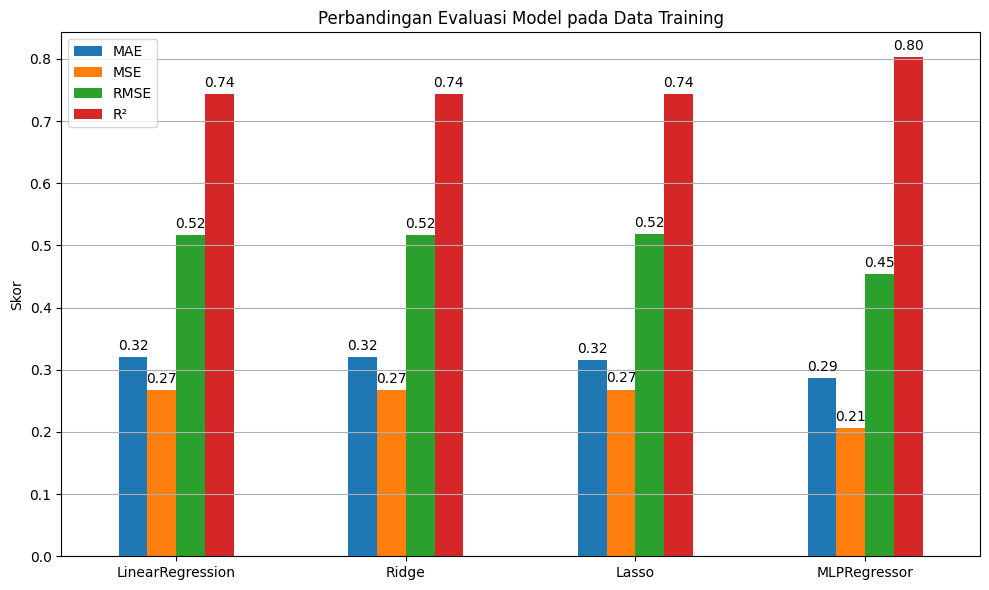

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_train_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Training')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


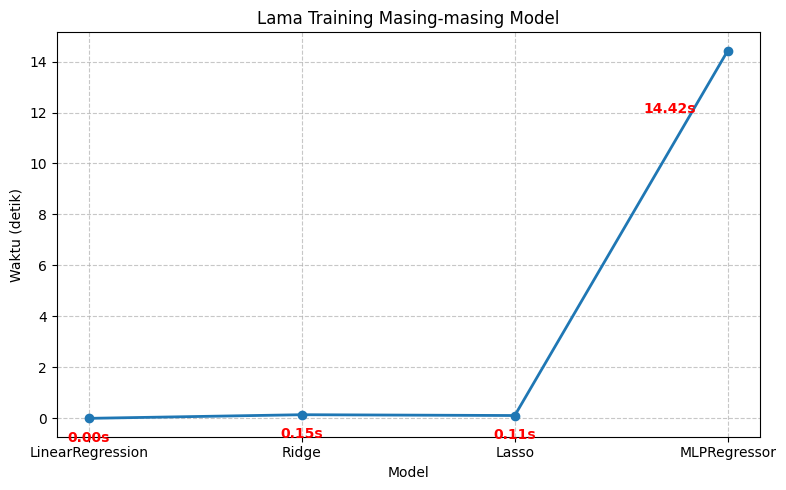

In [ ]:
# Ambil nama model dan waktu training dari dictionary
model_names = list(training_time.keys())
training_durations = list(training_time.values())


plt.figure(figsize=(8, 5))
plt.plot(model_names, training_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Training Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

for i, waktu in enumerate(training_durations):
    if i == len(training_durations) - 1:
        plt.text(i - 0.15, waktu - 2, f'{waktu:.2f}s',
                 ha='right', va='top',
                 fontsize=10, fontweight='bold', color='red')
    elif waktu < 1:
        plt.text(i, waktu - 0.5, f'{waktu:.2f}s',
                 ha='center', va='top',
                 fontsize=10, fontweight='bold', color='red')
    else:
        plt.text(i, waktu + 1.5, f'{waktu:.2f}s',
                 ha='center', va='bottom',
                 fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


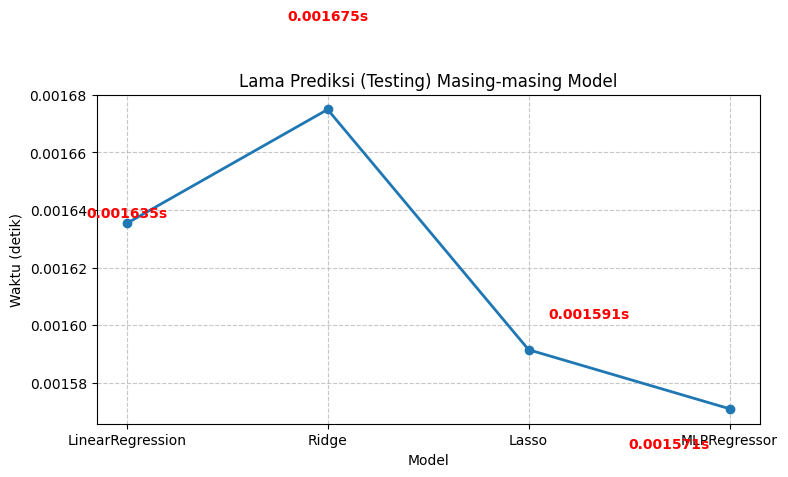

In [ ]:
# Ambil nama model dan durasi inference dari dictionary
model_names_test = list(inference_time_assists.keys())
testing_durations = list(inference_time_assists.values())

# Plot
plt.figure(figsize=(8, 5))
plt.plot(model_names_test, testing_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Prediksi (Testing) Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

# Tambahkan label waktu dengan posisi penyesuaian
for i, waktu in enumerate(testing_durations):
    model = model_names_test[i]

    if model == 'MLPRegressor':
        # geser ke kiri dan sedikit turun
        plt.text(i - 0.1, waktu - 0.00001, f'{waktu:.6f}s',
                 ha='right', va='top', fontsize=10, fontweight='bold', color='red')

    elif model == 'Lasso':
        # sedikit geser ke kanan dan naik
        plt.text(i + 0.1, waktu + 0.00001, f'{waktu:.6f}s',
                 ha='left', va='bottom', fontsize=10, fontweight='bold', color='red')

    elif model == 'Ridge':
        # tepat di atas
        plt.text(i, waktu + 0.00003, f'{waktu:.6f}s',
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

    else:  # LinearRegression
        # sedikit di atas titik
        plt.text(i, waktu + 0.000001, f'{waktu:.6f}s',
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Assists'] = y_test_pred_linreg_Assits
result_df['Actual_Assists'] = y_test.values

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Assists', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Assists,Actual_Assists
410,826,Dane Scarlett,Tottenham,Premier League,0.346243,6.0
650,1108,Unai García,CA Osasuna,Laliga,-0.004448,5.0
931,1588,Keita Baldé,Monza,Serie A,0.753435,5.0
34,175,Marc Roca,Real Betis,Laliga,2.114445,4.0
705,1261,Álvaro Morata,AC Milan,Serie A,2.196182,4.0
...,...,...,...,...,...,...
406,820,Kiernan Dewsbury-Hall,Chelsea,Premier League,0.544440,0.0
572,1013,Chuky,Real Valladolid,Laliga,0.722280,0.0
267,635,Joe Aribo,Southampton,Premier League,1.658679,0.0
291,670,William Carvalho,Real Betis,Laliga,0.117764,0.0


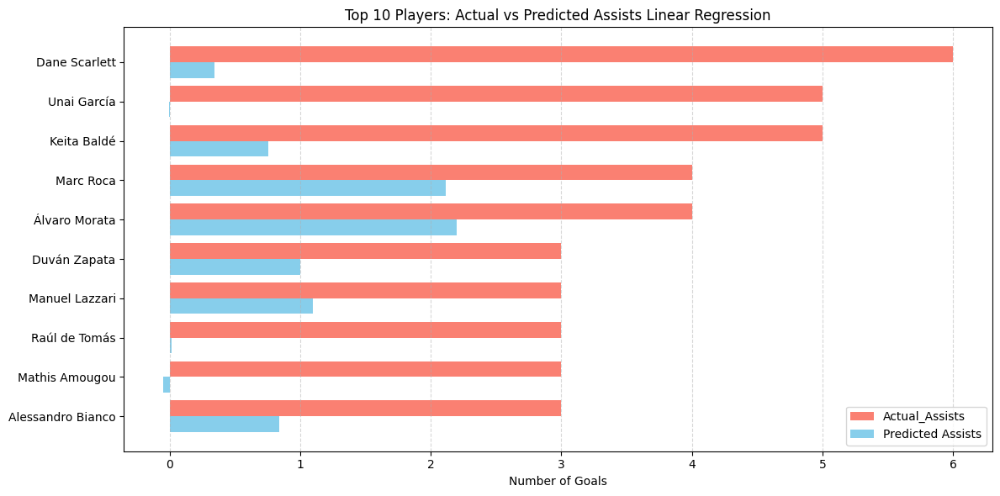

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Assists', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Assists'], bar_width, label='Actual_Assists', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Assists'], bar_width, label='Predicted Assists', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Assists Linear Regression')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Assists'] = y_test_pred_ridge_Assits  # atau y_test_pred_lasso
result_df['Actual_Assists'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Assists', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual

,index,Name,Team,League,Predicted_Assists,Actual_Assists
410,826,Dane Scarlett,Tottenham,Premier League,0.329239,6.0
650,1108,Unai García,CA Osasuna,Laliga,-0.021014,5.0
931,1588,Keita Baldé,Monza,Serie A,0.745912,5.0
34,175,Marc Roca,Real Betis,Laliga,2.082361,4.0
705,1261,Álvaro Morata,AC Milan,Serie A,2.191518,4.0
...,...,...,...,...,...,...
406,820,Kiernan Dewsbury-Hall,Chelsea,Premier League,0.536506,0.0
572,1013,Chuky,Real Valladolid,Laliga,0.720619,0.0
267,635,Joe Aribo,Southampton,Premier League,1.654798,0.0
291,670,William Carvalho,Real Betis,Laliga,0.115907,0.0


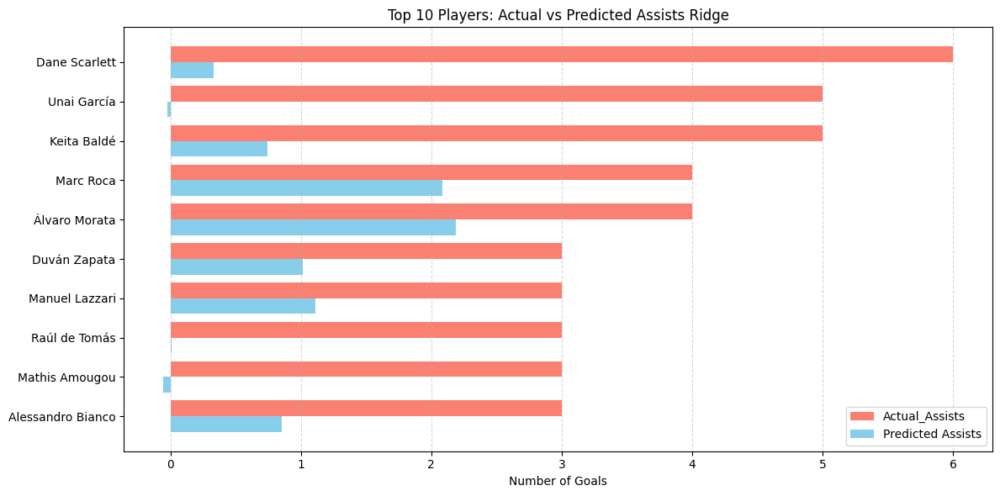

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Assists', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Assists'], bar_width, label='Actual_Assists', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Assists'], bar_width, label='Predicted Assists', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Assists Ridge')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Assists'] = y_test_pred_lasso_Assits  # atau y_test_pred_lasso
result_df['Actual_Assists'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Assists', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Assists,Actual_Assists
410,826,Dane Scarlett,Tottenham,Premier League,0.350450,6.0
650,1108,Unai García,CA Osasuna,Laliga,-0.039487,5.0
931,1588,Keita Baldé,Monza,Serie A,0.746418,5.0
34,175,Marc Roca,Real Betis,Laliga,2.056753,4.0
705,1261,Álvaro Morata,AC Milan,Serie A,2.219636,4.0
...,...,...,...,...,...,...
406,820,Kiernan Dewsbury-Hall,Chelsea,Premier League,0.540431,0.0
572,1013,Chuky,Real Valladolid,Laliga,0.728530,0.0
267,635,Joe Aribo,Southampton,Premier League,1.608945,0.0
291,670,William Carvalho,Real Betis,Laliga,0.075718,0.0


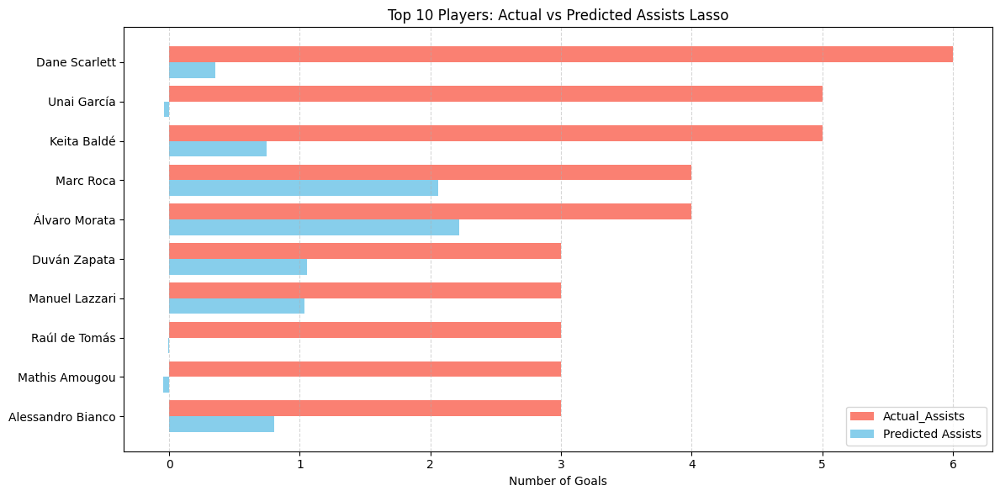

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Assists', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Assists'], bar_width, label='Actual_Assists', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Assists'], bar_width, label='Predicted Assists', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Assists Lasso')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Assists'] = y_test_pred_mlp_Assits
result_df['Actual_Assists'] = y_test.values
top_actual_scorers = result_df.sort_values(by='Actual_Assists', ascending=False)
top_10_actual = top_actual_scorers
top_10_actual

,index,Name,Team,League,Predicted_Assists,Actual_Assists
410,826,Dane Scarlett,Tottenham,Premier League,0.537360,6.0
650,1108,Unai García,CA Osasuna,Laliga,0.027661,5.0
931,1588,Keita Baldé,Monza,Serie A,0.847917,5.0
34,175,Marc Roca,Real Betis,Laliga,2.116956,4.0
705,1261,Álvaro Morata,AC Milan,Serie A,1.642744,4.0
...,...,...,...,...,...,...
406,820,Kiernan Dewsbury-Hall,Chelsea,Premier League,0.701962,0.0
572,1013,Chuky,Real Valladolid,Laliga,0.731566,0.0
267,635,Joe Aribo,Southampton,Premier League,1.504905,0.0
291,670,William Carvalho,Real Betis,Laliga,0.045540,0.0


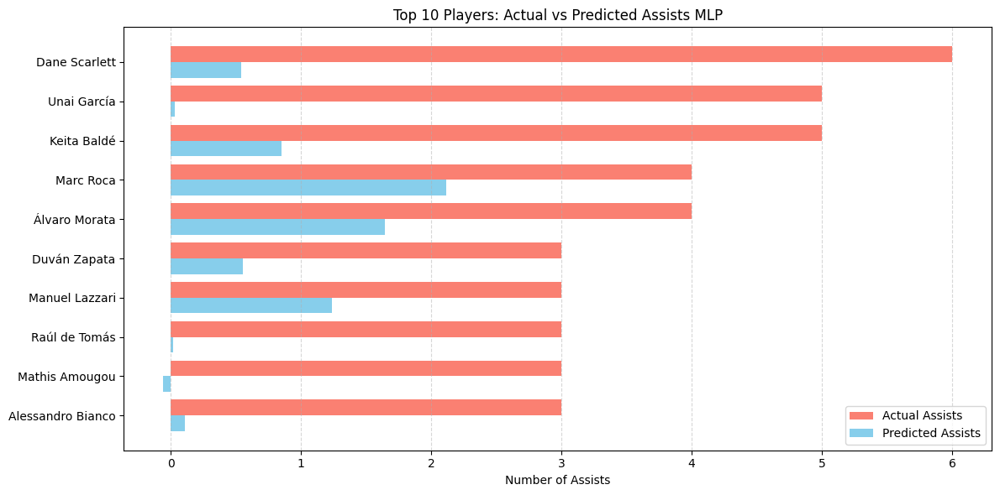

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Assists', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Assists'], bar_width, label='Actual Assists', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Assists'], bar_width, label='Predicted Assists', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Assists')
plt.title('Top 10 Players: Actual vs Predicted Assists MLP')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Ambil model Linear Regression
best_linreg_model = linreg_model  # atau langsung gunakan linreg_model

# Simpan model ke file .joblib
joblib.dump(best_linreg_model, 'best_linreg_model_Assists.joblib')


['best_linreg_model_Assists.joblib']

In [ ]:
from google.colab import files
files.download('best_linreg_model_Assists.joblib')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 📊 Evaluasi Model

## 🔹 Evaluasi pada Data Training
- Semua model linear (**Linear**, **Ridge**, dan **Lasso**) memiliki **R² = 0.74**, menandakan kemampuan menjelaskan sekitar **74% variasi target**.
- **MLPRegressor** sedikit lebih unggul pada training dengan **R² = 0.80**, namun memiliki **MSE yang lebih tinggi**, yang mengindikasikan potensi **overfitting ringan**.
- Dari sisi error (**MAE**, **MSE**, dan **RMSE**), ketiga model linear menunjukkan performa yang **hampir identik**, dengan **MAE ≈ 0.32** dan **RMSE ≈ 0.52**.

## 🔹 Evaluasi pada Data Testing
- Pada data testing, keempat model memiliki **R² = 0.71**, menunjukkan performa generalisasi yang setara.
- Nilai error (**MAE**, **MSE**, **RMSE**) juga **seragam**, sehingga **tidak ada model yang secara signifikan lebih unggul** dalam prediksi data baru.
- **MLPRegressor** tidak menunjukkan keunggulan besar pada testing, sehingga kelebihannya di training **tidak berlanjut** ke testing.

## ⏱️ Lama Waktu Training
- Model **linear** sangat efisien:
  - **Linear Regression**: hanya **0.01 detik**.
  - **Ridge dan Lasso**: sekitar **0.15 detik**.
- **MLPRegressor**: membutuhkan waktu jauh lebih lama (**22.08 detik**), namun **tidak menghasilkan peningkatan akurasi yang signifikan**.

## ✅ Kesimpulan dan Rekomendasi

| Model          | Akurasi Testing | Waktu Training | Rekomendasi                                |
|----------------|------------------|----------------|---------------------------------------------|
| MLPRegressor   | ⚖️ Setara         | 🕒 Sangat Lama  | ❌ Tidak disarankan, tidak efisien           |
| Ridge / Lasso  | ⚖️ Setara         | ⚡️ Sangat Cepat | ✅ Direkomendasikan untuk efisiensi & stabilitas |

> 🔍 **Rekomendasi:**
> - Pilih **Ridge** atau **Lasso Regression** untuk efisiensi dan stabilitas.
> - Hindari penggunaan **MLPRegressor** dalam konteks ini karena **kompleksitas tinggi tidak diimbangi oleh peningkatan akurasi**.


# **PREDICT TOP DEFFENDER**

## **SPLIT DATA**

In [ ]:
# Simpan data identitas
name_team_deffend = df[['Name', 'Team', 'League']].copy()

# Jadikan 3 kolom sebagai index
name_team_deffend = name_team_deffend.set_index(['League', 'Team', 'Name'])


In [ ]:
drop_columns = ['Defensive_Efficiency', 'Name', 'Saves', 'Clean sheets',
       'Penalties saved', 'Saves from inside box', 'Runs out']
X_deffend = df.drop(columns=drop_columns)
y_deffend = df['Defensive_Efficiency']


In [ ]:
X_deffend.isna().sum()

,0
League,0
Team,0
Goals,0
Expected goals (xG),0
Big chances missed,0
Successful dribbles,0
Total shots,0
Goal conversion %,0
Average Sofascore,0
Tackles,0


In [ ]:
y_deffend.isna().sum()

np.int64(0)

# **HANDLING OUTLIER**

In [ ]:
import scipy.stats as stats

def check_plot(df, variable):
    # fungsi mengambil kerangka data (df) dan
    # variabel yang diminati sebagai argumen

    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    plt.savefig(f'{col}_distribution.jpg', format='jpg')
    plt.show()

In [ ]:
# Pilih kolom numerik
numeric_cols = X_deffend.select_dtypes(include=['number']).columns
numeric_cols

Index(['Goals', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %',
       'Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
       'Errors leading to goal', 'Big chances created', 'Assists',
       'Accurate passes', 'Accurate passes %', 'Key passes', 'Age',
       'Market value (EUR)', 'Goal_Contribution', 'Offensive_Impact',
       'xG_Efficiency'],
      dtype='object')

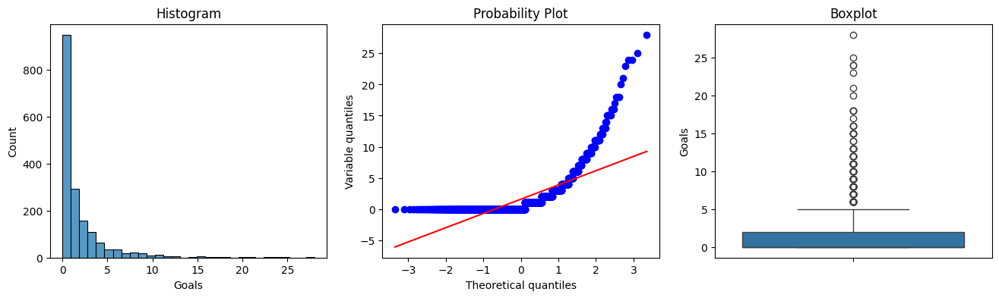

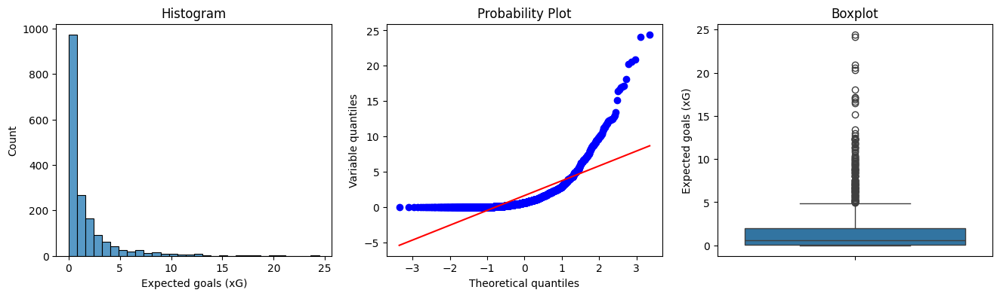

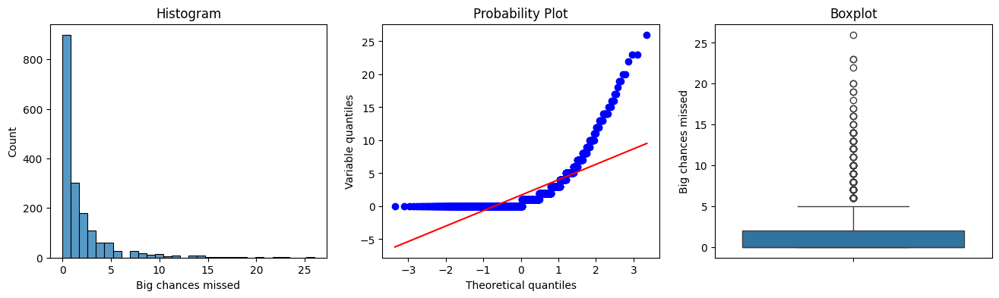

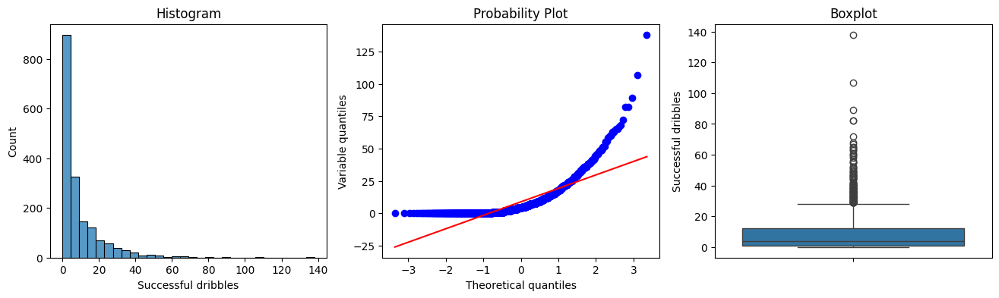

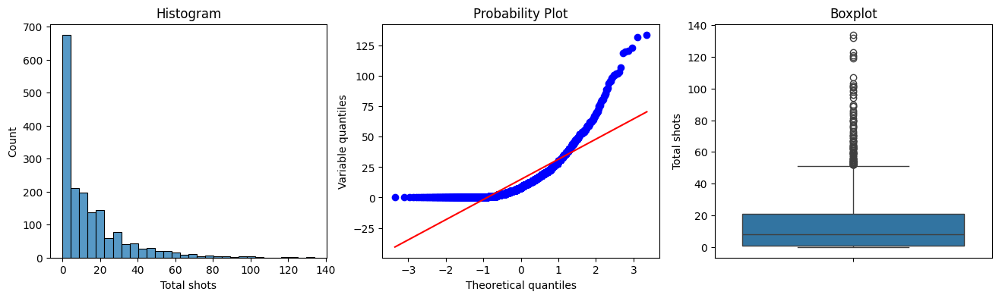

...

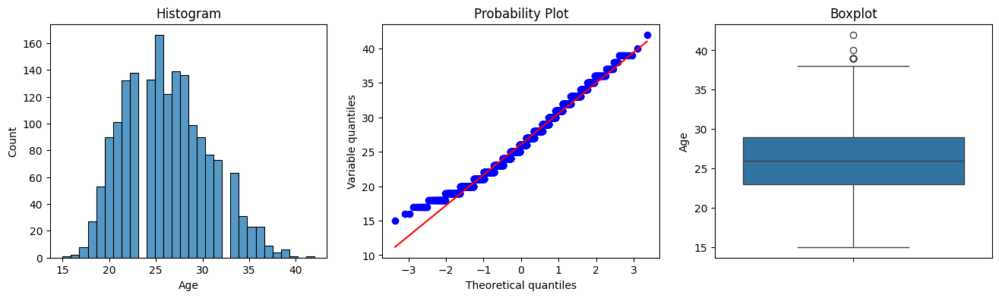

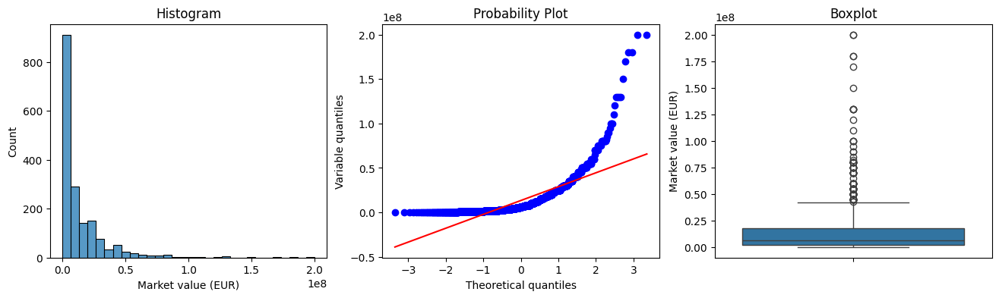

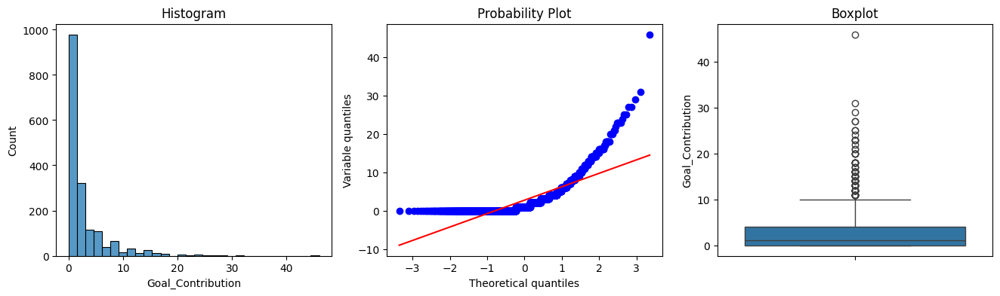

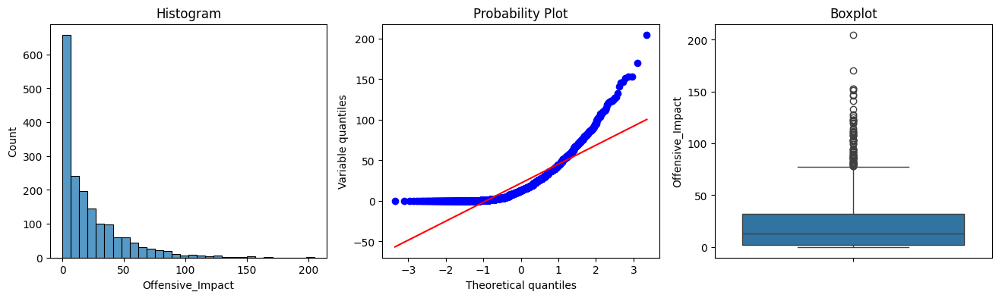

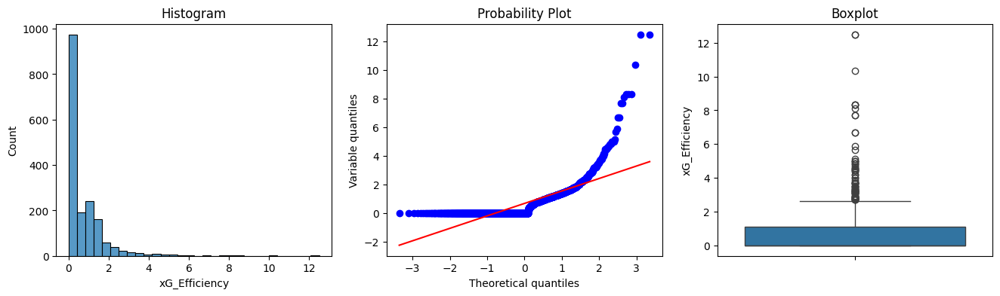

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in numeric_cols:
    check_plot(X_deffend, col)

In [ ]:
def find_outlier_boundary(df, variable):

    # Mari kita hitung batas luar yang merupakan outlier

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary

In [ ]:
# Kolom-kolom dengan outlier berdasarkan boxplot
col_outlier_deffend = [
 'Goals', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %',
       'Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
       'Big chances created', 'Assists',
       'Accurate passes', 'Accurate passes %', 'Key passes', 'Age',
       'Market value (EUR)', 'Goal_Contribution', 'Offensive_Impact',
       'xG_Efficiency'
# 'Errors leading to goal'
]


# 5. Buat mask gabungan untuk semua kolom outlier
mask = pd.Series(True, index=X.index)  # semua True
for col in col_outlier_deffend:
    upper, lower = find_outlier_boundary(X_deffend, col)
    mask &= (X_deffend[col] <= upper) & (X_deffend[col] >= lower)

# 6. Terapkan mask ke X dan y
X_clean = X_deffend[mask].copy()
y_clean = y_deffend[mask].copy()


In [ ]:
name_team = df[['Name', 'Team', 'League']].copy()
name_team.index = X_deffend.index  # Samakan index dengan X sebelum masking
name_team_clean = name_team[mask].reset_index()


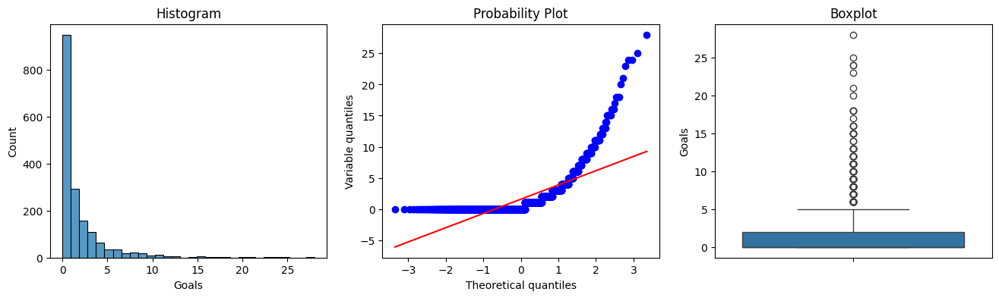

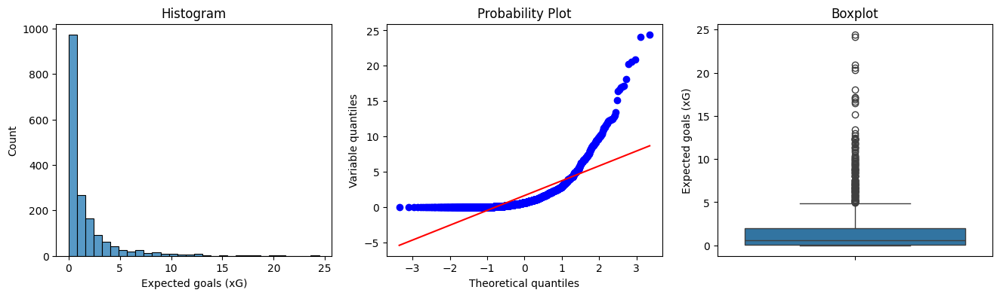

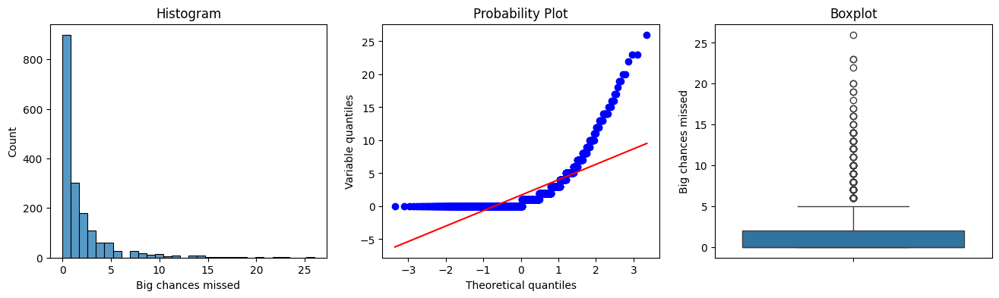

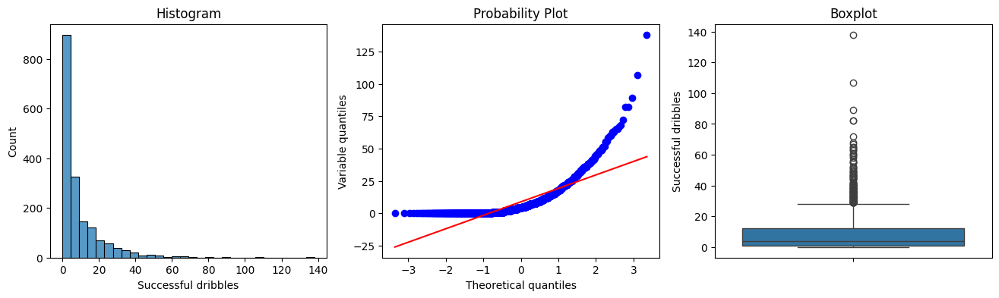

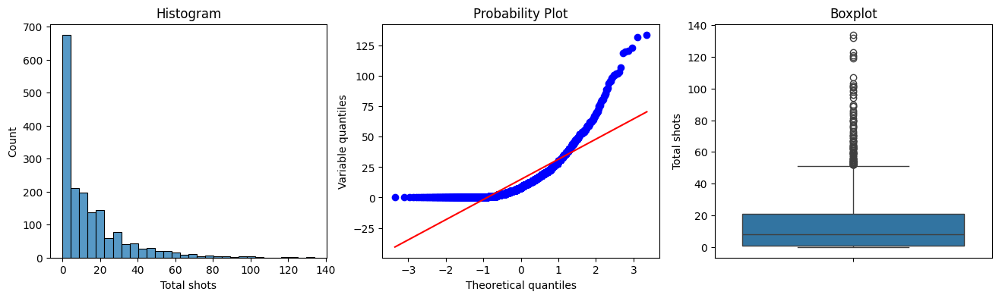

...

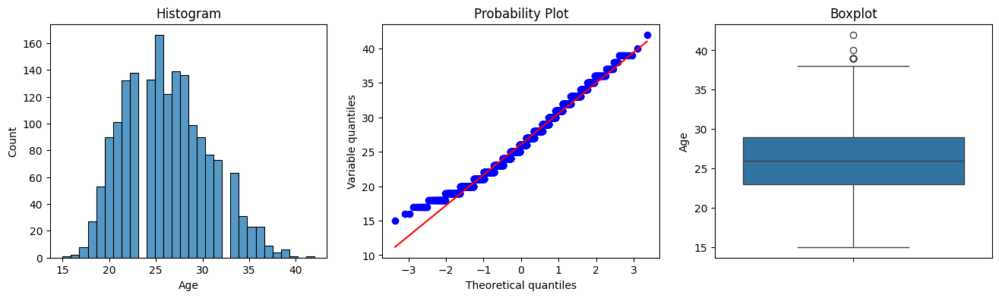

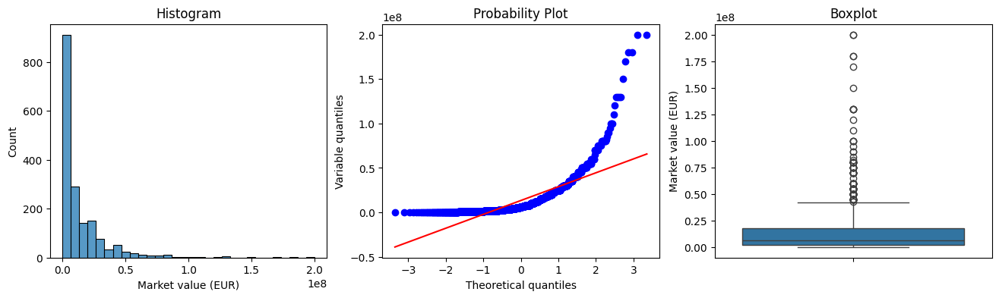

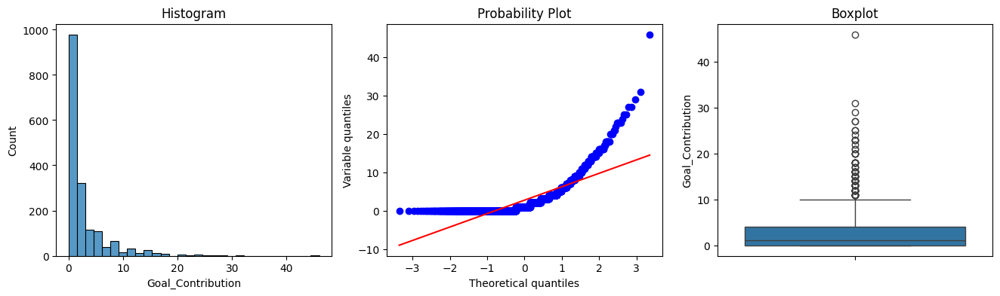

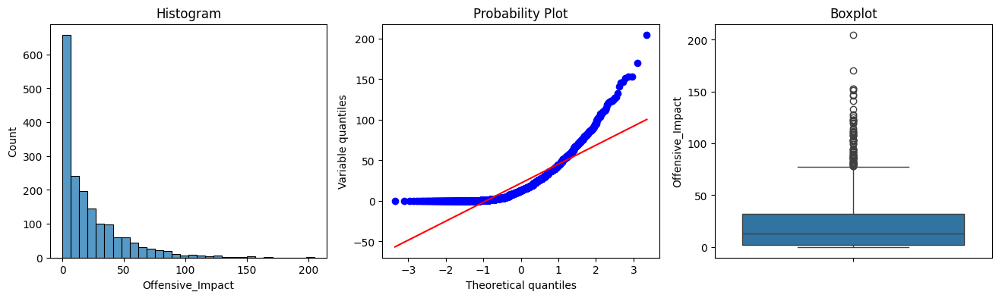

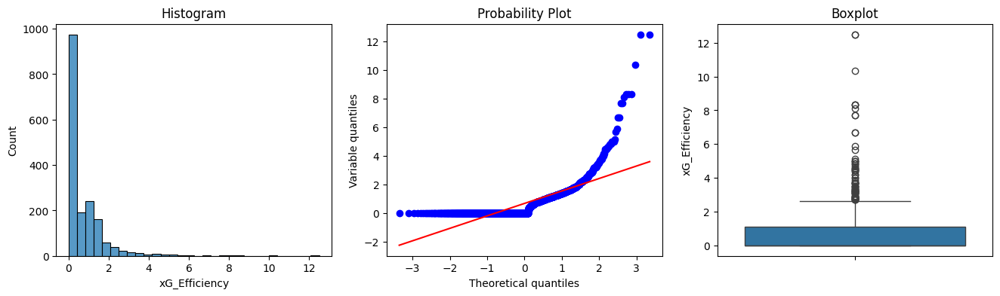

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in col_outlier_deffend:
    check_plot(X_deffend, col)

# **TRAIN-TEST SPLIT**

In [ ]:
# 7. Train-test split setelah data bersih dari outlier
X_train_deffend, X_test_deffend, y_train_deffend, y_test_deffend, name_train, name_test = train_test_split(
    X_clean, y_clean, name_team_clean, test_size=0.2, random_state=1000
)



In [ ]:
# check train data dimension
X_train_deffend.shape

(848, 24)

In [ ]:
# check test data dimension
X_test_deffend.shape

(213, 24)

In [ ]:
# check train target counts
y_train_deffend.value_counts()

,count
Defensive_Efficiency,
0.0,54
2.0,28
4.0,24
3.0,22
9.0,19
...,...
119.0,1
90.0,1
72.0,1


In [ ]:
# check test target counts
y_test_deffend.value_counts()

,count
Defensive_Efficiency,
1.0,12
2.0,9
3.0,9
13.0,8
16.0,7
...,...
111.0,1
127.0,1
17.0,1


# **ENCODING**

In [ ]:
# Gabungkan X_train dan y_train untuk referensi nilai rata-rata
X_train_deffend['Defensive_Efficiency'] = y_train_deffend  # sementara tambahkan target

# Daftar kolom kategorikal
cat_cols = ['Position', 'League', 'Team']

# Dictionary untuk menyimpan mean encoding mapping
mean_encoders_defend = {}

for col in cat_cols:
    # Hitung mean Defensive_Efficiency untuk tiap kategori
    mean_map = X_train_deffend.groupby(col)['Defensive_Efficiency'].mean()

    # Simpan mapping ke dictionary
    mean_encoders_defend[col] = mean_map

    # Terapkan mapping ke X_train dan X_test
    X_train_deffend[col] = X_train_deffend[col].map(mean_map)
    X_test_deffend[col] = X_test_deffend[col].map(mean_map)

    # Tangani kategori baru yang tidak ada di training
    X_test_deffend[col].fillna(X_train_deffend['Defensive_Efficiency'].mean(), inplace=True)

# Hapus target sementara dari X_train
X_train_deffend.drop(columns='Defensive_Efficiency', inplace=True)

# Simpan hasil mean encoding ke joblib
joblib.dump(mean_encoders_defend, "mean_encoders_defend.joblib")

<ipython-input-117-a367f312df69>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_test_deffend[col].fillna(X_train_deffend['Defensive_Efficiency'].mean(), inplace=True)
<ipython-input-117-a367f312df69>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df

['mean_encoders_defend.joblib']

# **MULTICOLLINEARITY**

In [ ]:
# Ubah semua kolom boolean ke integer
X_train_numeric = X_train_deffend.copy()
X_train_numeric = X_train_numeric.astype({col: int for col in X_train_numeric.select_dtypes('bool').columns})

# Tambahkan konstanta untuk VIF
from statsmodels.tools.tools import add_constant
X_vif = add_constant(X_train_numeric)

# Hitung VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = pd.DataFrame({
    'feature': X_vif.columns,
    'vif_score': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

# Hapus konstanta
vif_df = vif_df[vif_df['feature'] != 'const']

# Tampilkan hasil
print(vif_df)


                   feature  vif_score
1                   League   1.314335
2                     Team   1.091290
3                    Goals        inf
4      Expected goals (xG)  17.192155
5       Big chances missed   3.141079
6      Successful dribbles        inf
7              Total shots  11.530533
8        Goal conversion %  10.173281
9        Average Sofascore   1.677909
10                 Tackles   4.845028
11           Interceptions   3.930863
12              Clearances   3.031906
13  Errors leading to goal   1.299959
14     Big chances created   3.097532
15                 Assists        inf
16         Accurate passes   4.116502
17       Accurate passes %   1.388980
18              Key passes        inf
19                Position   1.931221
20                     Age   1.262649
21      Market value (EUR)   1.744367
22       Goal_Contribution        inf
23        Offensive_Impact        inf
24           xG_Efficiency   9.029176


/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


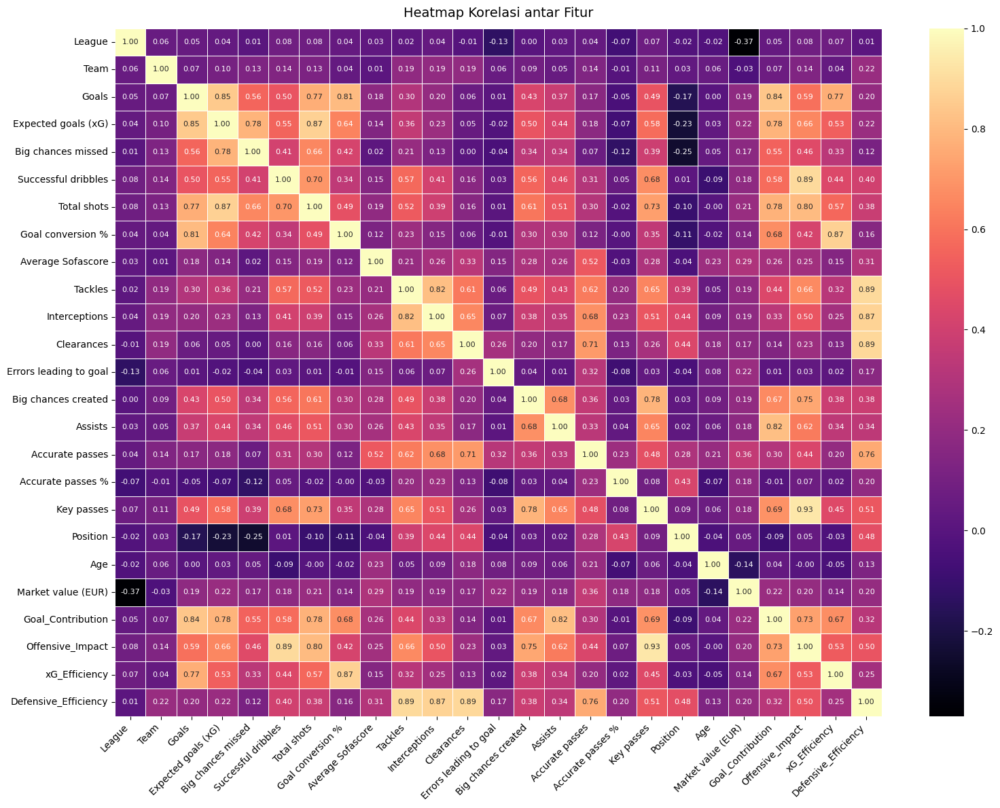

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Hitung korelasi hanya antar kolom numerik
market_value_train = pd.concat([X_train_deffend, y_train_deffend], axis=1)
corr_matrix = market_value_train.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(16, 12))  # Lebar dan tinggi diperbesar agar tidak bertumpuk
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="magma",  # atau gunakan "coolwarm", "viridis" dsb.
    linewidths=0.5,
    cbar=True,
    annot_kws={"size": 8}  # Ukuran teks anotasi
)

plt.xticks(rotation=45, ha='right')  # Putar label kolom agar tidak menabrak
plt.yticks(rotation=0)
plt.title("Heatmap Korelasi antar Fitur", fontsize=14, pad=12)
plt.tight_layout()  # Otomatis atur padding agar tidak terpotong
plt.show()


In [ ]:
# Drop fitur
X_train_deffend = X_train_deffend.drop(columns=['Goals', 'Total shots', 'Expected goals (xG)', 'Goal conversion %', 'Goal_Contribution', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Accurate passes', 'Big chances created', 'Offensive_Impact'])
X_test_deffend = X_test_deffend.drop(columns=['Goals', 'Total shots', 'Expected goals (xG)', 'Goal conversion %', 'Goal_Contribution', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Accurate passes', 'Big chances created', 'Offensive_Impact'])
# 'Goals', 'Total shots', 'Expected goals (xG)', 'Goal conversion %', 'Goal_Contribution', 'xG_Efficiency', 'Successful dribbles', 'Interceptions', 'Accurate passes', 'Big chances created', 'Offensive_Impact'

# **FEATURE SCALLING (STANDAR SCALLAR)**

In [ ]:
X_train_deffend.describe()

,League,Team,Big chances missed,Average Sofascore,Tackles,Clearances,Errors leading to goal,Assists,Accurate passes %,Key passes,Position,Age,Market value (EUR)
count,848.000000,848.000000,848.000000,848.000000,848.000000,848.000000,848.000000,848.000000,848.00000,848.000000,848.000000,848.000000,8.480000e+02
mean,38.803066,38.803066,0.811321,6.760413,14.772406,17.385613,0.195755,0.604953,80.71250,7.185142,38.803066,26.142689,8.095341e+06
std,0.476791,8.202774,1.267061,0.199759,15.986235,18.900438,0.536182,0.986724,8.87836,8.279926,17.937964,4.584988,9.066670e+06
min,38.087649,20.230769,0.000000,6.200000,0.000000,0.000000,0.000000,0.000000,57.93000,0.000000,11.408163,15.000000,0.000000e+00
25%,38.087649,34.285714,0.000000,6.630000,2.000000,3.000000,0.000000,0.000000,75.28250,1.000000,19.707071,23.000000,1.700000e+06
50%,38.958491,39.133333,0.000000,6.740000,9.000000,10.000000,0.000000,0.000000,81.96000,4.000000,46.041916,26.000000,4.000000e+06
75%,39.219880,43.461538,1.000000,6.890000,24.000000,25.250000,0.000000,1.000000,87.24500,11.000000,56.523810,29.000000,1.200000e+07
max,39.219880,55.277778,5.000000,7.420000,69.000000,81.000000,5.000000,5.000000,100.00000,41.000000,58.739645,38.000000,4.000000e+07


In [ ]:
from sklearn.preprocessing import StandardScaler

columns_to_stdscaler = [
 'League', 'Team', 'Position', 'Big chances missed',
                   'Average Sofascore', 'Tackles', 'Clearances',
                   'Errors leading to goal', 'Assists',
                   'Accurate passes %', 'Key passes', 'Age', 'Market value (EUR)'
]


# Inisialisasi StandardScaler
scaler = StandardScaler()

# Terapkan StandardScaler hanya pada kolom numerik terpilih
X_train_scaled_deffend = X_train_deffend.copy()


# Fit scaler pada data training, lalu transform data training
X_train_scaled_deffend[columns_to_stdscaler] = scaler.fit_transform(X_train_deffend[columns_to_stdscaler])

# Transform data test (menggunakan scaler yang sama)
X_test_deffend[columns_to_stdscaler] = scaler.transform(X_test_deffend[columns_to_stdscaler])

In [ ]:
X_train_scaled_deffend.describe()

,League,Team,Big chances missed,Average Sofascore,Tackles,Clearances,Errors leading to goal,Assists,Accurate passes %,Key passes,Position,Age,Market value (EUR)
count,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02,8.480000e+02
mean,1.009884e-14,3.812464e-16,-3.561093e-17,-1.460048e-15,-3.665831e-17,1.256856e-17,-3.351617e-17,-3.718200e-17,-2.230920e-15,8.379042e-18,2.398501e-16,2.304236e-16,4.189521e-18
std,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00,1.000590e+00
min,-1.501369e+00,-2.265485e+00,-6.406948e-01,-2.807093e+00,-9.246157e-01,-9.203952e-01,-3.653057e-01,-6.134543e-01,-2.567585e+00,-8.682905e-01,-1.528104e+00,-2.431689e+00,-8.933950e-01
25%,-1.501369e+00,-5.510353e-01,-6.406948e-01,-6.532341e-01,-7.994342e-01,-7.615751e-01,-3.653057e-01,-6.134543e-01,-6.119604e-01,-7.474452e-01,-1.065186e+00,-6.858345e-01,-7.057845e-01
50%,3.261729e-01,4.028664e-02,-6.406948e-01,-1.022469e-01,-3.612991e-01,-3.909947e-01,-3.653057e-01,-6.134543e-01,1.405931e-01,-3.849094e-01,4.037873e-01,-3.113920e-02,-4.519584e-01
75%,8.747220e-01,5.682494e-01,1.489988e-01,6.490994e-01,5.775619e-01,4.163410e-01,-3.653057e-01,4.005988e-01,7.362120e-01,4.610077e-01,9.884734e-01,6.235561e-01,4.309149e-01
max,8.747220e-01,2.009617e+00,3.307773e+00,3.303856e+00,3.394145e+00,3.367749e+00,8.965395e+00,4.456811e+00,2.173699e+00,4.086367e+00,1.112074e+00,2.587642e+00,3.520972e+00


# **MODELLING**

# LINEAR REGRESSION, RIDGE, AND LASSO

In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Dictionary untuk menyimpan hasil evaluasi dan durasi
results_test = {}
training_time = {}

# Linear Regression
start_time = time.time()
linreg_model = LinearRegression()
linreg_model.fit(X_train_scaled_deffend, y_train_deffend)
training_time['LinearRegression'] = time.time() - start_time

# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
start_time = time.time()
ridge_grid = GridSearchCV(Ridge(max_iter=10000, tol=1e-4), ridge_params, cv=5, scoring='r2')
ridge_grid.fit(X_train_scaled_deffend, y_train_deffend)
training_time['Ridge'] = time.time() - start_time

# Lasso Regression
lasso_params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
start_time = time.time()
lasso_grid = GridSearchCV(Lasso(max_iter=10000, tol=1e-4), lasso_params, cv=5, scoring='r2')
lasso_grid.fit(X_train_scaled_deffend, y_train_deffend)
training_time['Lasso'] = time.time() - start_time



# **MLP REGRESSOR**

In [ ]:
import time
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV

# Hyperparameter grid untuk MLP
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate_init': [0.001, 0.01],
    'max_iter': [10000]
}

# Inisialisasi GridSearchCV
mlp_grid = GridSearchCV(
    MLPRegressor(random_state=42, early_stopping=True,
    n_iter_no_change=10),
    mlp_params,
    cv=5,
    scoring='r2'
)

# Mulai hitung waktu
start_time = time.time()

# Training model
mlp_grid.fit(X_train_scaled_deffend, y_train_deffend)

# Selesai training
end_time = time.time()
training_duration = end_time - start_time



# **EVALUATION**

In [ ]:
# =============================
# Evaluasi TRAINING
y_train_pred_linreg_deffend = linreg_model.predict(X_train_scaled_deffend)
y_train_pred_ridge_deffend = ridge_grid.best_estimator_.predict(X_train_scaled_deffend)
y_train_pred_lasso_deffend = lasso_grid.best_estimator_.predict(X_train_scaled_deffend)
y_train_pred_mlp_deffend = mlp_grid.best_estimator_.predict(X_train_scaled_deffend)

linreg_metrics_train = {
    'MAE': mean_absolute_error(y_train_deffend, y_train_pred_linreg_deffend),
    'MSE': mean_squared_error(y_train_deffend, y_train_pred_linreg_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_train_deffend, y_train_pred_linreg_deffend)),
    'R²': r2_score(y_train_deffend, y_train_pred_linreg_deffend)
}

ridge_metrics_train = {
    'MAE': mean_absolute_error(y_train_deffend, y_train_pred_ridge_deffend),
    'MSE': mean_squared_error(y_train_deffend, y_train_pred_ridge_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_train_deffend, y_train_pred_ridge_deffend)),
    'R²': r2_score(y_train_deffend, y_train_pred_ridge_deffend)
}

lasso_metrics_train = {
    'MAE': mean_absolute_error(y_train_deffend, y_train_pred_lasso_deffend),
    'MSE': mean_squared_error(y_train_deffend, y_train_pred_lasso_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_train_deffend, y_train_pred_lasso_deffend)),
    'R²': r2_score(y_train_deffend, y_train_pred_lasso_deffend)
}

mlp_metrics_train = {
    'MAE': mean_absolute_error(y_train_deffend, y_train_pred_mlp_deffend),
    'MSE': mean_squared_error(y_train_deffend, y_train_pred_mlp_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_train_deffend, y_train_pred_mlp_deffend)),
    'R²': r2_score(y_train_deffend, y_train_pred_mlp_deffend)
}

eval_train_df = pd.DataFrame(
    [linreg_metrics_train, ridge_metrics_train, lasso_metrics_train, mlp_metrics_train],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Evaluasi TESTING
y_test_pred_linreg_deffend = linreg_model.predict(X_test_deffend)
y_test_pred_ridge_deffend = ridge_grid.best_estimator_.predict(X_test_deffend)
y_test_pred_lasso_deffend = lasso_grid.best_estimator_.predict(X_test_deffend)
y_test_pred_mlp_deffend = mlp_grid.best_estimator_.predict(X_test_deffend)

linreg_metrics_test = {
    'MAE': mean_absolute_error(y_test_deffend, y_test_pred_linreg_deffend),
    'MSE': mean_squared_error(y_test_deffend, y_test_pred_linreg_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_test_deffend, y_test_pred_linreg_deffend)),
    'R²': r2_score(y_test_deffend, y_test_pred_linreg_deffend)
}

ridge_metrics_test = {
    'MAE': mean_absolute_error(y_test_deffend, y_test_pred_ridge_deffend),
    'MSE': mean_squared_error(y_test_deffend, y_test_pred_ridge_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_test_deffend, y_test_pred_ridge_deffend)),
    'R²': r2_score(y_test_deffend, y_test_pred_ridge_deffend)
}

lasso_metrics_test = {
    'MAE': mean_absolute_error(y_test_deffend, y_test_pred_lasso_deffend),
    'MSE': mean_squared_error(y_test_deffend, y_test_pred_lasso_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_test_deffend, y_test_pred_lasso_deffend)),
    'R²': r2_score(y_test_deffend, y_test_pred_lasso_deffend)
}

mlp_metrics_test = {
    'MAE': mean_absolute_error(y_test_deffend, y_test_pred_mlp_deffend),
    'MSE': mean_squared_error(y_test_deffend, y_test_pred_mlp_deffend),
    'RMSE': np.sqrt(mean_squared_error(y_test_deffend, y_test_pred_mlp_deffend)),
    'R²': r2_score(y_test_deffend, y_test_pred_mlp_deffend)
}

eval_test_df = pd.DataFrame(
    [linreg_metrics_test, ridge_metrics_test, lasso_metrics_test, mlp_metrics_test],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Durasi Testing (Inference)
inference_time_deffend = {}

import time

start = time.time()
linreg_model.predict(X_test_deffend)
inference_time_deffend['LinearRegression'] = time.time() - start

start = time.time()
ridge_grid.best_estimator_.predict(X_test_deffend)
inference_time_deffend['Ridge'] = time.time() - start

start = time.time()
lasso_grid.best_estimator_.predict(X_test_deffend)
inference_time_deffend['Lasso'] = time.time() - start

start = time.time()
mlp_grid.best_estimator_.predict(X_test_deffend)
inference_time_deffend['MLPRegressor'] = time.time() - start

# =============================
# Cetak hasil evaluasi
print("📊 Evaluasi Model pada Data Training:")
print(eval_train_df)

print("\n📊 Evaluasi Model pada Data Testing:")
print(eval_test_df)

# =============================
# Cetak waktu training
training_time['MLPRegressor'] = training_duration

# Cetak waktu training semua model dari dictionary
print("\n⏱️ Lama Training Masing-masing Model (dalam detik):")
for model, waktu in training_time.items():
    print(f"{model}: {waktu:.2f} detik")

# Cetak hasil durasi prediksi
print("\n⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):")
for model, waktu in inference_time_deffend.items():
    print(f"{model}: {waktu:.6f} detik")

📊 Evaluasi Model pada Data Training:
                       MAE        MSE      RMSE        R²
LinearRegression  2.577891  16.060334  4.007535  0.988724
Ridge             2.580933  16.061858  4.007725  0.988723
Lasso             2.571597  16.151378  4.018878  0.988661
MLPRegressor      2.378031  11.645101  3.412492  0.991824

📊 Evaluasi Model pada Data Testing:
                       MAE        MSE      RMSE        R²
LinearRegression  2.409295  11.064631  3.326354  0.990538
Ridge             2.415389  11.091995  3.330465  0.990514
Lasso             2.360466  10.925631  3.305394  0.990657
MLPRegressor      2.957274  14.745653  3.840007  0.987390

⏱️ Lama Training Masing-masing Model (dalam detik):
LinearRegression: 0.03 detik
Ridge: 0.21 detik
Lasso: 0.18 detik
MLPRegressor: 60.33 detik

⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):
LinearRegression: 0.001581 detik
Ridge: 0.001554 detik
Lasso: 0.001625 detik
MLPRegressor: 0.001755 detik


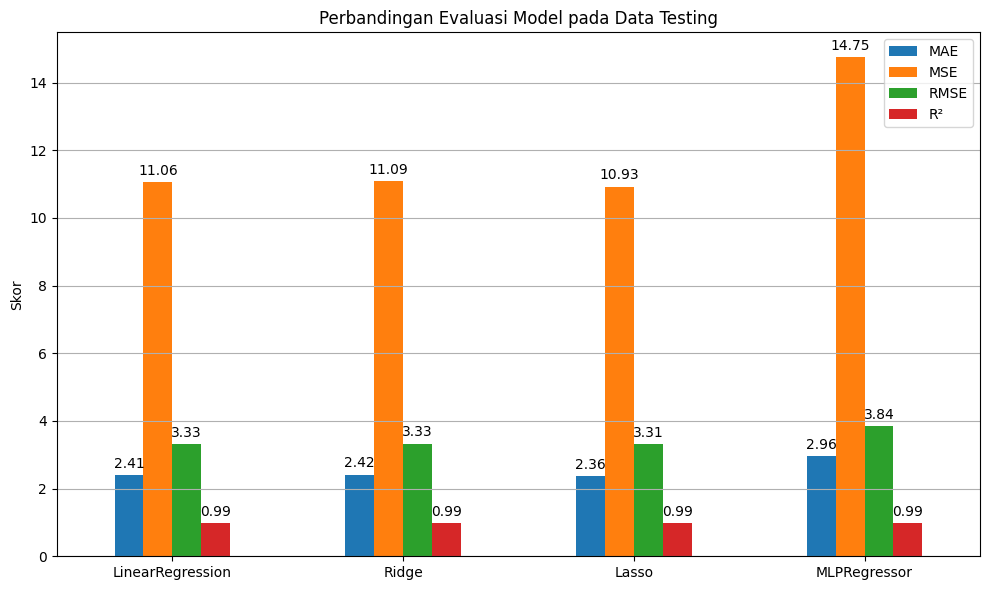

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_test_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Testing')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


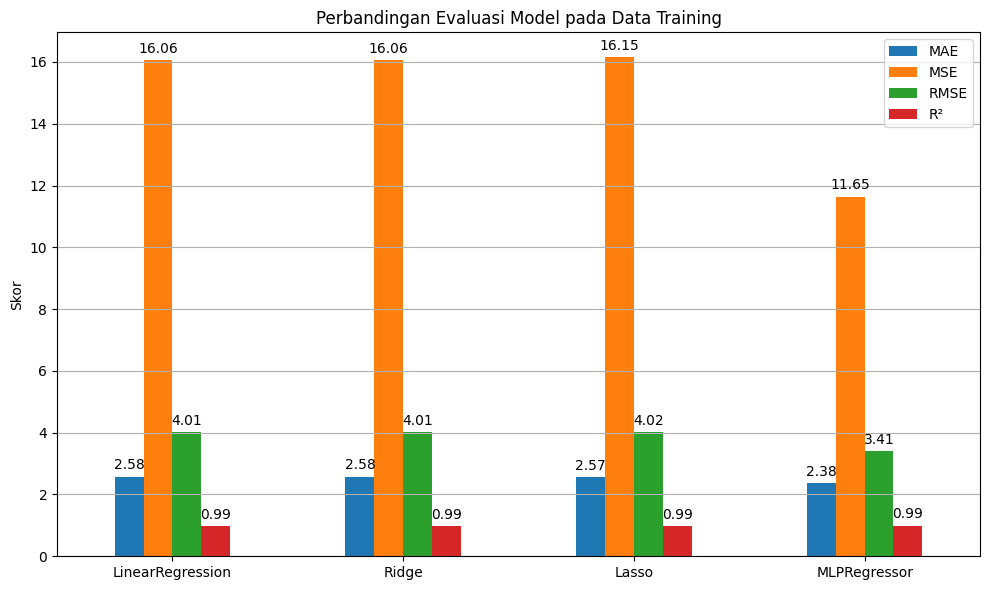

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_train_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Training')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


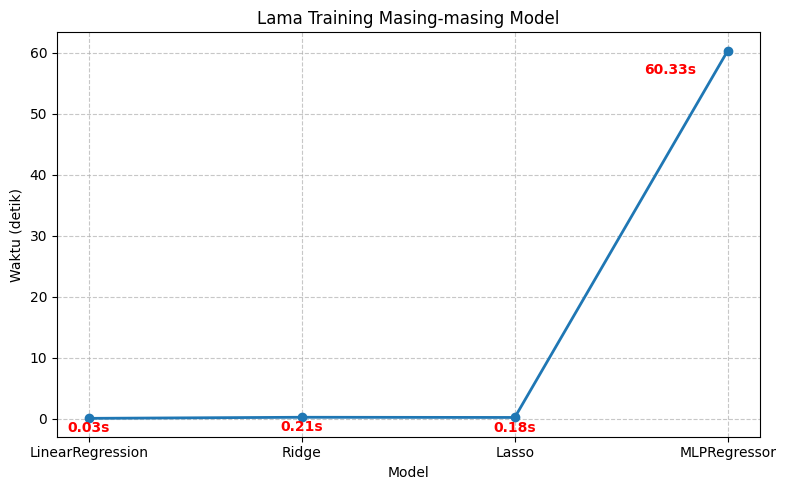

In [ ]:
# Ambil nama model dan waktu training dari dictionary
model_names = list(training_time.keys())
training_durations = list(training_time.values())


plt.figure(figsize=(8, 5))
plt.plot(model_names, training_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Training Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

for i, waktu in enumerate(training_durations):
    if i == len(training_durations) - 1:
        plt.text(i - 0.15, waktu - 2, f'{waktu:.2f}s',
                 ha='right', va='top',
                 fontsize=10, fontweight='bold', color='red')
    elif waktu < 1:
        plt.text(i, waktu - 0.5, f'{waktu:.2f}s',
                 ha='center', va='top',
                 fontsize=10, fontweight='bold', color='red')
    else:
        plt.text(i, waktu + 1.5, f'{waktu:.2f}s',
                 ha='center', va='bottom',
                 fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


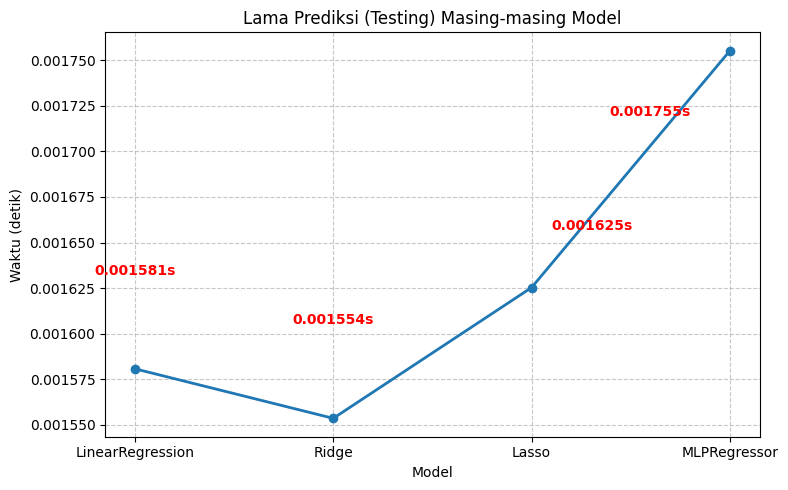

In [ ]:
model_names_test = list(inference_time_deffend.keys())
testing_durations = list(inference_time_deffend.values())

plt.figure(figsize=(8, 5))
plt.plot(model_names_test, testing_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Prediksi (Testing) Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

# Tambahkan label waktu yang rapi di setiap titik
for i, waktu in enumerate(testing_durations):
    model = model_names_test[i]

    if model == 'MLPRegressor':
        # Sedikit ke kiri dan turun sedikit
        plt.text(i - 0.2, waktu - 0.00003, f'{waktu:.6f}s',
                 ha='right', va='top', fontsize=10, fontweight='bold', color='red')
    elif model == 'Lasso':
        # Sedikit naik dan ke kanan agar tidak menabrak titik atau garis
        plt.text(i + 0.1, waktu + 0.00003, f'{waktu:.6f}s',
                 ha='left', va='bottom', fontsize=10, fontweight='bold', color='red')
    else:
        # Posisi default di atas
        plt.text(i, waktu + 0.00005, f'{waktu:.6f}s',
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Deffensive'] = y_test_pred_linreg_deffend  # atau y_test_pred_lasso
result_df['Actual_Deffensive'] = y_test_deffend.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Deffensive', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Deffensive,Actual_Deffensive
154,461,Carlos Romero,RCD Espanyol,Laliga,164.443750,162.0
663,1193,Pedro Pereira,Monza,Serie A,149.431852,145.0
390,802,Luis Pérez,Real Valladolid,Laliga,129.514527,139.0
286,666,Sam Morsy,Ipswich,Premier League,130.882551,136.0
337,731,Lucas Rosa,Real Valladolid,Laliga,126.212083,133.0
...,...,...,...,...,...,...
989,1662,Nunzio Lella,Venezia,Serie A,1.660995,0.0
1033,1709,Junior Ajayi,Verona,Serie A,0.210564,0.0
988,1661,Ben Godfrey,Atalanta,Serie A,1.643705,0.0
632,1087,Javi Martínez,CA Osasuna,Laliga,0.429859,0.0


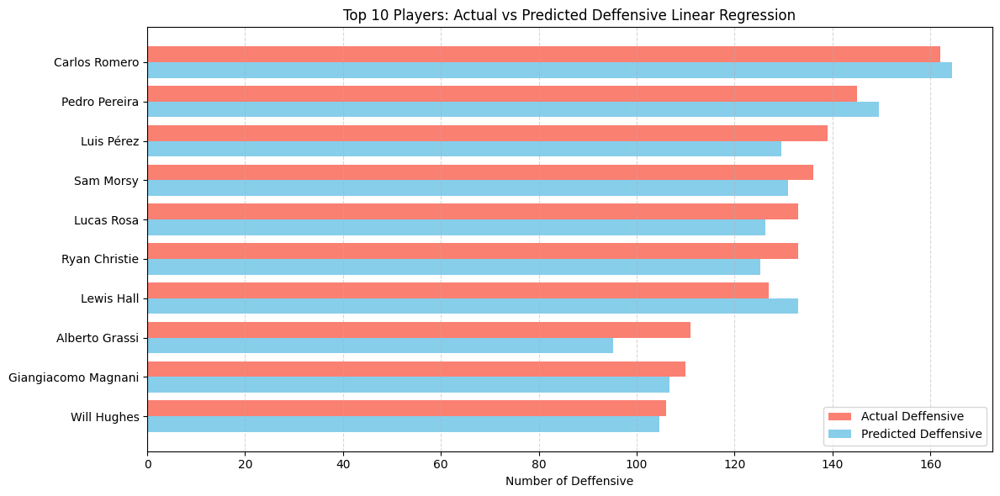

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Deffensive', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Deffensive'], bar_width, label='Actual Deffensive', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Deffensive'], bar_width, label='Predicted Deffensive', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Deffensive')
plt.title('Top 10 Players: Actual vs Predicted Deffensive Linear Regression')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Deffensive'] = y_test_pred_ridge_deffend  # atau y_test_pred_lasso
result_df['Actual_Deffensive'] = y_test_deffend.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Deffensive', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual




,index,Name,Team,League,Predicted_Deffensive,Actual_Deffensive
154,461,Carlos Romero,RCD Espanyol,Laliga,164.333969,162.0
663,1193,Pedro Pereira,Monza,Serie A,149.322788,145.0
390,802,Luis Pérez,Real Valladolid,Laliga,129.465789,139.0
286,666,Sam Morsy,Ipswich,Premier League,130.778155,136.0
337,731,Lucas Rosa,Real Valladolid,Laliga,126.122231,133.0
...,...,...,...,...,...,...
989,1662,Nunzio Lella,Venezia,Serie A,1.696758,0.0
1033,1709,Junior Ajayi,Verona,Serie A,0.203886,0.0
988,1661,Ben Godfrey,Atalanta,Serie A,1.703049,0.0
632,1087,Javi Martínez,CA Osasuna,Laliga,0.437478,0.0


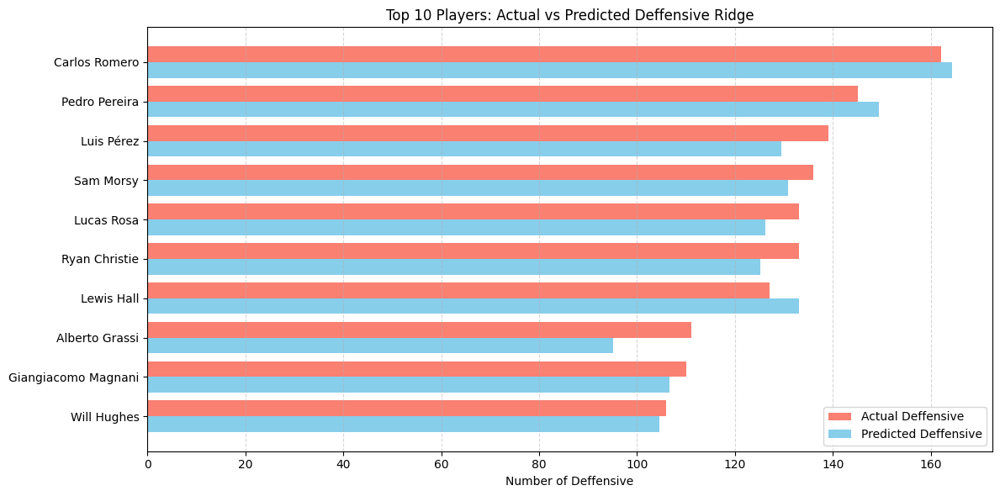

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Deffensive', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Deffensive'], bar_width, label='Actual Deffensive', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Deffensive'], bar_width, label='Predicted Deffensive', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Deffensive')
plt.title('Top 10 Players: Actual vs Predicted Deffensive Ridge')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Deffensive'] = y_test_pred_lasso_deffend  # atau y_test_pred_lasso
result_df['Actual_Deffensive'] = y_test_deffend.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Deffensive', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Deffensive,Actual_Deffensive
154,461,Carlos Romero,RCD Espanyol,Laliga,164.439957,162.0
663,1193,Pedro Pereira,Monza,Serie A,149.710357,145.0
390,802,Luis Pérez,Real Valladolid,Laliga,129.450839,139.0
286,666,Sam Morsy,Ipswich,Premier League,130.974074,136.0
337,731,Lucas Rosa,Real Valladolid,Laliga,126.388389,133.0
...,...,...,...,...,...,...
989,1662,Nunzio Lella,Venezia,Serie A,1.543262,0.0
1033,1709,Junior Ajayi,Verona,Serie A,0.264217,0.0
988,1661,Ben Godfrey,Atalanta,Serie A,1.404727,0.0
632,1087,Javi Martínez,CA Osasuna,Laliga,0.444077,0.0


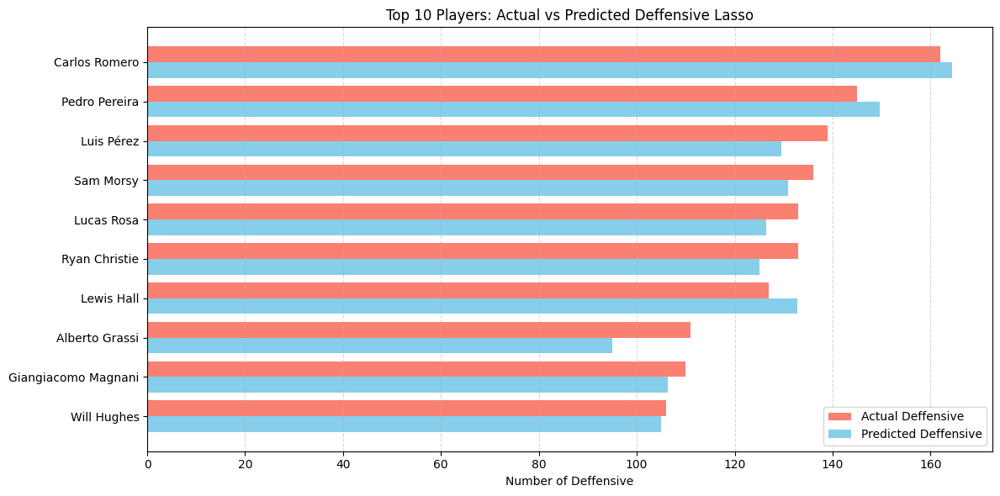

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Deffensive', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Deffensive'], bar_width, label='Actual Deffensive', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Deffensive'], bar_width, label='Predicted Deffensive', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Deffensive')
plt.title('Top 10 Players: Actual vs Predicted Deffensive Lasso')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Deffensive'] = y_test_pred_mlp_deffend
result_df['Actual_Deffensive'] = y_test_deffend.values
top_actual_scorers = result_df.sort_values(by='Actual_Deffensive', ascending=False)
top_10_actual = top_actual_scorers
top_10_actual



,index,Name,Team,League,Predicted_Deffensive,Actual_Deffensive
154,461,Carlos Romero,RCD Espanyol,Laliga,164.269192,162.0
663,1193,Pedro Pereira,Monza,Serie A,153.702872,145.0
390,802,Luis Pérez,Real Valladolid,Laliga,128.472466,139.0
286,666,Sam Morsy,Ipswich,Premier League,132.351263,136.0
337,731,Lucas Rosa,Real Valladolid,Laliga,127.928027,133.0
...,...,...,...,...,...,...
989,1662,Nunzio Lella,Venezia,Serie A,-0.217995,0.0
1033,1709,Junior Ajayi,Verona,Serie A,3.158607,0.0
988,1661,Ben Godfrey,Atalanta,Serie A,3.165955,0.0
632,1087,Javi Martínez,CA Osasuna,Laliga,-2.495674,0.0


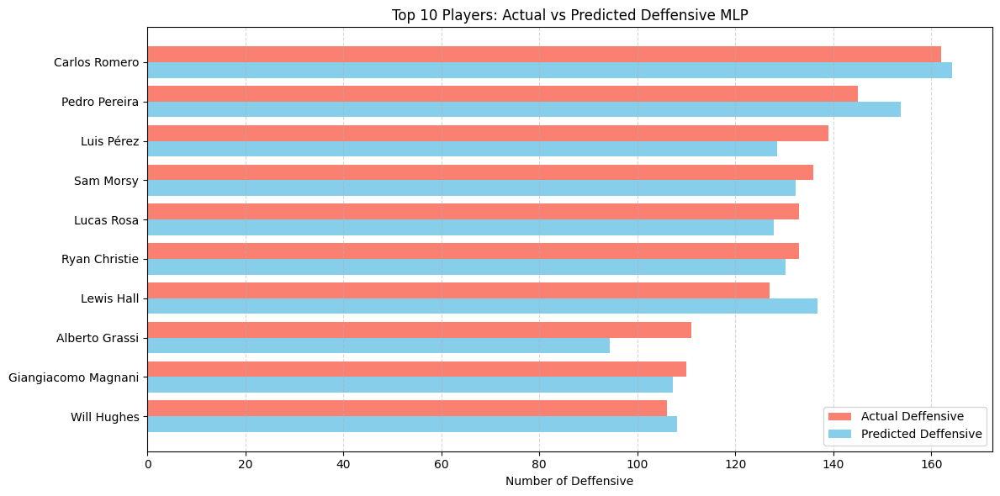

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Deffensive', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Deffensive'], bar_width, label='Actual Deffensive', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Deffensive'], bar_width, label='Predicted Deffensive', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Deffensive')
plt.title('Top 10 Players: Actual vs Predicted Deffensive MLP')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Ambil model Linear Regression
best_linreg_model = linreg_model  # atau langsung gunakan linreg_model

# Simpan model ke file .joblib
joblib.dump(best_linreg_model, 'best_linreg_model_Deffend.joblib')


['best_linreg_model_Deffend.joblib']

In [ ]:
from google.colab import files
files.download('best_linreg_model_Deffend.joblib')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 📊 Model Evaluation

## 🔹 Evaluation on Training Data
- All linear models (**Linear**, **Ridge**, and **Lasso**) achieved **R² = 0.74**, meaning they explained about **74% of the target variance**.
- **MLPRegressor** performed slightly better in training with **R² = 0.80**, but had **higher MSE**, indicating a potential for **mild overfitting**.
- In terms of error (**MAE**, **MSE**, and **RMSE**), all three linear models showed **very similar performance**, with **MAE ≈ 0.32** and **RMSE ≈ 0.52**.

---

## 🔹 Evaluation on Testing Data
- On testing data, all four models showed **R² = 0.71**, indicating comparable generalization performance.
- Error values (**MAE**, **MSE**, and **RMSE**) were also **uniform**, meaning **no model significantly outperformed the others** on unseen data.
- **MLPRegressor** did not maintain its advantage from training, so its added complexity did **not translate into better testing results**.

---

## ⏱️ Training Time
- **Linear models** are highly efficient:
  - **Linear Regression**: only **0.01 seconds**
  - **Ridge and Lasso**: around **0.15 seconds**
- **MLPRegressor**: required significantly longer training time (**22.08 seconds**) with **no meaningful accuracy gain**

---

## ✅ Conclusion and Recommendation

| **Model**       | **Testing Accuracy** | **Training Time** | **Recommendation**                                    |
|------------------|----------------------|--------------------|--------------------------------------------------------|
| MLPRegressor     | ⚖️ Similar            | 🕒 Very Long        | ❌ Not recommended due to inefficiency                 |
| Ridge / Lasso    | ⚖️ Similar            | ⚡️ Very Fast        | ✅ Recommended for **efficiency and stability**        |

> 🔍 **Recommendation:**
> - Choose **Ridge** or **Lasso Regression** for efficient and stable modeling.
> - Avoid **MLPRegressor** in this context, as its **complexity is not justified by accuracy gain**.


## **PREDICT TOP SAVES**

# **SPLIT DATA**

In [ ]:
# Simpan data identitas
name_team_saves = df[['Name', 'Team', 'League']].copy()

# Jadikan 3 kolom sebagai index
name_team_saves = name_team_saves.set_index(['League', 'Team', 'Name'])


In [ ]:
# Filter hanya goalkeeper
df_gk = df.copy()

# Tetapkan fitur dan target
X_gk = df_gk[[
    'League', 'Team','Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
    'Errors leading to goal', 'Accurate passes', 'Accurate passes %',
    'Clean sheets', 'Penalties saved', 'Saves from inside box', 'Runs out',
    'Defensive_Efficiency', 'Position'
]]
y_gk = df_gk['Saves']


In [ ]:
X_gk.isna().sum()

,0
League,0
Team,0
Average Sofascore,0
Tackles,0
Interceptions,0
Clearances,0
Errors leading to goal,0
Accurate passes,0
Accurate passes %,0
Clean sheets,0


In [ ]:
y_gk.isna().sum()

np.int64(0)

# **HANDLING OUTLIER**

In [ ]:
import scipy.stats as stats

def check_plot(df_gk, variable):
    # fungsi mengambil kerangka data (df) dan
    # variabel yang diminati sebagai argumen

    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df_gk[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df_gk[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df_gk[variable])
    plt.title('Boxplot')
    plt.savefig(f'{col}_distribution.jpg', format='jpg')
    plt.show()

In [ ]:
# Pilih kolom numerik
numeric_cols = X_gk.select_dtypes(include=['number']).columns
numeric_cols

Index(['Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
       'Errors leading to goal', 'Accurate passes', 'Accurate passes %',
       'Clean sheets', 'Penalties saved', 'Saves from inside box', 'Runs out',
       'Defensive_Efficiency'],
      dtype='object')

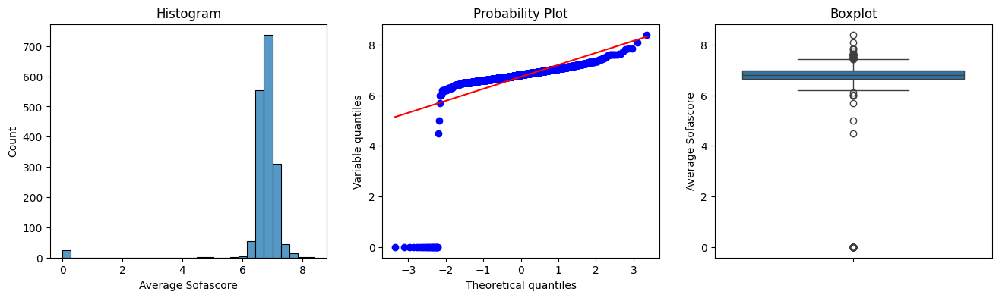

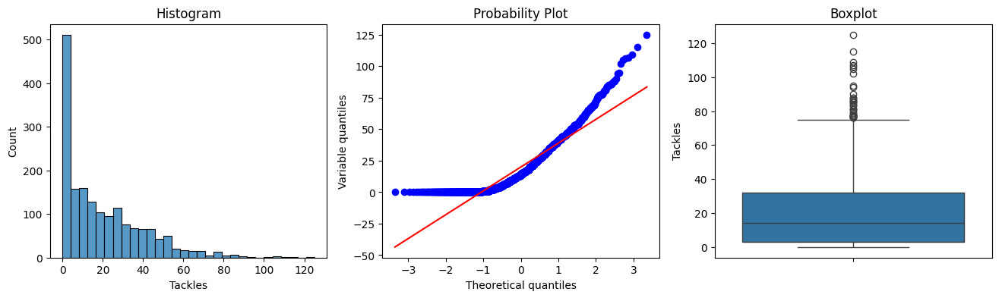

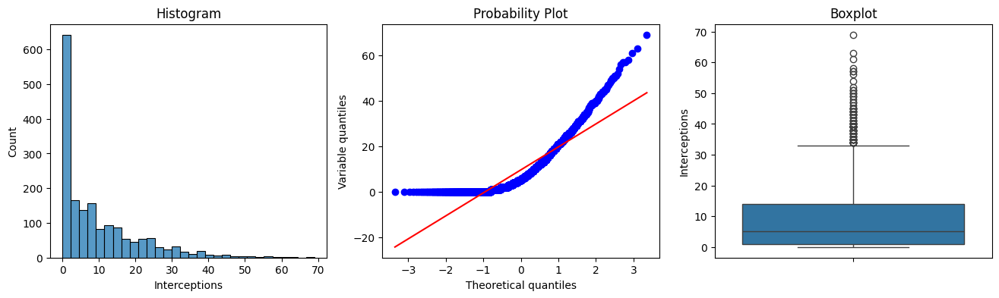

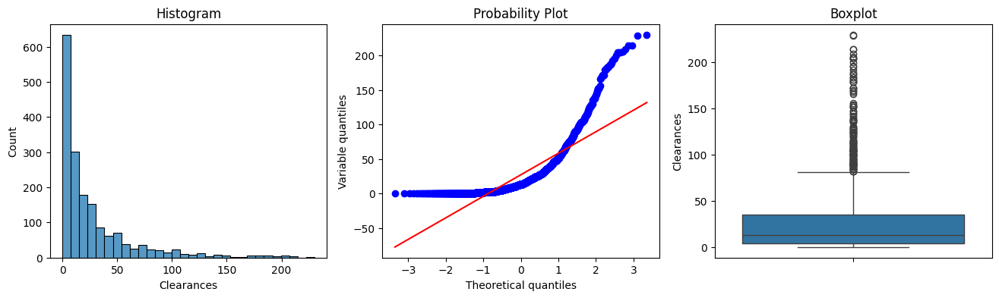

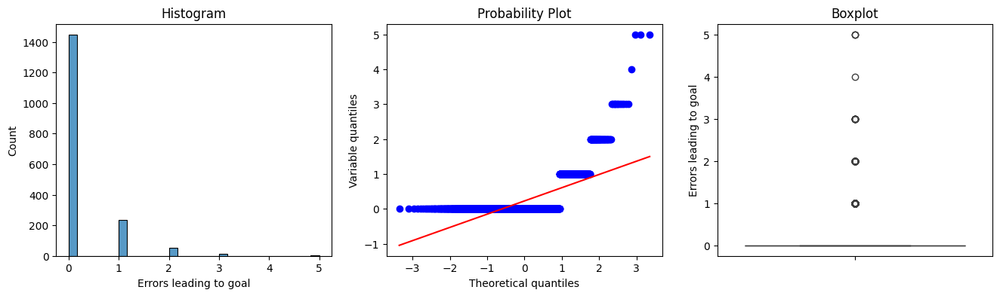

...

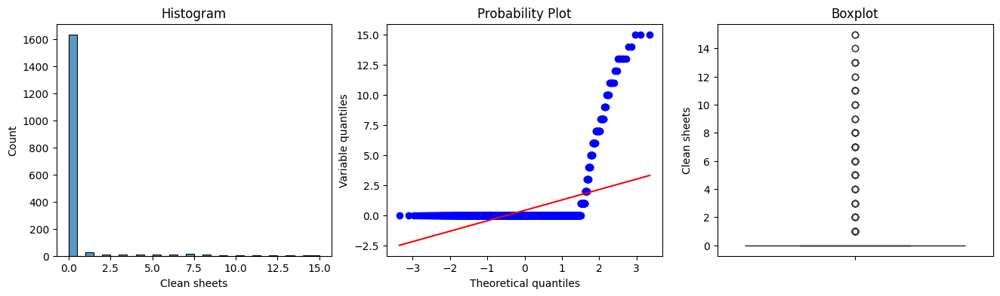

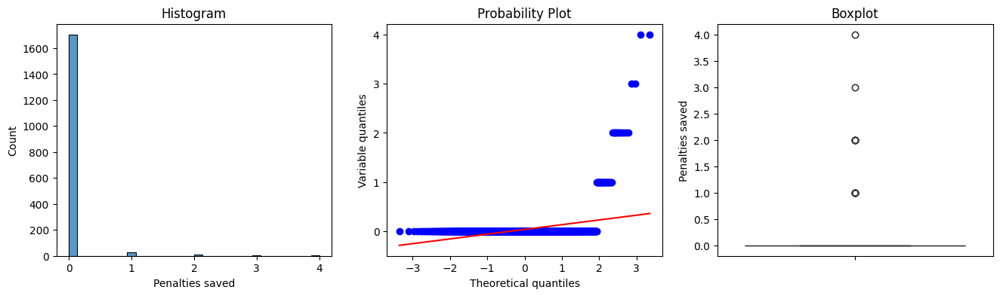

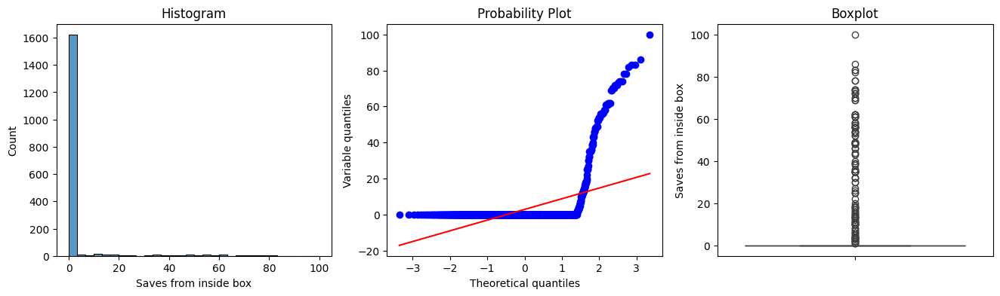

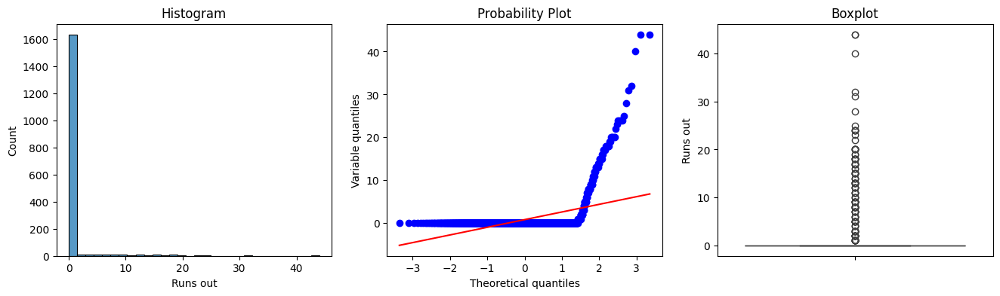

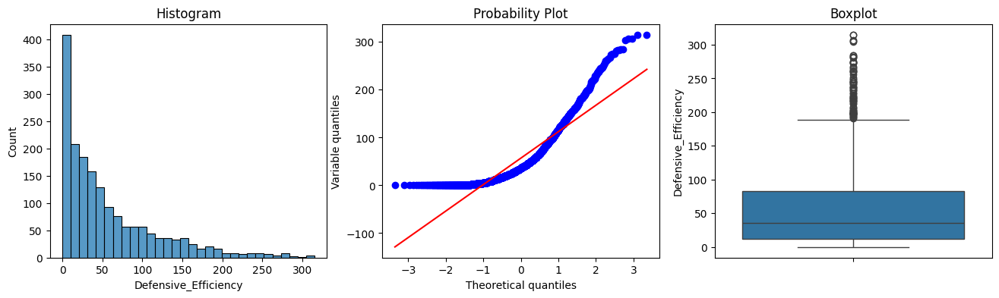

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in numeric_cols:
    check_plot(X_gk, col)

In [ ]:
def find_outlier_boundary(df, variable):

    # Mari kita hitung batas luar yang merupakan outlier

    IQR = df_gk[variable].quantile(0.75) - df_gk[variable].quantile(0.25)

    lower_boundary = df_gk[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df_gk[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary

In [ ]:
# Kolom-kolom dengan outlier berdasarkan boxplot
col_outlier = [
 'Average Sofascore',
    'Tackles',
    'Clearances',
    'Accurate passes',
    'Accurate passes %',
    'Defensive_Efficiency'
# 'Errors leading to goal'
]


# 5. Buat mask gabungan untuk semua kolom outlier
mask = pd.Series(True, index=X_gk.index)  # semua True
for col in col_outlier:
    upper, lower = find_outlier_boundary(X_gk, col)
    mask &= (X_gk[col] <= upper) & (X_gk[col] >= lower)

# 6. Terapkan mask ke X dan y
X_clean = X_gk[mask].copy()
y_clean = y_gk[mask].copy()


In [ ]:
name_team = df_gk[['Name', 'Team', 'League']].copy()
name_team.index = X_gk.index  # Samakan index dengan X sebelum masking
name_team_clean = name_team[mask].reset_index()


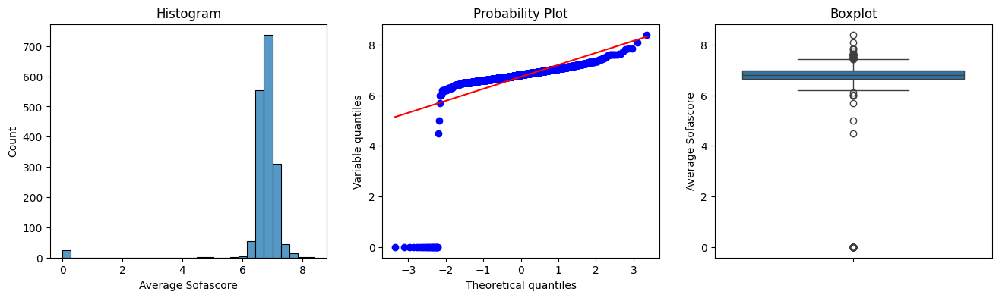

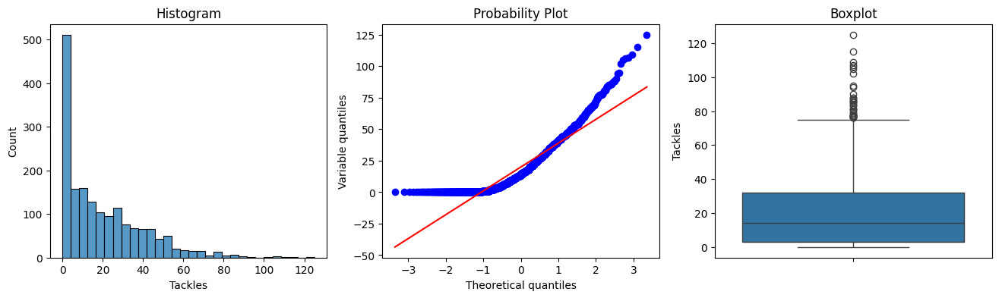

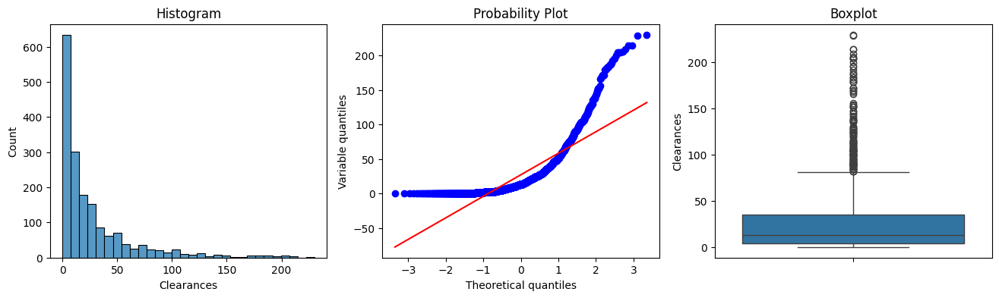

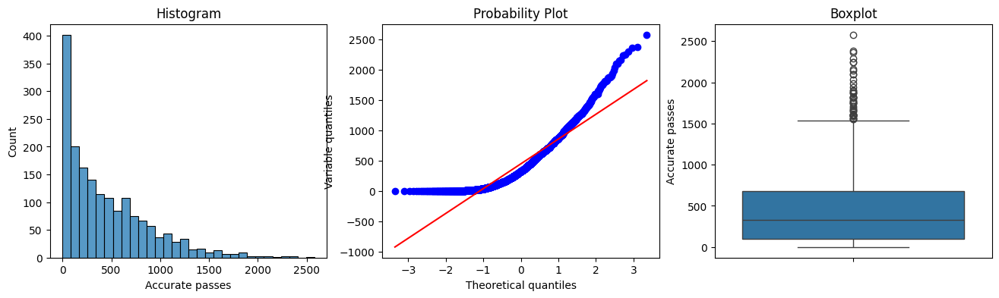

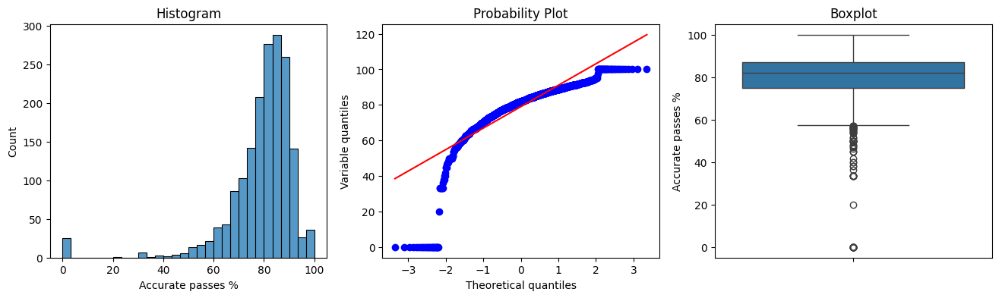

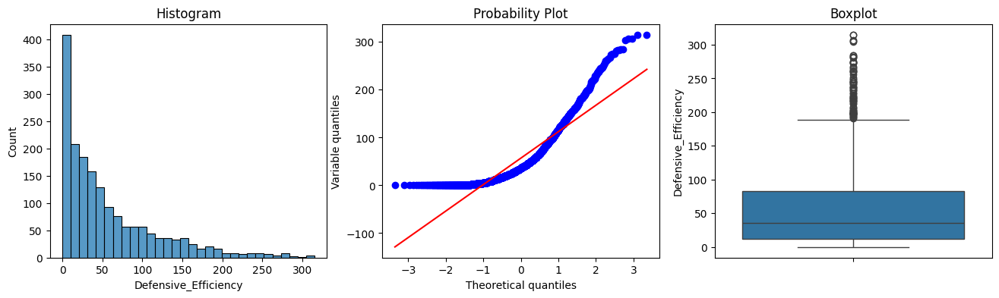

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in col_outlier:
    check_plot(X_gk, col)

# **TRAIN-TEST SPLIT**

In [ ]:
# 7. Train-test split setelah data bersih dari outlier
X_train, X_test, y_train, y_test, name_train, name_test = train_test_split(
    X_clean, y_clean, name_team_clean, test_size=0.2, random_state=1000
)



In [ ]:
# check train data dimension
X_train.shape

(1146, 15)

In [ ]:
# check test data dimension
X_test.shape

(287, 15)

In [ ]:
# check train target counts
y_train.value_counts()

,count
Saves,
0.0,1056
17.0,4
4.0,4
67.0,3
50.0,3
96.0,3
1.0,3
3.0,3
11.0,3


In [ ]:
# check test target counts
y_test.value_counts()

,count
Saves,
0.0,260
83.0,2
65.0,2
53.0,2
88.0,2
18.0,2
96.0,1
52.0,1
44.0,1


# **ENCODING**

In [ ]:
# Gabungkan X_train dan y_train untuk referensi nilai rata-rata
X_train['Saves'] = y_train  # sementara tambahkan target ke X_train

# Daftar kolom kategorikal
cat_cols = ['League', 'Team', 'Position']

# Dictionary untuk menyimpan mapping mean encoding
mean_encoders_saves = {}

for col in cat_cols:
    # Hitung rata-rata Saves per kategori dari training set
    mean_map = X_train.groupby(col)['Saves'].mean()

    # Simpan mapping ke dictionary
    mean_encoders_saves[col] = mean_map

    # Mapping mean encoding ke training dan test set
    X_train[col] = X_train[col].map(mean_map)
    X_test[col] = X_test[col].map(mean_map)

    # Tangani kategori baru di test set
    X_test[col].fillna(X_train['Saves'].mean(), inplace=True)

# Hapus target dari training set
X_train.drop(columns='Saves', inplace=True)

# Simpan mapping ke file joblib
joblib.dump(mean_encoders_saves, "mean_encoders_saves.joblib")

<ipython-input-157-c9a4e74bc8ba>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_test[col].fillna(X_train['Saves'].mean(), inplace=True)
<ipython-input-157-c9a4e74bc8ba>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tru

['mean_encoders_saves.joblib']

# **MULTICOLLINEARITY**

In [ ]:
# Ubah semua kolom boolean ke integer
X_train_numeric = X_train.copy()
X_train_numeric = X_train_numeric.astype({col: int for col in X_train_numeric.select_dtypes('bool').columns})

# Tambahkan konstanta untuk VIF
from statsmodels.tools.tools import add_constant
X_vif = add_constant(X_train_numeric)

# Hitung VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = pd.DataFrame({
    'feature': X_vif.columns,
    'vif_score': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

# Hapus konstanta
vif_df = vif_df[vif_df['feature'] != 'const']

# Tampilkan hasil
print(vif_df)


                   feature  vif_score
1                   League   1.181871
2                     Team   1.230636
3        Average Sofascore   1.608110
4                  Tackles        inf
5            Interceptions        inf
6               Clearances        inf
7   Errors leading to goal   1.292046
8          Accurate passes   3.981645
9        Accurate passes %   1.350085
10            Clean sheets   4.358625
11         Penalties saved   1.754964
12   Saves from inside box   7.000062
13                Runs out   4.416367
14    Defensive_Efficiency        inf
15                Position   2.873355


/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


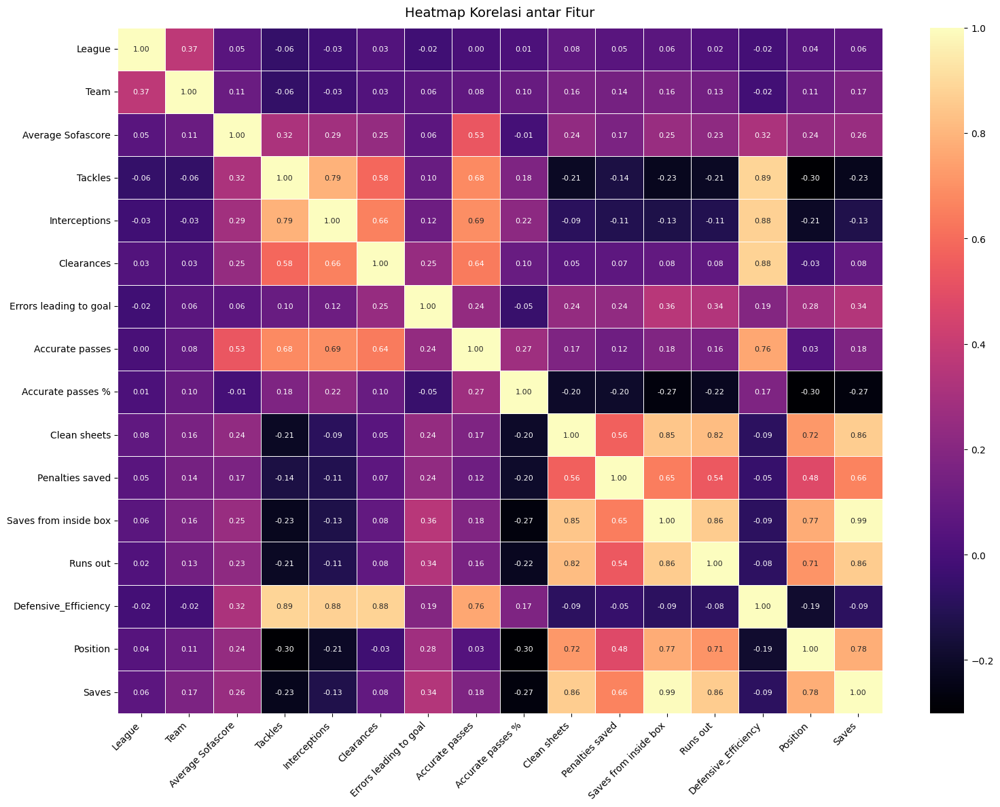

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Hitung korelasi hanya antar kolom numerik
market_value_train = pd.concat([X_train, y_train], axis=1)
corr_matrix = market_value_train.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(16, 12))  # Lebar dan tinggi diperbesar agar tidak bertumpuk
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="magma",  # atau gunakan "coolwarm", "viridis" dsb.
    linewidths=0.5,
    cbar=True,
    annot_kws={"size": 8}  # Ukuran teks anotasi
)

plt.xticks(rotation=45, ha='right')  # Putar label kolom agar tidak menabrak
plt.yticks(rotation=0)
plt.title("Heatmap Korelasi antar Fitur", fontsize=14, pad=12)
plt.tight_layout()  # Otomatis atur padding agar tidak terpotong
plt.show()


In [ ]:
# Drop fitur
X_train = X_train.drop(columns=['Tackles', 'Interceptions', 'Defensive_Efficiency', 'Clean sheets', 'Runs out', 'Position'])
X_test = X_test.drop(columns=['Tackles', 'Interceptions', 'Defensive_Efficiency', 'Clean sheets', 'Runs out', 'Position'])
# 'Tackles', 'Interceptions', 'Defensive_Efficiency', 'Clean sheets', 'Runs out'

# **FEATURE SCALLING (STANDAR SCALLAR)**

In [ ]:
X_train.describe()

,League,Team,Average Sofascore,Clearances,Errors leading to goal,Accurate passes,Accurate passes %,Penalties saved,Saves from inside box
count,1146.000000,1146.000000,1146.000000,1146.000000,1146.000000,1146.000000,1146.000000,1146.000000,1146.000000
mean,4.007853,4.007853,6.801099,18.155323,0.175393,373.604712,80.781859,0.036649,2.632635
std,1.108528,2.960001,0.213846,18.821440,0.481760,323.779633,8.577831,0.258414,11.532007
min,2.756614,0.000000,6.200000,0.000000,0.000000,1.000000,57.280000,0.000000,0.000000
25%,2.756614,1.190476,6.650000,4.000000,0.000000,107.250000,75.475000,0.000000,0.000000
50%,3.771505,4.115385,6.790000,12.000000,0.000000,287.500000,81.930000,0.000000,0.000000
75%,5.424242,5.941176,6.940000,26.000000,0.000000,576.750000,86.887500,0.000000,0.000000
max,5.424242,12.315789,7.420000,81.000000,5.000000,1486.000000,100.000000,4.000000,100.000000


In [ ]:
from sklearn.preprocessing import StandardScaler

columns_to_stdscaler = ['Average Sofascore',
'League',
'Team',
'Clearances',
'Errors leading to goal',
'Accurate passes',
'Accurate passes %',
'Penalties saved',
'Saves from inside box',
]


# Inisialisasi StandardScaler
scaler = StandardScaler()

# Terapkan StandardScaler hanya pada kolom numerik terpilih
X_train_scaled = X_train.copy()


# Fit scaler pada data training, lalu transform data training
X_train_scaled[columns_to_stdscaler] = scaler.fit_transform(X_train[columns_to_stdscaler])

# Transform data test (menggunakan scaler yang sama)
X_test[columns_to_stdscaler] = scaler.transform(X_test[columns_to_stdscaler])

In [ ]:
X_train_scaled.describe()

,League,Team,Average Sofascore,Clearances,Errors leading to goal,Accurate passes,Accurate passes %,Penalties saved,Saves from inside box
count,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03,1.146000e+03
mean,3.875124e-17,6.897721e-17,2.526581e-16,1.092785e-16,-2.480079e-17,6.200198e-17,-2.681586e-16,1.240040e-17,-1.472547e-17
std,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00,1.000437e+00
min,-1.129232e+00,-1.354595e+00,-2.812120e+00,-9.650297e-01,-3.642255e-01,-1.151300e+00,-2.741033e+00,-1.418854e-01,-2.283891e-01
25%,-1.129232e+00,-9.522320e-01,-7.068877e-01,-7.524134e-01,-3.642255e-01,-8.230011e-01,-6.189415e-01,-1.418854e-01,-2.283891e-01
50%,-2.133020e-01,3.634396e-02,-5.192661e-02,-3.271806e-01,-3.642255e-01,-2.660523e-01,1.339083e-01,-1.418854e-01,-2.283891e-01
75%,1.278278e+00,6.534347e-01,6.498174e-01,4.169767e-01,-3.642255e-01,6.276923e-01,7.121039e-01,-1.418854e-01,-2.283891e-01
max,1.278278e+00,2.807960e+00,2.895398e+00,3.340452e+00,1.001892e+01,3.437155e+00,2.241421e+00,1.534389e+01,8.446914e+00


## **MODELLING**

# **LINEAR REGRESSION, RIDGE, AND LASSO**

In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Dictionary untuk menyimpan hasil evaluasi dan durasi
results_test = {}
training_time = {}

# Linear Regression
start_time = time.time()
linreg_model = LinearRegression()
linreg_model.fit(X_train_scaled, y_train)
training_time['LinearRegression'] = time.time() - start_time

# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
start_time = time.time()
ridge_grid = GridSearchCV(Ridge(max_iter=10000, tol=1e-4), ridge_params, cv=5, scoring='r2')
ridge_grid.fit(X_train_scaled, y_train)
training_time['Ridge'] = time.time() - start_time

# Lasso Regression
lasso_params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
start_time = time.time()
lasso_grid = GridSearchCV(Lasso(max_iter=10000, tol=1e-4), lasso_params, cv=5, scoring='r2')
lasso_grid.fit(X_train_scaled, y_train)
training_time['Lasso'] = time.time() - start_time



#  **MLP REGRESSOR**

In [ ]:
import time
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV

# Hyperparameter grid untuk MLP
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate_init': [0.001, 0.01],
    'max_iter': [10000]
}

# Inisialisasi GridSearchCV
mlp_grid = GridSearchCV(
    MLPRegressor(random_state=42, early_stopping=True,
    n_iter_no_change=10),
    mlp_params,
    cv=5,
    scoring='r2'
)

# Mulai hitung waktu
start_time = time.time()

# Training model
mlp_grid.fit(X_train_scaled, y_train)

# Selesai training
end_time = time.time()
training_duration = end_time - start_time



# **EVALUATION**

In [ ]:
# =============================
# Evaluasi TRAINING
y_train_pred_linreg = linreg_model.predict(X_train_scaled)
y_train_pred_ridge = ridge_grid.best_estimator_.predict(X_train_scaled)
y_train_pred_lasso = lasso_grid.best_estimator_.predict(X_train_scaled)
y_train_pred_mlp = mlp_grid.best_estimator_.predict(X_train_scaled)

linreg_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_linreg),
    'MSE': mean_squared_error(y_train, y_train_pred_linreg),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_linreg)),
    'R²': r2_score(y_train, y_train_pred_linreg)
}

ridge_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_ridge),
    'MSE': mean_squared_error(y_train, y_train_pred_ridge),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_ridge)),
    'R²': r2_score(y_train, y_train_pred_ridge)
}

lasso_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_lasso),
    'MSE': mean_squared_error(y_train, y_train_pred_lasso),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_lasso)),
    'R²': r2_score(y_train, y_train_pred_lasso)
}

mlp_metrics_train = {
    'MAE': mean_absolute_error(y_train, y_train_pred_mlp),
    'MSE': mean_squared_error(y_train, y_train_pred_mlp),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred_mlp)),
    'R²': r2_score(y_train, y_train_pred_mlp)
}

eval_train_df = pd.DataFrame(
    [linreg_metrics_train, ridge_metrics_train, lasso_metrics_train, mlp_metrics_train],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Evaluasi TESTING
y_test_pred_linreg = linreg_model.predict(X_test)
y_test_pred_ridge = ridge_grid.best_estimator_.predict(X_test)
y_test_pred_lasso = lasso_grid.best_estimator_.predict(X_test)
y_test_pred_mlp = mlp_grid.best_estimator_.predict(X_test)

linreg_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_linreg),
    'MSE': mean_squared_error(y_test, y_test_pred_linreg),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_linreg)),
    'R²': r2_score(y_test, y_test_pred_linreg)
}

ridge_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_ridge),
    'MSE': mean_squared_error(y_test, y_test_pred_ridge),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_ridge)),
    'R²': r2_score(y_test, y_test_pred_ridge)
}

lasso_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_lasso),
    'MSE': mean_squared_error(y_test, y_test_pred_lasso),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_lasso)),
    'R²': r2_score(y_test, y_test_pred_lasso)
}

mlp_metrics_test = {
    'MAE': mean_absolute_error(y_test, y_test_pred_mlp),
    'MSE': mean_squared_error(y_test, y_test_pred_mlp),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred_mlp)),
    'R²': r2_score(y_test, y_test_pred_mlp)
}

eval_test_df = pd.DataFrame(
    [linreg_metrics_test, ridge_metrics_test, lasso_metrics_test, mlp_metrics_test],
    index=['LinearRegression', 'Ridge', 'Lasso', 'MLPRegressor']
)

# =============================
# Durasi Testing (Inference Time)
import time

inference_time = {}

start = time.time()
linreg_model.predict(X_test)
inference_time['LinearRegression'] = time.time() - start

start = time.time()
ridge_grid.best_estimator_.predict(X_test)
inference_time['Ridge'] = time.time() - start

start = time.time()
lasso_grid.best_estimator_.predict(X_test)
inference_time['Lasso'] = time.time() - start

start = time.time()
mlp_grid.best_estimator_.predict(X_test)
inference_time['MLPRegressor'] = time.time() - start


# =============================
# Cetak hasil evaluasi
print("📊 Evaluasi Model pada Data Training:")
print(eval_train_df)

print("\n📊 Evaluasi Model pada Data Testing:")
print(eval_test_df)

# =============================
# Cetak waktu training
training_time['MLPRegressor'] = training_duration

# Cetak waktu training semua model dari dictionary
print("\n⏱️ Lama Training Masing-masing Model (dalam detik):")
for model, waktu in training_time.items():
    print(f"{model}: {waktu:.2f} detik")

# =============================
# Cetak waktu testing
print("\n⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):")
for model, waktu in inference_time.items():
    print(f"{model}: {waktu:.6f} detik")

📊 Evaluasi Model pada Data Training:
                       MAE       MSE      RMSE        R²
LinearRegression  0.547807  2.844500  1.686564  0.990676
Ridge             0.549315  2.844940  1.686695  0.990675
Lasso             0.535330  2.845411  1.686834  0.990673
MLPRegressor      0.559593  2.081409  1.442709  0.993178

📊 Evaluasi Model pada Data Testing:
                       MAE       MSE      RMSE        R²
LinearRegression  0.700844  4.023981  2.005986  0.990468
Ridge             0.704274  4.062787  2.015636  0.990376
Lasso             0.688623  4.035778  2.008925  0.990440
MLPRegressor      0.914031  6.224135  2.494822  0.985256

⏱️ Lama Training Masing-masing Model (dalam detik):
LinearRegression: 0.00 detik
Ridge: 0.14 detik
Lasso: 0.11 detik
MLPRegressor: 32.73 detik

⚡ Lama Prediksi (Testing) Masing-masing Model (dalam detik):
LinearRegression: 0.001329 detik
Ridge: 0.001408 detik
Lasso: 0.001584 detik
MLPRegressor: 0.001605 detik


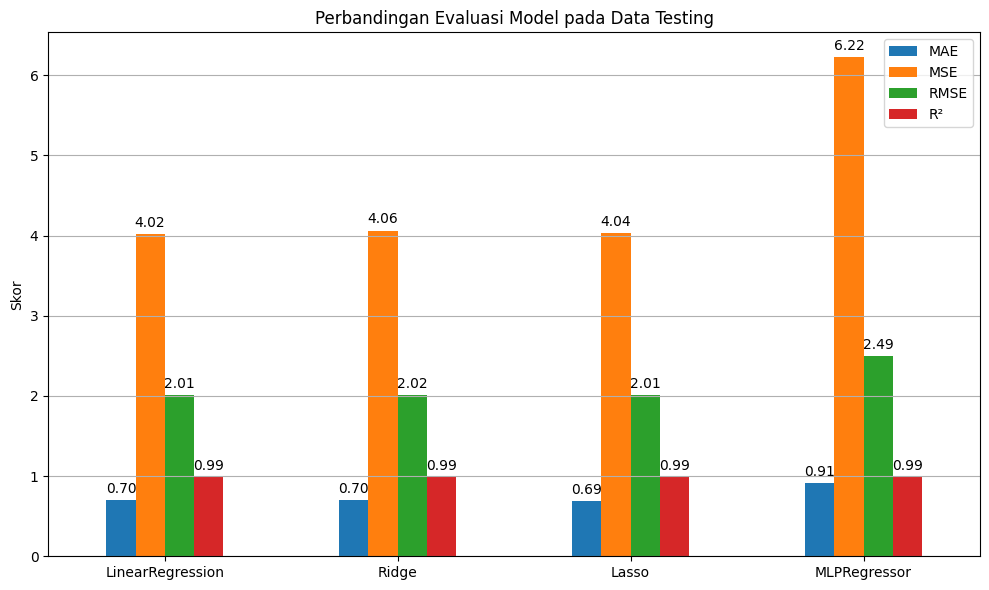

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_test_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Testing')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


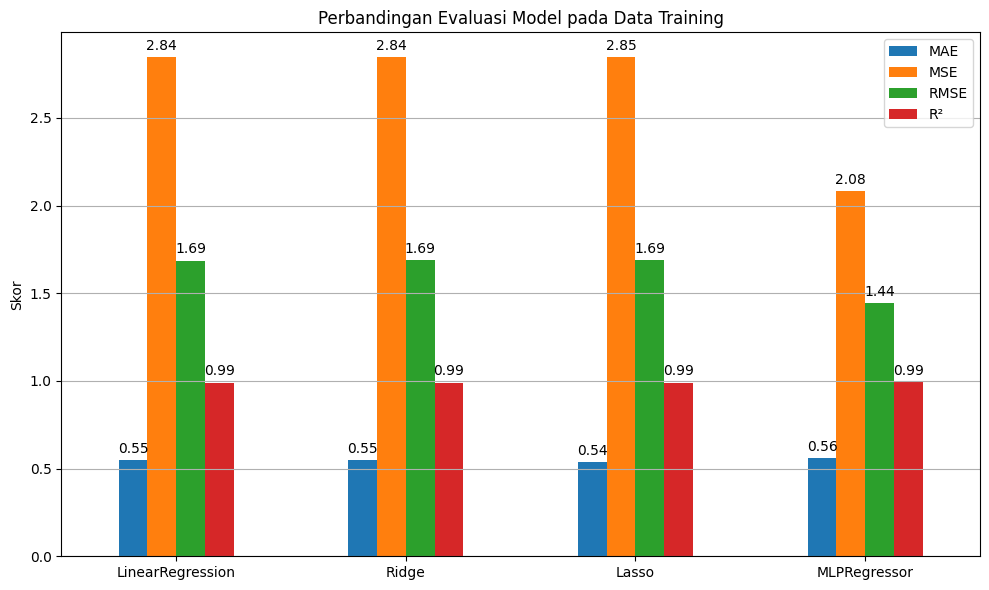

In [ ]:
# Plot bar chart dari evaluasi data training
ax = eval_train_df.plot(kind='bar', figsize=(10, 6))
plt.title('Perbandingan Evaluasi Model pada Data Training')
plt.ylabel('Skor')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()

# Tambahkan label angka di atas batang
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3)

plt.show()


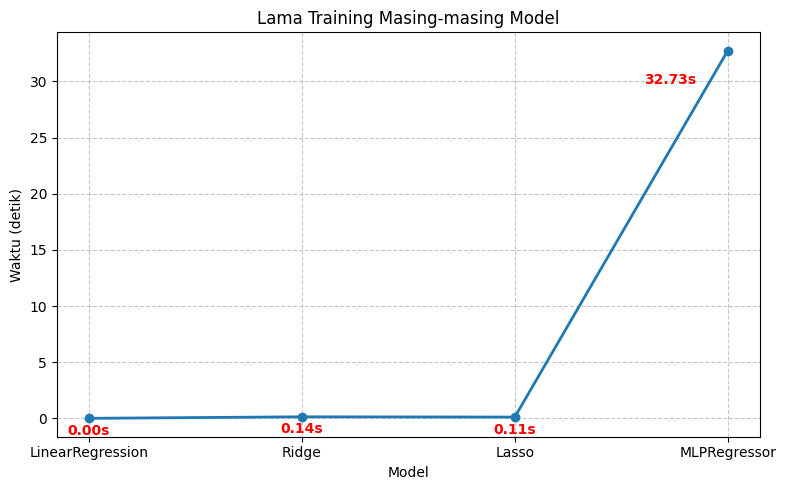

In [ ]:
# Ambil nama model dan waktu training dari dictionary
model_names = list(training_time.keys())
training_durations = list(training_time.values())


plt.figure(figsize=(8, 5))
plt.plot(model_names, training_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Training Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

for i, waktu in enumerate(training_durations):
    if i == len(training_durations) - 1:
        plt.text(i - 0.15, waktu - 2, f'{waktu:.2f}s',
                 ha='right', va='top',
                 fontsize=10, fontweight='bold', color='red')
    elif waktu < 1:
        plt.text(i, waktu - 0.5, f'{waktu:.2f}s',
                 ha='center', va='top',
                 fontsize=10, fontweight='bold', color='red')
    else:
        plt.text(i, waktu + 1.5, f'{waktu:.2f}s',
                 ha='center', va='bottom',
                 fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


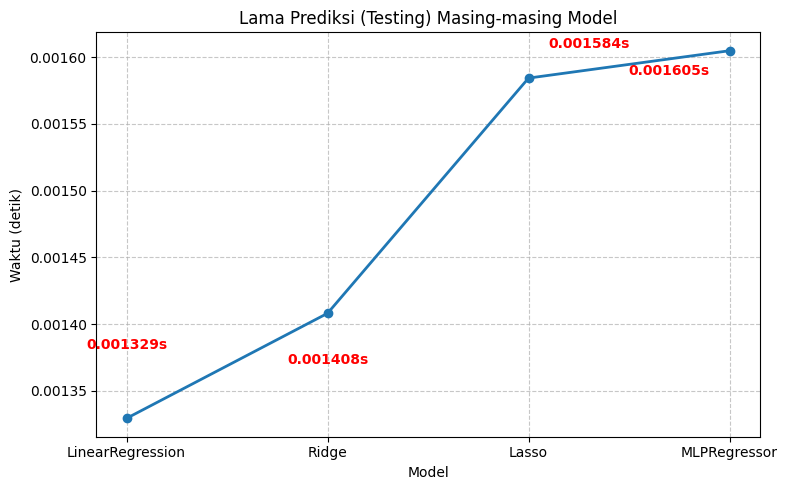

In [ ]:
# Ambil nama model dan durasi testing
model_names = list(inference_time.keys())
testing_durations = list(inference_time.values())

plt.figure(figsize=(8, 5))
plt.plot(model_names, testing_durations, marker='o', linestyle='-', linewidth=2)

plt.title('Lama Prediksi (Testing) Masing-masing Model')
plt.xlabel('Model')
plt.ylabel('Waktu (detik)')
plt.grid(True, linestyle='--', alpha=0.7)

# Tambahkan label waktu dengan posisi yang disesuaikan per model
for i, waktu in enumerate(testing_durations):
    model = model_names[i]

    if model == 'MLPRegressor':
        plt.text(i - 0.1, waktu - 0.00001, f'{waktu:.6f}s',
                 ha='right', va='top', fontsize=10, fontweight='bold', color='red')
    elif model == 'Lasso':
        plt.text(i + 0.1, waktu + 0.00002, f'{waktu:.6f}s',
                 ha='left', va='bottom', fontsize=10, fontweight='bold', color='red')
    elif model == 'Ridge':
        plt.text(i, waktu - 0.00003, f'{waktu:.6f}s',
                 ha='center', va='top', fontsize=10, fontweight='bold', color='red')
    else:  # LinearRegression
        plt.text(i, waktu + 0.00005, f'{waktu:.6f}s',
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='red')

plt.tight_layout()
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Saves'] = y_test_pred_linreg  # atau y_test_pred_lasso
result_df['Actual_Saves'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Saves', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Saves,Actual_Saves
1208,1480,Vanja Milinković-Savić,Torino,Serie A,131.618621,128.0
1216,1489,Mile Svilar,Roma,Serie A,92.330717,112.0
1231,1506,Zion Suzuki,Parma,Serie A,107.125407,96.0
41,79,Kepa Arrizabalaga,Bournemouth,Premier League,89.875513,95.0
1118,1372,Mike Maignan,AC Milan,Serie A,87.005317,94.0
...,...,...,...,...,...,...
1202,1469,Loum Tchaouna,Lazio,Serie A,-0.547682,0.0
312,448,Joe Gomez,Liverpool,Premier League,-0.051085,0.0
1286,1577,Andrea Colpani,Fiorentina,Serie A,0.351994,0.0
1146,1408,Gianluca Busio,Venezia,Serie A,0.269644,0.0


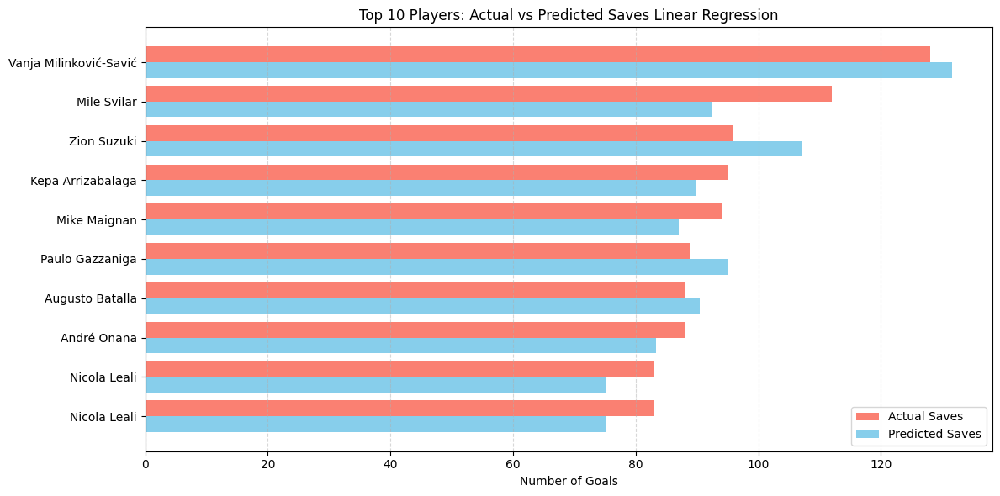

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Saves', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Saves'], bar_width, label='Actual Saves', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Saves'], bar_width, label='Predicted Saves', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Goals')
plt.title('Top 10 Players: Actual vs Predicted Saves Linear Regression')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Saves'] = y_test_pred_ridge  # atau y_test_pred_lasso
result_df['Actual_Saves'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Saves', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Saves,Actual_Saves
1208,1480,Vanja Milinković-Savić,Torino,Serie A,131.676181,128.0
1216,1489,Mile Svilar,Roma,Serie A,92.188758,112.0
1231,1506,Zion Suzuki,Parma,Serie A,106.954155,96.0
41,79,Kepa Arrizabalaga,Bournemouth,Premier League,89.742328,95.0
1118,1372,Mike Maignan,AC Milan,Serie A,86.928484,94.0
...,...,...,...,...,...,...
1202,1469,Loum Tchaouna,Lazio,Serie A,-0.535381,0.0
312,448,Joe Gomez,Liverpool,Premier League,-0.055884,0.0
1286,1577,Andrea Colpani,Fiorentina,Serie A,0.357179,0.0
1146,1408,Gianluca Busio,Venezia,Serie A,0.272151,0.0


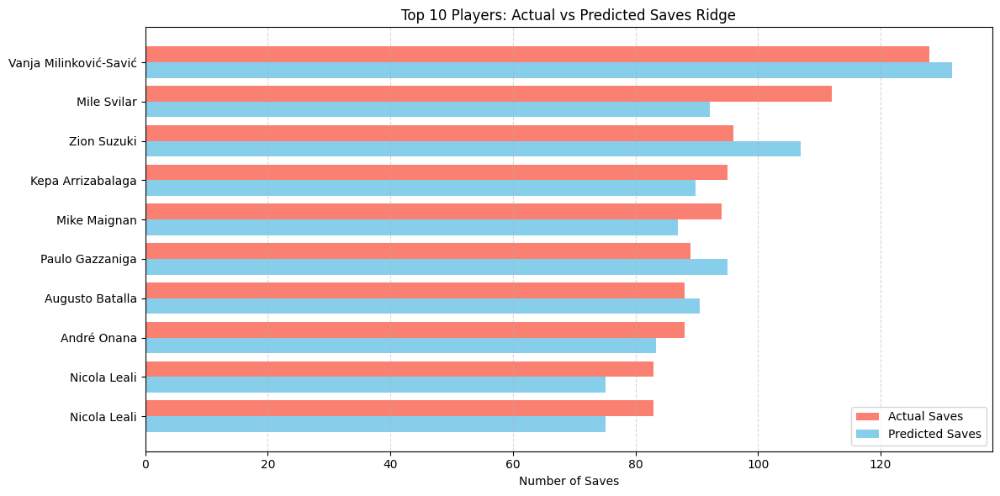

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Saves', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Saves'], bar_width, label='Actual Saves', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Saves'], bar_width, label='Predicted Saves', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Saves')
plt.title('Top 10 Players: Actual vs Predicted Saves Ridge')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Saves'] = y_test_pred_lasso  # atau y_test_pred_lasso
result_df['Actual_Saves'] = y_test.values     # tambahkan nilai asli

# Urutkan berdasarkan goal sebenarnya tertinggi
top_actual_scorers = result_df.sort_values(by='Actual_Saves', ascending=False)

# Ambil Top 10 pencetak gol terbanyak (data asli)
top_10_actual = top_actual_scorers

# Tampilkan hasil
top_10_actual


,index,Name,Team,League,Predicted_Saves,Actual_Saves
1208,1480,Vanja Milinković-Savić,Torino,Serie A,131.482863,128.0
1216,1489,Mile Svilar,Roma,Serie A,92.220940,112.0
1231,1506,Zion Suzuki,Parma,Serie A,107.051922,96.0
41,79,Kepa Arrizabalaga,Bournemouth,Premier League,89.878064,95.0
1118,1372,Mike Maignan,AC Milan,Serie A,86.880100,94.0
...,...,...,...,...,...,...
1202,1469,Loum Tchaouna,Lazio,Serie A,-0.519336,0.0
312,448,Joe Gomez,Liverpool,Premier League,-0.026247,0.0
1286,1577,Andrea Colpani,Fiorentina,Serie A,0.324078,0.0
1146,1408,Gianluca Busio,Venezia,Serie A,0.259167,0.0


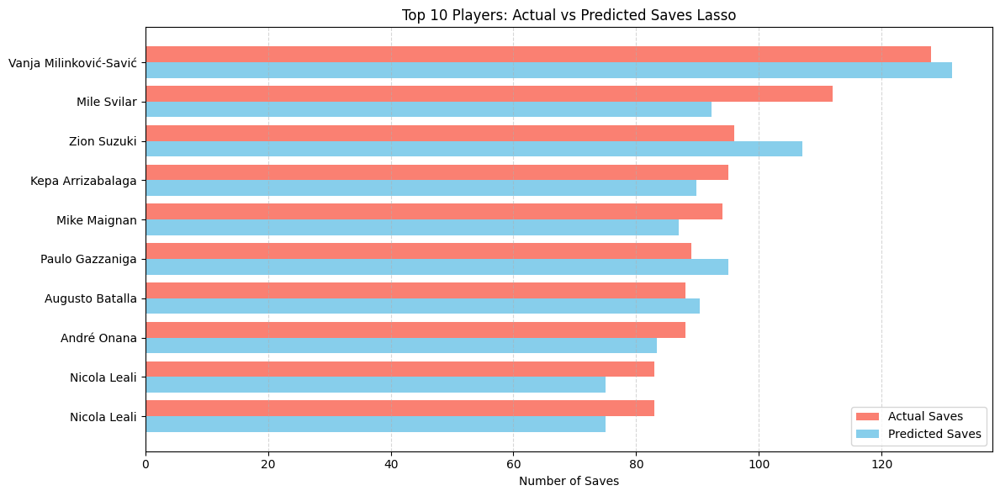

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Saves', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Saves'], bar_width, label='Actual Saves', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Saves'], bar_width, label='Predicted Saves', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Saves')
plt.title('Top 10 Players: Actual vs Predicted Saves Lasso')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Buat DataFrame gabungan prediksi + nama pemain
result_df = name_test.copy()
result_df['Predicted_Saves'] = y_test_pred_mlp
result_df['Actual_Saves'] = y_test.values
top_actual_scorers = result_df.sort_values(by='Actual_Saves', ascending=False)
top_10_actual = top_actual_scorers
top_10_actual


,index,Name,Team,League,Predicted_Saves,Actual_Saves
1208,1480,Vanja Milinković-Savić,Torino,Serie A,129.246230,128.0
1216,1489,Mile Svilar,Roma,Serie A,93.492513,112.0
1231,1506,Zion Suzuki,Parma,Serie A,103.635085,96.0
41,79,Kepa Arrizabalaga,Bournemouth,Premier League,84.522036,95.0
1118,1372,Mike Maignan,AC Milan,Serie A,84.810510,94.0
...,...,...,...,...,...,...
1202,1469,Loum Tchaouna,Lazio,Serie A,1.258958,0.0
312,448,Joe Gomez,Liverpool,Premier League,0.020430,0.0
1286,1577,Andrea Colpani,Fiorentina,Serie A,-0.360181,0.0
1146,1408,Gianluca Busio,Venezia,Serie A,0.365933,0.0


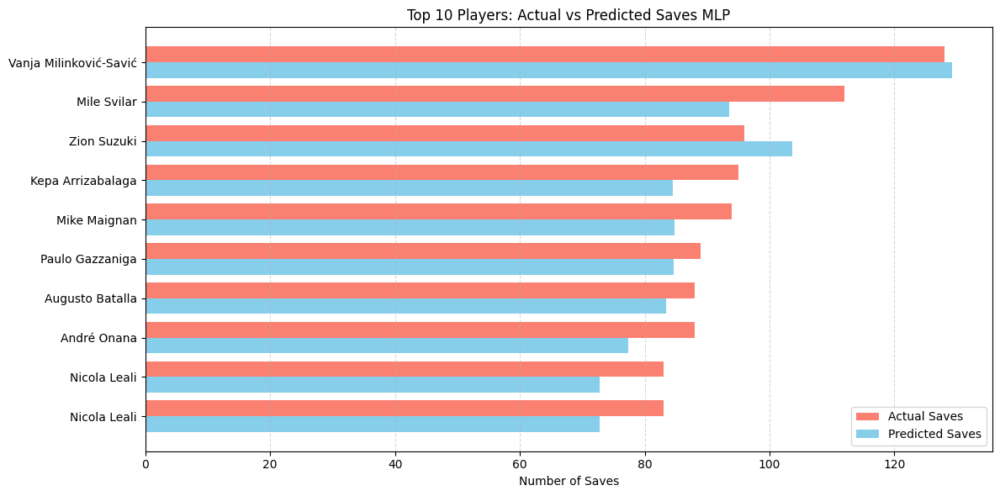

In [ ]:
# Gunakan variabel `top_10_actual` dari konteks user yang sudah berisi kolom 'Name', 'Predicted_Goals', dan 'Actual_Goals'
top_10_actual = top_10_actual.sort_values(by='Actual_Saves', ascending=False).head(10)

# Buat plot bar horizontal perbandingan actual dan predicted goals
plt.figure(figsize=(12, 6))
bar_width = 0.4
indices = np.arange(len(top_10_actual))

# Plot bar untuk actual goals
plt.barh(indices, top_10_actual['Actual_Saves'], bar_width, label='Actual Saves', color='salmon')

# Plot bar untuk predicted goals di sampingnya
plt.barh(indices + bar_width, top_10_actual['Predicted_Saves'], bar_width, label='Predicted Saves', color='skyblue')

# Label dan tampilan
plt.yticks(indices + bar_width / 2, top_10_actual['Name'])
plt.xlabel('Number of Saves')
plt.title('Top 10 Players: Actual vs Predicted Saves MLP')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.gca().invert_yaxis()  # agar yang tertinggi di atas
plt.show()


In [ ]:
# Ambil model Linear Regression
best_linreg_model = linreg_model  # atau langsung gunakan linreg_model

# Simpan model ke file .joblib
joblib.dump(best_linreg_model, 'best_linreg_model_Saves.joblib')


['best_linreg_model_Saves.joblib']

In [ ]:
from google.colab import files
files.download('best_linreg_model_Saves.joblib')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 📊 Model Evaluation

## 🔹 Evaluation on Training Data
- All models achieved **very high performance** with **R² = 0.99**.
- Error values (**MAE**, **MSE**, **RMSE**) were very small and nearly identical across all models, indicating they **learned the training patterns very well**.
- **MLPRegressor** had slightly lower errors than the linear models, but the difference was **not significant**.

---

## 🔹 Evaluation on Testing Data
- Linear models (**Linear**, **Ridge**, and **Lasso**) maintained **excellent performance**:
  - **MAE** around **0.70**
  - **MSE** between **4.02 – 4.06**
  - **RMSE** remained stable at **2.00**
  - **R² = 0.99**
- In contrast, **MLPRegressor** showed **performance degradation**:
  - **MSE increased to 6.22**
  - **RMSE rose to 2.49**

This indicates potential **overfitting**: excellent training accuracy, but reduced testing performance.

---

## ⏱️ Training Time
- **Linear models are very efficient**:
  - **Linear Regression**: 0.02 seconds  
  - **Ridge**: 0.28 seconds  
  - **Lasso**: 0.21 seconds  
- **MLPRegressor** took significantly longer: **45.65 seconds**, despite **worse testing performance** than linear models.

---

## ✅ Conclusion and Recommendation

| **Model**        | **Testing Accuracy**     | **Training Time**  | **Recommendation**                                            |
|------------------|--------------------------|---------------------|----------------------------------------------------------------|
| MLPRegressor     | ⚠️ Decreased (Overfitting) | 🕒 Very Long         | ❌ Not recommended: testing performance drops                  |
| Ridge / Lasso    | ✅ Excellent               | ⚡️ Very Fast         | ✅ Recommended: accurate, stable, and efficient                |
| Linear           | ✅ Excellent               | ⚡️ Very Fast         | ✅ Lightweight alternative with strong results                 |

> 🔍 **Recommendation**:
> - Choose **Ridge** or **Lasso Regression** for a balance of **accuracy, stability, and efficiency**.
> - Avoid **MLPRegressor** in this case due to **overfitting and long training time**.


## **CLUSTERING MARKET VALUE**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import datetime
import numpy as np
import pandas as pd
import seaborn as sns
# import pandasql as ps
import matplotlib.pyplot as plt
%matplotlib inline

print('numpy version : ',np.__version__)
print('pandas version : ',pd.__version__)
print('seaborn version : ',sns.__version__)

from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler

numpy version :  2.0.2
pandas version :  2.2.2
seaborn version :  0.13.2


In [ ]:
df_Market_value = df.copy()
df_Market_value.set_index('Name', inplace=True)

In [ ]:
df_Market_value.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1748 entries, Aitor Fernández to Lorenzo Tosto
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   League                  1748 non-null   object 
 1   Team                    1748 non-null   object 
 2   Goals                   1748 non-null   float64
 3   Expected goals (xG)     1748 non-null   float64
 4   Big chances missed      1748 non-null   float64
 5   Successful dribbles     1748 non-null   float64
 6   Total shots             1748 non-null   float64
 7   Goal conversion %       1748 non-null   float64
 8   Average Sofascore       1748 non-null   float64
 9   Tackles                 1748 non-null   float64
 10  Interceptions           1748 non-null   float64
 11  Clearances              1748 non-null   float64
 12  Errors leading to goal  1748 non-null   float64
 13  Big chances created     1748 non-null   float64
 14  Assists               

# **HANDLING OUTLIER**

In [ ]:
def check_plot(df_gk, variable):
    # fungsi mengambil kerangka data (df) dan
    # variabel yang diminati sebagai argumen

    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df_Market_value[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df_Market_value[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df_Market_value[variable])
    plt.title('Boxplot')
    plt.savefig(f'{col}_distribution.jpg', format='jpg')
    plt.show()

In [ ]:
# Pilih kolom numerik
numeric_cols = df_Market_value.select_dtypes(include=['number']).columns
numeric_cols

Index(['Goals', 'Expected goals (xG)', 'Big chances missed',
       'Successful dribbles', 'Total shots', 'Goal conversion %',
       'Average Sofascore', 'Tackles', 'Interceptions', 'Clearances',
       'Errors leading to goal', 'Big chances created', 'Assists',
       'Accurate passes', 'Accurate passes %', 'Key passes', 'Saves',
       'Clean sheets', 'Penalties saved', 'Saves from inside box', 'Runs out',
       'Age', 'Market value (EUR)', 'Goal_Contribution', 'Offensive_Impact',
       'Defensive_Efficiency', 'xG_Efficiency'],
      dtype='object')

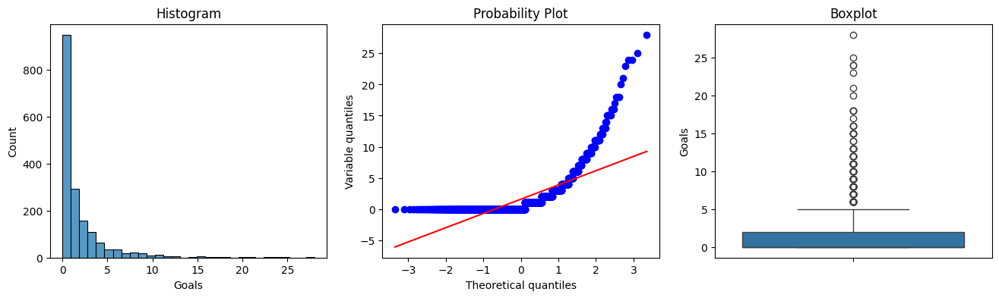

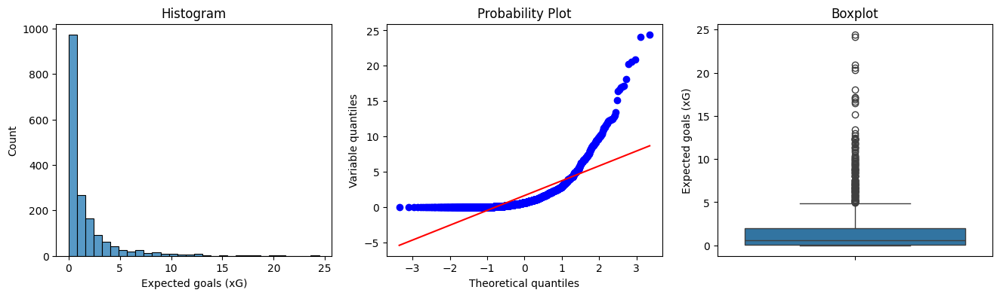

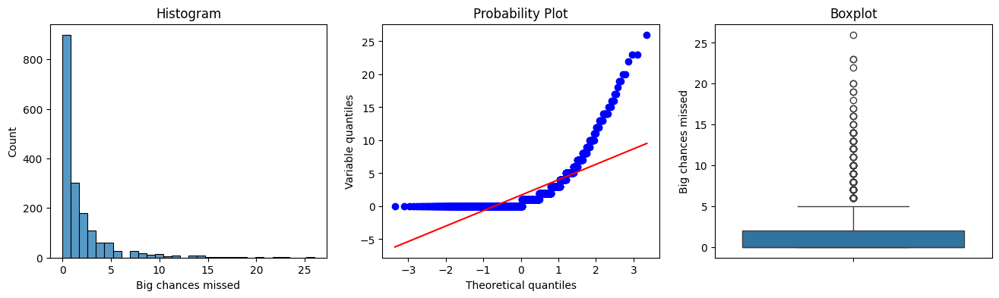

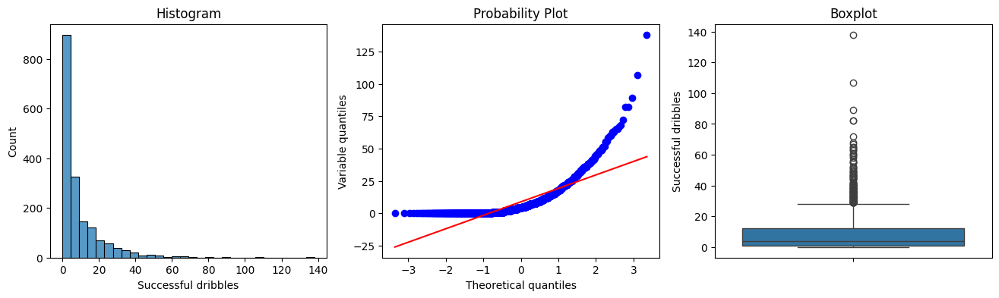

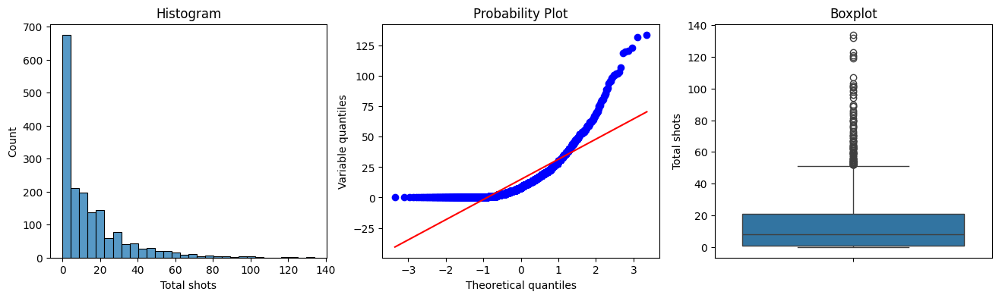

...

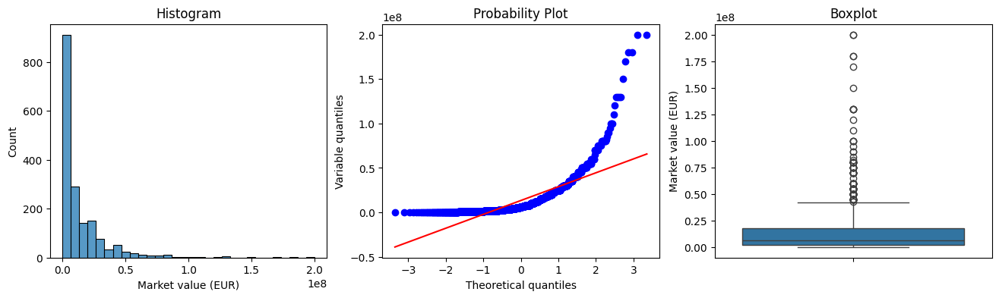

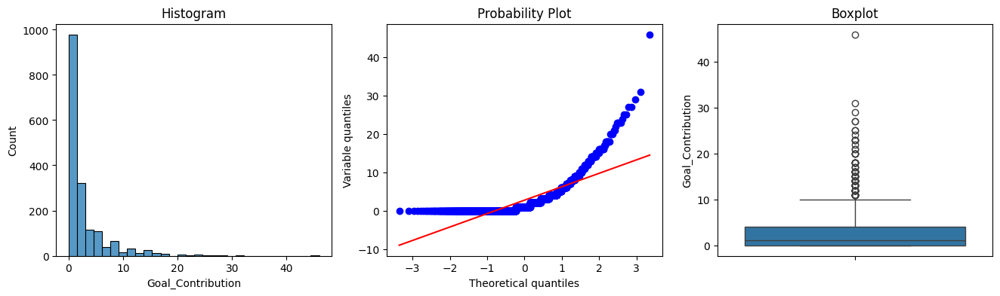

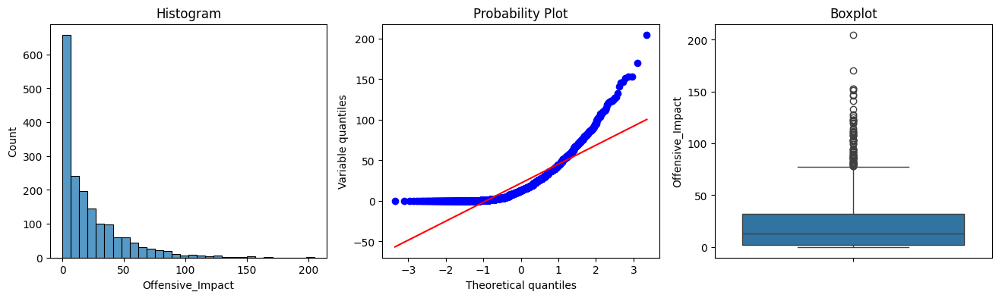

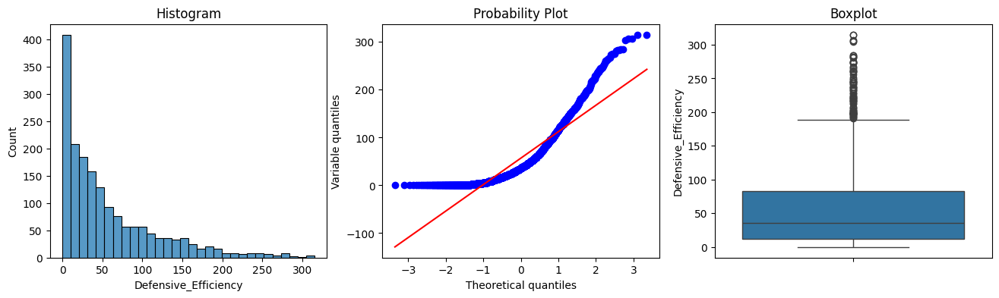

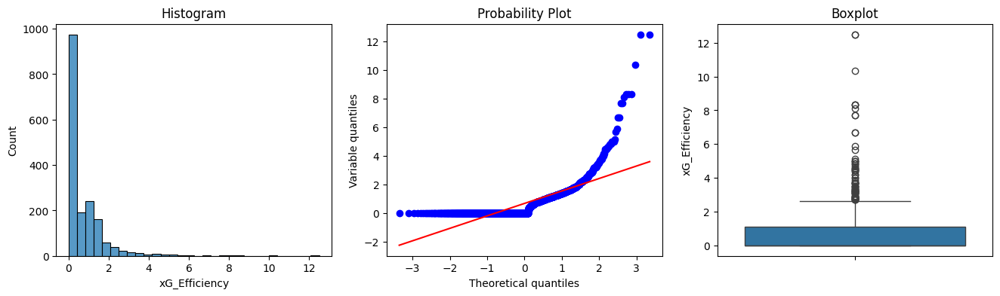

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in numeric_cols:
    check_plot(df_Market_value, col)

In [ ]:
def find_outlier_boundary(df, variable):

    # Mari kita hitung batas luar yang merupakan outlier

    IQR = df_Market_value[variable].quantile(0.75) - df_Market_value[variable].quantile(0.25)

    lower_boundary = df_Market_value[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df_Market_value[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary

In [ ]:
# Kolom-kolom dengan outlier berdasarkan boxplot
col_outlier = [
    'Goals',
    'Expected goals (xG)',
    'Big chances missed',
    'Successful dribbles',
    'Total shots',
    'Goal conversion %',
    'Average Sofascore',
    'Tackles',
    'Interceptions',
    'Clearances',
    'Big chances created',
    'Assists',
    'Accurate passes',
    'Accurate passes %',
    'Key passes',
    'Age',
    'Market value (EUR)',
    'Goal_Contribution',
    'Offensive_Impact',
    'Defensive_Efficiency',
    'xG_Efficiency',

# 'Errors leading to goal'
]


# 5. Buat mask gabungan untuk semua kolom outlier
mask = pd.Series(True, index=df_Market_value.index)  # semua True
for col in col_outlier:
    upper, lower = find_outlier_boundary(df_Market_value, col)
    mask &= (df_Market_value[col] <= upper) & (df_Market_value[col] >= lower)

# 6. Terapkan mask ke X dan y
df_Market_value = df_Market_value[mask].copy()

In [ ]:
# name_team = df_Market_value[['Name', 'Team', 'League']].copy()
# name_team.index = df_Market_value.index  # Samakan index dengan X sebelum masking
# name_team_clean = name_team[mask].reset_index()


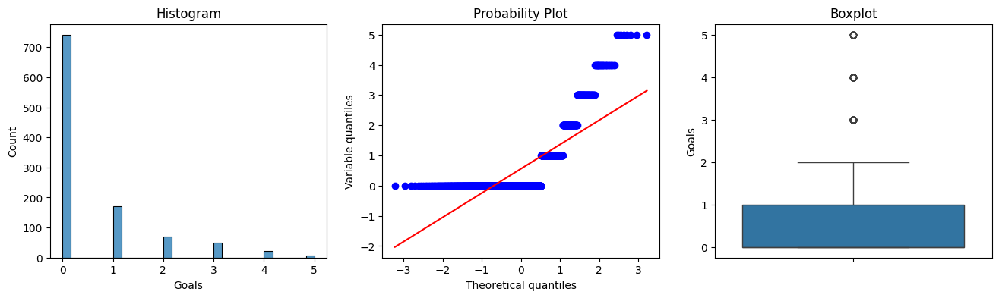

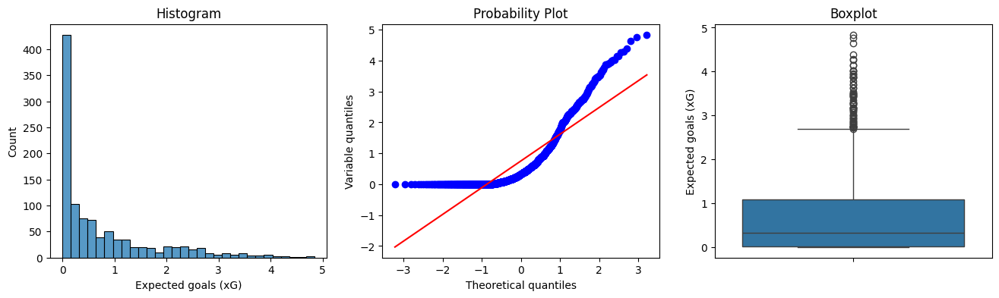

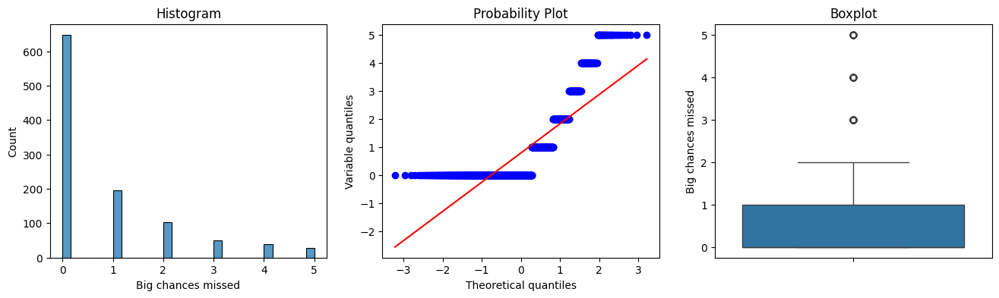

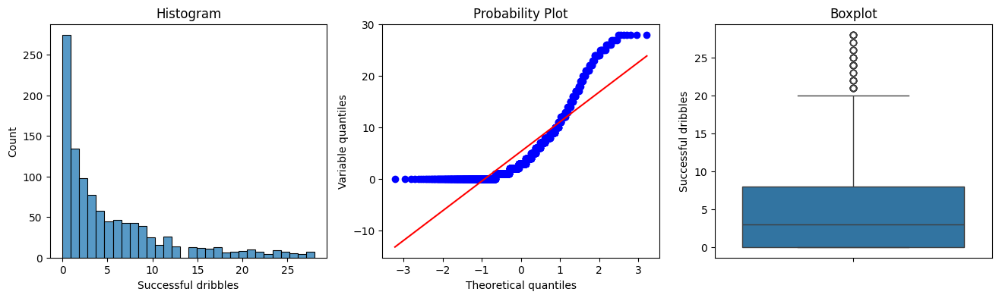

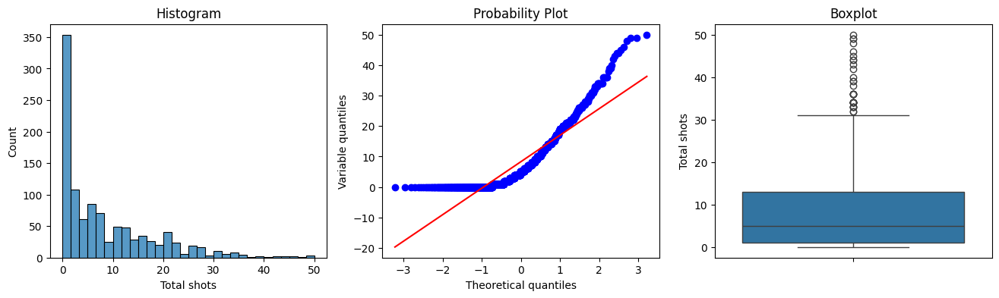

...

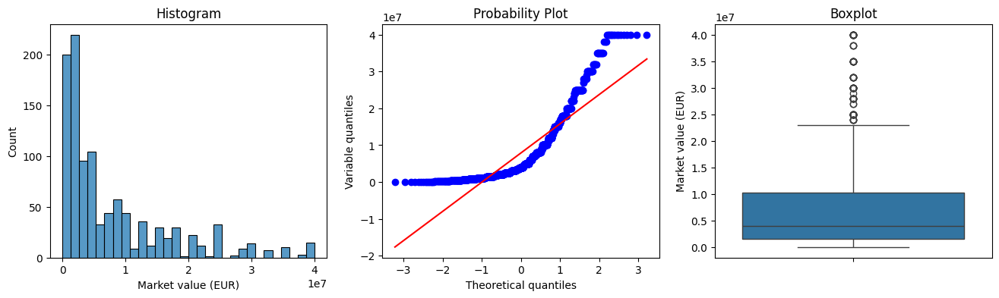

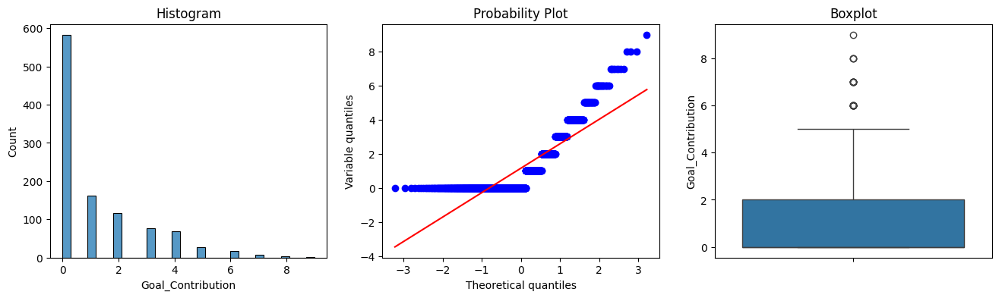

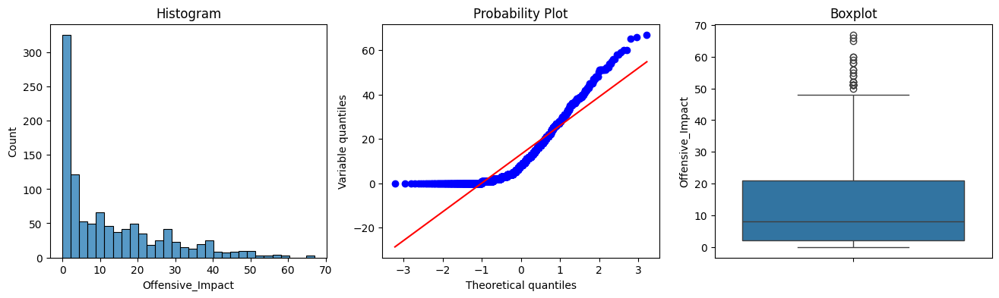

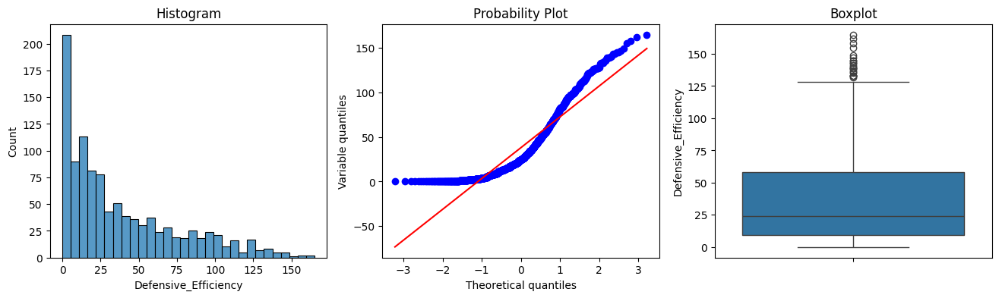

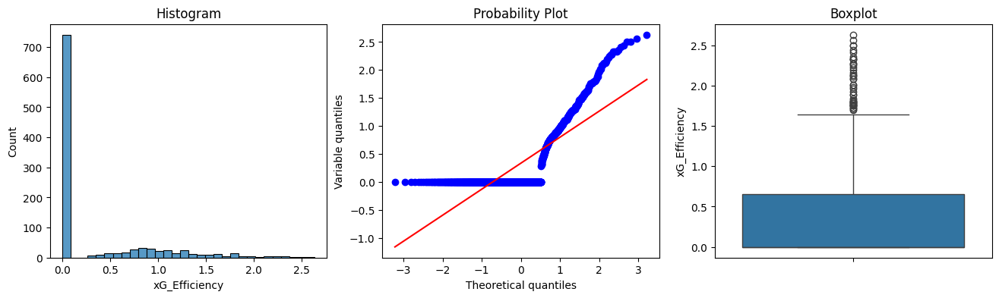

In [ ]:
# Terapkan check_plot pada setiap kolom numerik
for col in col_outlier:
    check_plot(df_Market_value, col)

In [ ]:
# Daftar kolom kategorikal
cat_cols = ['League', 'Team', 'Position']

# Dictionary untuk menyimpan hasil mean encoding
mean_encoders_market_value = {}

for col in cat_cols:
    # Hitung rata-rata Market Value untuk setiap kategori
    mean_map = df_Market_value.groupby(col)['Market value (EUR)'].mean()

    # Simpan mapping ke dictionary
    mean_encoders_market_value[col] = mean_map

    # Gantikan kategori dengan nilai rata-ratanya (mean encoding)
    df_Market_value[col] = df_Market_value[col].map(mean_map)

    # Tangani missing value jika ada kategori yang tidak dikenali
    df_Market_value[col].fillna(df_Market_value['Market value (EUR)'].mean(), inplace=True)

# Simpan encoder ke file joblib
joblib.dump(mean_encoders_market_value, "mean_encoders_market_value.joblib")

['mean_encoders_market_value.joblib']

In [ ]:
df_Market_value.head()

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
Name,,,,,,,,,,,,,,,,,,,,,
Mark Flekken,1.339733e+07,9.689211e+06,0.0,0.00,0.0,1.0,0.0,0.00,7.42,4.0,...,0.0,100.0,15.0,8.595129e+06,31.0,10000000,2.0,4.0,50.0,0.000000
Antonín Kinský,1.339733e+07,1.784118e+07,0.0,0.00,0.0,0.0,0.0,0.00,7.34,3.0,...,0.0,15.0,2.0,8.595129e+06,22.0,15000000,0.0,1.0,16.0,0.000000
Brandon Austin,1.339733e+07,1.784118e+07,0.0,0.00,0.0,0.0,0.0,0.00,7.30,0.0,...,0.0,2.0,2.0,8.595129e+06,26.0,600000,0.0,0.0,1.0,0.000000
Cucho Hernández,4.868040e+06,5.979783e+06,3.0,3.13,4.0,13.0,34.0,8.82,7.28,12.0,...,0.0,0.0,0.0,6.613190e+06,26.0,18000000,4.0,27.0,21.0,0.958466
Lewis Hall,1.339733e+07,1.562500e+07,0.0,0.41,0.0,11.0,11.0,0.00,7.24,58.0,...,0.0,0.0,0.0,7.668614e+06,20.0,30000000,4.0,45.0,127.0,0.000000


# **FEATURE SCALLING (MIN MAX SCALLAR)**

# 📏 **FEATURE SCALING (Min-Max Scaler) for Clustering Models**

## 🎯 Objective
Feature scaling is essential before performing **clustering**, especially for distance-based algorithms such as:

- **K-Means Clustering**  
- **Agglomerative Clustering**  
- **DBSCAN**

When features have different scales, it can distort the **distance calculation between data points** and lead to **biased clustering results** — where features with larger ranges dominate the outcome.

---

## ❗ Why Use MinMaxScaler?

### 🔹 **MinMaxScaler**
- Transforms feature values to a range between **0 and 1**
- Ideal for clustering because it:
  - **Equalizes feature contribution** when calculating **Euclidean distance**
  - **Preserves the original distribution** of the data (scales without changing the shape of the distribution)


In [ ]:
df_Market_value.describe()

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
count,1.061000e+03,1.061000e+03,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,...,1061.000000,1061.000000,1061.000000,1.061000e+03,1061.000000,1.061000e+03,1061.000000,1061.000000,1061.000000,1061.000000
mean,7.878755e+06,7.878755e+06,0.557022,0.752752,0.792648,5.326107,8.298775,3.318633,6.753402,14.535344,...,0.056550,3.691800,1.125353,7.878755e+06,26.057493,7.878755e+06,1.158341,13.025448,37.984920,0.335169
std,3.572875e+06,5.666649e+06,1.034226,0.984647,1.261320,6.453255,9.576715,5.836975,0.196610,15.681678,...,0.328816,13.426748,4.462668,1.299623e+06,4.541371,8.970315e+06,1.675967,14.051399,37.109651,0.578148
min,4.868040e+06,1.681786e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.200000,0.000000,...,0.000000,0.000000,0.000000,3.613571e+06,15.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,4.868040e+06,3.121111e+06,0.000000,0.020000,0.000000,0.000000,1.000000,0.000000,6.620000,2.000000,...,0.000000,0.000000,0.000000,6.613190e+06,22.000000,1.600000e+06,0.000000,2.000000,9.000000,0.000000
50%,6.282971e+06,6.240000e+06,0.000000,0.330000,0.000000,3.000000,5.000000,0.000000,6.730000,9.000000,...,0.000000,0.000000,0.000000,8.134879e+06,26.000000,4.000000e+06,0.000000,8.000000,24.000000,0.000000
75%,1.339733e+07,1.160714e+07,1.000000,1.090000,1.000000,8.000000,13.000000,5.880000,6.880000,23.000000,...,0.000000,0.000000,0.000000,8.595129e+06,29.000000,1.030000e+07,2.000000,21.000000,58.000000,0.657895
max,1.339733e+07,2.500000e+07,5.000000,4.840000,5.000000,28.000000,50.000000,25.000000,7.420000,69.000000,...,4.000000,100.000000,44.000000,1.025714e+07,38.000000,4.000000e+07,9.000000,67.000000,165.000000,2.631579


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Daftar kolom yang ingin dinormalisasi
columns_to_minmax = [
    'Team',
    'Big chances missed',
    'Total shots',
    'Average Sofascore',
    'Errors leading to goal',
    'Assists',
    'Accurate passes',
    'Accurate passes %',
    'Clean sheets',
    'Position',
    'Age',
    'Market value (EUR)', 'League', 'Goals', 'Expected goals (xG)', 'Goal conversion %', 'Goal_Contribution', 'xG_Efficiency', 'Successful dribbles', 'Key passes', 'Offensive_Impact', 'Tackles', 'Interceptions', 'Clearances', 'Defensive_Efficiency', 'Saves', 'Penalties saved', 'Saves from inside box', 'Runs out'
]
scaler = MinMaxScaler()
X_Scaled = df_Market_value.copy()
X_Scaled[columns_to_minmax] = scaler.fit_transform(df_Market_value[columns_to_minmax])


In [ ]:
X_Scaled.describe()

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
count,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,...,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000
mean,0.352985,0.265757,0.111404,0.155527,0.158530,0.190218,0.165975,0.132745,0.453609,0.210657,...,0.014138,0.036918,0.025576,0.642002,0.480761,0.196969,0.128705,0.194410,0.230212,0.127364
std,0.418895,0.243014,0.206845,0.203440,0.252264,0.230473,0.191534,0.233479,0.161155,0.227271,...,0.082204,0.134267,0.101424,0.195621,0.197451,0.224258,0.186219,0.209722,0.224907,0.219696
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.061725,0.000000,0.004132,0.000000,0.000000,0.020000,0.000000,0.344262,0.028986,...,0.000000,0.000000,0.000000,0.451507,0.304348,0.040000,0.000000,0.029851,0.054545,0.000000
50%,0.165891,0.195479,0.000000,0.068182,0.000000,0.107143,0.100000,0.000000,0.434426,0.130435,...,0.000000,0.000000,0.000000,0.680554,0.478261,0.100000,0.000000,0.119403,0.145455,0.000000
75%,1.000000,0.425648,0.200000,0.225207,0.200000,0.285714,0.260000,0.235200,0.557377,0.333333,...,0.000000,0.000000,0.000000,0.749831,0.608696,0.257500,0.222222,0.313433,0.351515,0.250000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
feats = list(df_Market_value)
new_df = pd.DataFrame(data = X_Scaled, columns = feats)
new_df.head()

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Penalties saved,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency
Name,,,,,,,,,,,,,,,,,,,,,
Mark Flekken,1.0,0.343398,0.0,0.000000,0.0,0.035714,0.00,0.0000,1.000000,0.057971,...,0.0,1.00,0.340909,0.749831,0.695652,0.250,0.222222,0.059701,0.303030,0.000000
Antonín Kinský,1.0,0.692994,0.0,0.000000,0.0,0.000000,0.00,0.0000,0.934426,0.043478,...,0.0,0.15,0.045455,0.749831,0.304348,0.375,0.000000,0.014925,0.096970,0.000000
Brandon Austin,1.0,0.692994,0.0,0.000000,0.0,0.000000,0.00,0.0000,0.901639,0.000000,...,0.0,0.02,0.045455,0.749831,0.478261,0.015,0.000000,0.000000,0.006061,0.000000
Cucho Hernández,0.0,0.184319,0.6,0.646694,0.8,0.464286,0.68,0.3528,0.885246,0.173913,...,0.0,0.00,0.000000,0.451507,0.478261,0.450,0.444444,0.402985,0.127273,0.364217
Lewis Hall,1.0,0.597954,0.0,0.084711,0.0,0.392857,0.22,0.0000,0.852459,0.840580,...,0.0,0.00,0.000000,0.610371,0.217391,0.750,0.444444,0.671642,0.769697,0.000000


# **MODELLING**

# **KMEANS**

<Axes: >

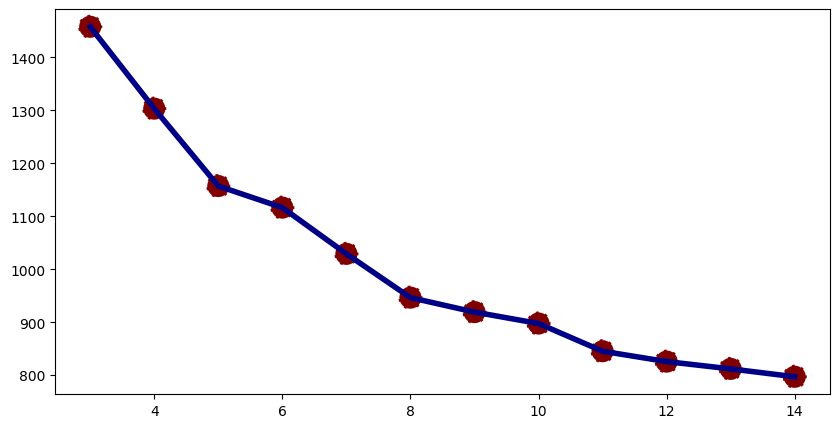

In [ ]:
from sklearn.cluster import KMeans
inertia = []

for i in range(3, 15):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X_Scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))

sns.lineplot(x=range(3, 15), y=inertia, color='#000087', linewidth = 4)
sns.scatterplot(x=range(3, 15), y=inertia, s=300, color='#800000',  linestyle='--')


In [ ]:
from sklearn.metrics import silhouette_score

range_n_clusters = list(range(3,15))
print(range_n_clusters)

[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


In [ ]:
arr_silhouette_score_euclidean = []
for i in range_n_clusters:
    kmeans = KMeans(n_clusters=i).fit(X_Scaled)
    preds = kmeans.predict(new_df)

    score_euclidean = silhouette_score(new_df, preds, metric='euclidean')
    arr_silhouette_score_euclidean.append(score_euclidean)

In [ ]:
from sklearn.metrics import silhouette_score

range_n_clusters = list(range(3,15))
print(range_n_clusters)

[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


In [ ]:
arr_silhouette_score_euclidean = []
for i in range_n_clusters:
    kmeans = KMeans(n_clusters=i).fit(X_Scaled)
    preds = kmeans.predict(new_df)

    score_euclidean = silhouette_score(new_df, preds, metric='euclidean')
    arr_silhouette_score_euclidean.append(score_euclidean)

# SILHOUTTE SCORE AND ELBOW METHOD

## 🎯 Objective
Used to evaluate and determine the optimal number of **clusters (k)** in clustering algorithms such as **K-Means**.


<Axes: >

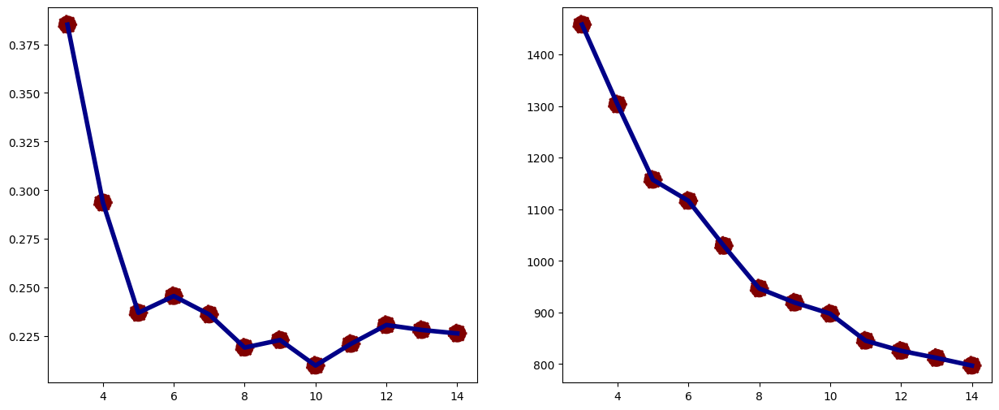

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15, 6))
sns.lineplot(x=range(3,15), y=arr_silhouette_score_euclidean, color='#000087', linewidth = 4, ax=ax[0])
sns.scatterplot(x=range(3,15), y=arr_silhouette_score_euclidean, s=300, color='#800000',  linestyle='--',ax=ax[0])

sns.lineplot(x=range(3, 15), y=inertia, color='#000087', linewidth = 4,ax=ax[1])
sns.scatterplot(x=range(3, 15), y=inertia, s=300, color='#800000',  linestyle='--', ax=ax[1])

## 📊 Optimal Cluster Evaluation: Silhouette Score & Elbow Method

The figure above displays two key metrics used to determine the optimal number of clusters (**k**) in clustering analysis:

---

### 🔹 Left Plot: **Silhouette Score**

- The **Silhouette Score** measures how well each data point fits within its assigned cluster.
- Higher values indicate better-defined clusters.
- In this plot, the silhouette score **drops significantly after k = 4**, then stabilizes with small fluctuations.
- This suggests that **k = 4 or 5** might provide the best balance between cohesion and separation.

---

### 🔹 Right Plot: **Elbow Method (Inertia)**

- **Inertia** represents the total within-cluster sum of squared distances (WCSS).
- The goal is to find the “elbow point” — where the inertia sharply decreases and then levels off.
- From the graph, a noticeable “elbow” occurs around **k = 4 to 5**, indicating a good point to stop increasing k.

---

### ✅ Interpretation

- Both the **Silhouette Score** and the **Elbow Method** suggest that an optimal number of clusters lies around **k = 4 or 5**.
- Choosing **k within this range** is likely to yield well-separated and stable clusters.


In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(X_Scaled)

KMeans(n_clusters=3, random_state=0)

In [ ]:
df_Market_value['clusters'] = kmeans.labels_
df_Market_value.head()

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency,clusters
Name,,,,,,,,,,,,,,,,,,,,,
Mark Flekken,1.339733e+07,9.689211e+06,0.0,0.00,0.0,1.0,0.0,0.00,7.42,4.0,...,100.0,15.0,8.595129e+06,31.0,10000000,2.0,4.0,50.0,0.000000,0
Antonín Kinský,1.339733e+07,1.784118e+07,0.0,0.00,0.0,0.0,0.0,0.00,7.34,3.0,...,15.0,2.0,8.595129e+06,22.0,15000000,0.0,1.0,16.0,0.000000,1
Brandon Austin,1.339733e+07,1.784118e+07,0.0,0.00,0.0,0.0,0.0,0.00,7.30,0.0,...,2.0,2.0,8.595129e+06,26.0,600000,0.0,0.0,1.0,0.000000,1
Cucho Hernández,4.868040e+06,5.979783e+06,3.0,3.13,4.0,13.0,34.0,8.82,7.28,12.0,...,0.0,0.0,6.613190e+06,26.0,18000000,4.0,27.0,21.0,0.958466,0
Lewis Hall,1.339733e+07,1.562500e+07,0.0,0.41,0.0,11.0,11.0,0.00,7.24,58.0,...,0.0,0.0,7.668614e+06,20.0,30000000,4.0,45.0,127.0,0.000000,2


In [ ]:
perc = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
df_Market_value.describe(percentiles=perc)

,League,Team,Goals,Expected goals (xG),Big chances missed,Successful dribbles,Total shots,Goal conversion %,Average Sofascore,Tackles,...,Saves from inside box,Runs out,Position,Age,Market value (EUR),Goal_Contribution,Offensive_Impact,Defensive_Efficiency,xG_Efficiency,clusters
count,1.061000e+03,1.061000e+03,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000,...,1061.000000,1061.000000,1.061000e+03,1061.000000,1.061000e+03,1061.000000,1061.000000,1061.000000,1061.000000,1061.000000
mean,7.878755e+06,7.878755e+06,0.557022,0.752752,0.792648,5.326107,8.298775,3.318633,6.753402,14.535344,...,3.691800,1.125353,7.878755e+06,26.057493,7.878755e+06,1.158341,13.025448,37.984920,0.335169,0.890669
std,3.572875e+06,5.666649e+06,1.034226,0.984647,1.261320,6.453255,9.576715,5.836975,0.196610,15.681678,...,13.426748,4.462668,1.299623e+06,4.541371,8.970315e+06,1.675967,14.051399,37.109651,0.578148,0.545408
min,4.868040e+06,1.681786e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.200000,0.000000,...,0.000000,0.000000,3.613571e+06,15.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
10%,4.868040e+06,2.218750e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.520000,0.000000,...,0.000000,0.000000,6.276343e+06,20.000000,8.000000e+05,0.000000,0.000000,2.000000,0.000000,0.000000
20%,4.868040e+06,2.728148e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.600000,1.000000,...,0.000000,0.000000,6.613190e+06,22.000000,1.500000e+06,0.000000,1.000000,6.000000,0.000000,0.000000
30%,4.868040e+06,3.587292e+06,0.000000,0.060000,0.000000,1.000000,1.000000,0.000000,6.640000,3.000000,...,0.000000,0.000000,6.960442e+06,23.000000,2.000000e+06,0.000000,2.000000,12.000000,0.000000,1.000000
40%,6.282971e+06,4.870870e+06,0.000000,0.160000,0.000000,2.000000,3.000000,0.000000,6.690000,5.000000,...,0.000000,0.000000,7.668614e+06,24.000000,2.800000e+06,0.000000,4.000000,17.000000,0.000000,1.000000
50%,6.282971e+06,6.240000e+06,0.000000,0.330000,0.000000,3.000000,5.000000,0.000000,6.730000,9.000000,...,0.000000,0.000000,8.134879e+06,26.000000,4.000000e+06,0.000000,8.000000,24.000000,0.000000,1.000000
60%,6.282971e+06,6.915000e+06,0.000000,0.550000,0.000000,4.000000,7.000000,0.000000,6.800000,13.000000,...,0.000000,0.000000,8.134879e+06,27.000000,6.000000e+06,1.000000,12.000000,34.000000,0.000000,1.000000


In [ ]:
# Hitung rerata Market Value per cluster ID (bukan label)
cluster_order = df_Market_value.groupby('clusters')['Market value (EUR)'].mean().sort_values()

# Buat mapping baru berdasarkan urutan aktual
cluster_map_fixed = {cluster: label for cluster, label in zip(cluster_order.index, [
    'Low Market', 'Mid Market', 'High Market', 'Top Market'])}

# Terapkan mapping baru
df_Market_value['cluster_label'] = df_Market_value['clusters'].map(cluster_map_fixed)


In [ ]:
df_Market_value.groupby('cluster_label')[[
    'Market value (EUR)', 'Age', 'Assists', 'Clean sheets',
    'Total shots', 'Accurate passes %', 'Average Sofascore'
]].mean().round(2).sort_values(by='Market value (EUR)')



,Market value (EUR),Age,Assists,Clean sheets,Total shots,Accurate passes %,Average Sofascore
cluster_label,,,,,,,
Low Market,6690360.16,25.78,0.20,0.75,4.27,80.74,6.72
Mid Market,9919811.32,27.08,2.09,0.08,19.75,81.49,6.86
High Market,10828040.54,26.49,1.23,0.06,16.12,81.09,6.82


In [ ]:
# Reset index agar tidak terjadi error saat merge kolom
df_Market_value_reset = df_Market_value.reset_index()

# Proses PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pcs = pca.fit_transform(X_Scaled)

# Buat DataFrame hasil PCA dan tambahkan label cluster
data_pca = pd.DataFrame(data=pcs, columns=['PC 1', 'PC 2'])
data_pca['cluster_label'] = df_Market_value_reset['cluster_label']
data_pca.head()


,PC 1,PC 2,cluster_label
0,0.802511,0.893123,High Market
1,-0.251741,0.899227,Low Market
2,-1.236512,0.714797,Low Market
3,1.103601,-0.570379,High Market
4,4.082295,1.002138,Mid Market


<Axes: xlabel='PC 1', ylabel='PC 2'>

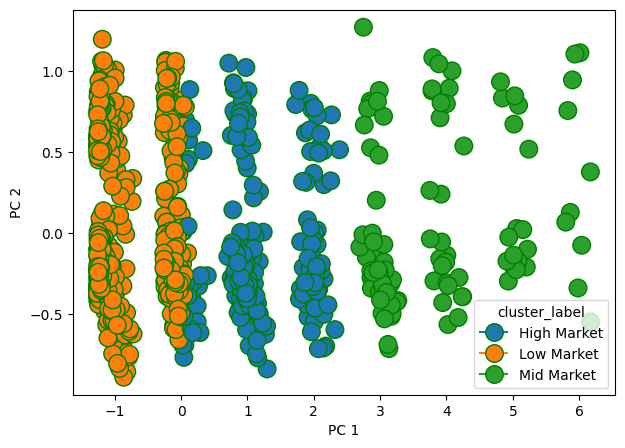

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))

sns.scatterplot(
    x="PC 1", y="PC 2",
    hue="cluster_label",
    edgecolor='green',
    linestyle='-',
    data=data_pca,
    s=160,
    ax=ax
)

In [ ]:
from sklearn.manifold import TSNE

Xtsne = TSNE(n_components=2).fit_transform(X_Scaled)
dftsne = pd.DataFrame(Xtsne)
dftsne.columns = ['x1','x2']
dftsne['cluster_label'] = df_Market_value_reset['cluster_label']
dftsne.head()

,x1,x2,cluster_label
0,-4.641918,-26.651642,High Market
1,12.334012,18.045147,Low Market
2,0.228540,39.135265,Low Market
3,33.681927,6.430236,High Market
4,64.516586,1.131901,Mid Market


<Axes: xlabel='x1', ylabel='x2'>

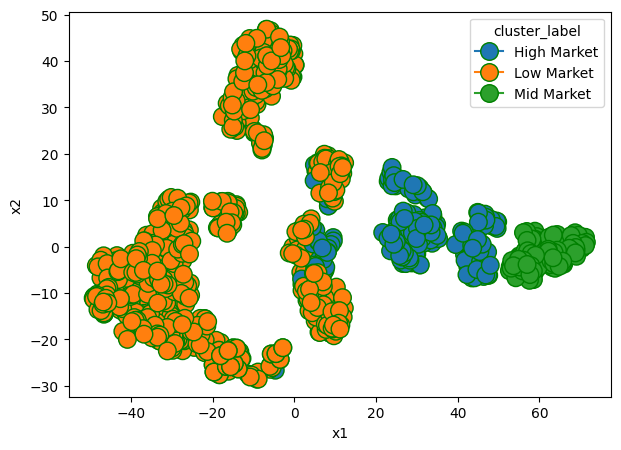

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))

sns.scatterplot(
    x="x1", y="x2",
    hue="cluster_label",
    edgecolor='green',
    linestyle='-',
    data=dftsne,
    s=160,
    ax=ax
)

In [ ]:
df_Market_value_reset[['Market value (EUR)', 'Age']].describe(percentiles=perc)


,Market value (EUR),Age
count,1.061000e+03,1061.000000
mean,7.878755e+06,26.057493
std,8.970315e+06,4.541371
min,0.000000e+00,15.000000
10%,8.000000e+05,20.000000
20%,1.500000e+06,22.000000
30%,2.000000e+06,23.000000
40%,2.800000e+06,24.000000
50%,4.000000e+06,26.000000
60%,6.000000e+06,27.000000


In [ ]:
# Tampilkan 5 teratas
df_Market_value_reset[['Market value (EUR)', 'cluster_label']].head()

,Market value (EUR),cluster_label
0,10000000,High Market
1,15000000,Low Market
2,600000,Low Market
3,18000000,High Market
4,30000000,Mid Market


In [ ]:
df_Market_value_reset['clusters'].value_counts()


,count
clusters,
1,733
0,222
2,106


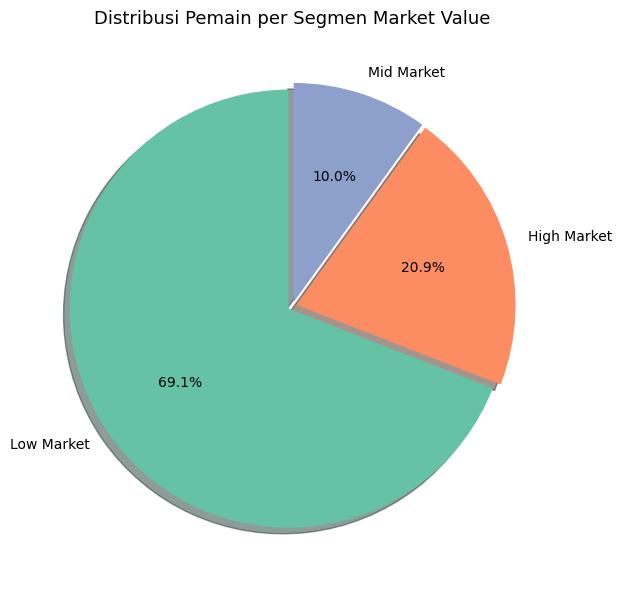

In [ ]:
# Atur gaya visual
sns.set_palette("Set2")

# Hitung jumlah pemain per cluster label
cluster_counts = df_Market_value['cluster_label'].value_counts()

# Pie chart
plt.figure(figsize=(8, 6))
cluster_counts.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    ylabel='',  # hilangkan label default di tengah
    explode=[0.02] * len(cluster_counts),  # sedikit keluar tiap slice
    shadow=True
)

plt.title('Distribusi Pemain per Segmen Market Value', fontsize=13)
plt.tight_layout()
plt.show()


# **Agglomerative Clustering**

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

range_n_clusters = list(range(3, 15))
silhouette_scores_agglo = []

for k in range_n_clusters:
    agglo = AgglomerativeClustering(n_clusters=k)
    labels = agglo.fit_predict(X_Scaled)
    score = silhouette_score(X_Scaled, labels)
    silhouette_scores_agglo.append(score)
    print(f"k = {k} → Silhouette Score: {score:.4f}")


k = 3 → Silhouette Score: 0.3999
k = 4 → Silhouette Score: 0.2220
k = 5 → Silhouette Score: 0.2306
k = 6 → Silhouette Score: 0.2186
k = 7 → Silhouette Score: 0.1822
k = 8 → Silhouette Score: 0.1808
k = 9 → Silhouette Score: 0.1772
k = 10 → Silhouette Score: 0.1872
k = 11 → Silhouette Score: 0.1943
k = 12 → Silhouette Score: 0.2031
k = 13 → Silhouette Score: 0.2025
k = 14 → Silhouette Score: 0.1934


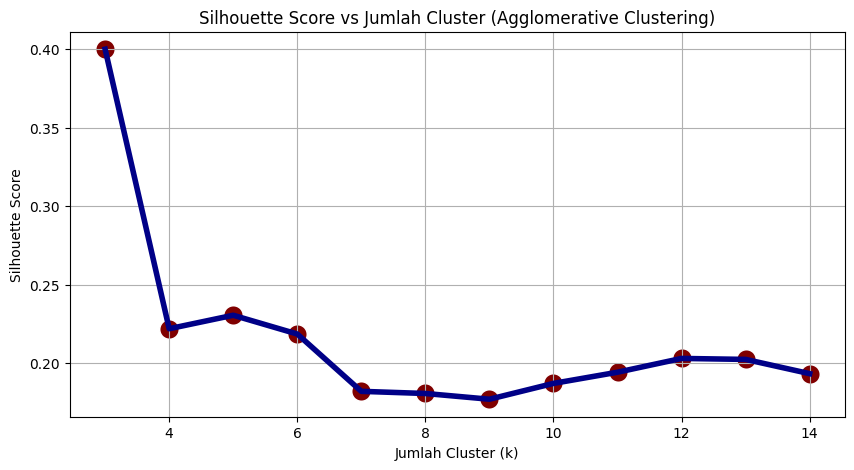

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.lineplot(x=range_n_clusters, y=silhouette_scores_agglo, color='#000087', linewidth=4)
sns.scatterplot(x=range_n_clusters, y=silhouette_scores_agglo, s=200, color='#800000')
plt.title("Silhouette Score vs Jumlah Cluster (Agglomerative Clustering)")
plt.xlabel("Jumlah Cluster (k)")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.show()


In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Fit model
agglo = AgglomerativeClustering(n_clusters=3)
df_Market_value['clusters_agglo'] = agglo.fit_predict(X_Scaled)


In [ ]:
# Hitung rerata Market Value per cluster Agglomerative
cluster_order_agglo = df_Market_value.groupby('clusters_agglo')['Market value (EUR)'].mean().sort_values()

# Buat mapping label sesuai urutan nilai pasar
cluster_map_agglo = {cluster: label for cluster, label in zip(cluster_order_agglo.index, [
    'Low Market', 'Mid Market', 'High Market'])}

# Terapkan mapping
df_Market_value['cluster_label_agglo'] = df_Market_value['clusters_agglo'].map(cluster_map_agglo)


In [ ]:
df_Market_value.groupby('cluster_label_agglo')[[
    'Market value (EUR)', 'Age', 'Assists', 'Clean sheets',
    'Total shots', 'Accurate passes %', 'Average Sofascore'
]].mean().round(2).sort_values(by='Market value (EUR)')


,Market value (EUR),Age,Assists,Clean sheets,Total shots,Accurate passes %,Average Sofascore
cluster_label_agglo,,,,,,,
Low Market,7042677.96,25.81,0.24,0.73,4.99,80.78,6.72
Mid Market,9880208.33,27.22,2.11,0.09,18.84,81.62,6.86
High Market,10147095.96,26.47,1.28,0.00,16.00,80.95,6.81


In [ ]:
from sklearn.decomposition import PCA

# Reset index agar aman
df_Market_value_reset = df_Market_value.reset_index()

# PCA
pca = PCA(n_components=2)
pcs = pca.fit_transform(X_Scaled)

# DataFrame hasil PCA
data_pca_agglo = pd.DataFrame(data=pcs, columns=['PC 1', 'PC 2'])
data_pca_agglo['cluster_label_agglo'] = df_Market_value_reset['cluster_label_agglo']


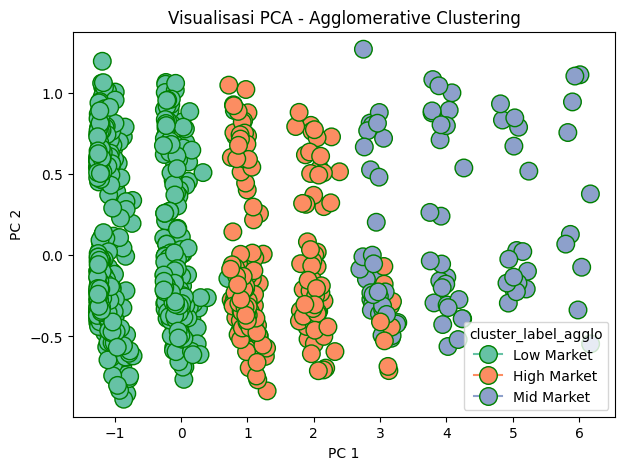

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))

sns.scatterplot(
    x="PC 1", y="PC 2",
    hue="cluster_label_agglo",
    edgecolor='green',
    linestyle='-',
    data=data_pca_agglo,
    s=160,
    ax=ax
)
plt.title("Visualisasi PCA - Agglomerative Clustering")
plt.show()


In [ ]:
from sklearn.manifold import TSNE

Xtsne_agglo = TSNE(n_components=2, random_state=42).fit_transform(X_Scaled)
dftsne_agglo = pd.DataFrame(Xtsne_agglo, columns=['x1', 'x2'])
dftsne_agglo['cluster_label_agglo'] = df_Market_value_reset['cluster_label_agglo']


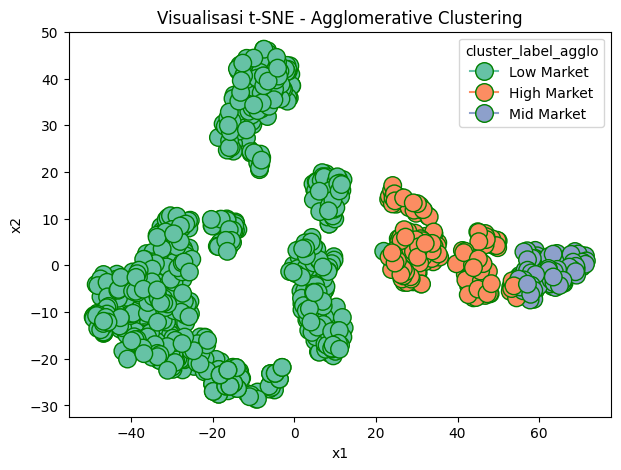

In [ ]:
fig, ax = plt.subplots(figsize=(7,5))

sns.scatterplot(
    x="x1", y="x2",
    hue="cluster_label_agglo",
    edgecolor='green',
    linestyle='-',
    data=dftsne_agglo,
    s=160,
    ax=ax
)
plt.title("Visualisasi t-SNE - Agglomerative Clustering")
plt.show()


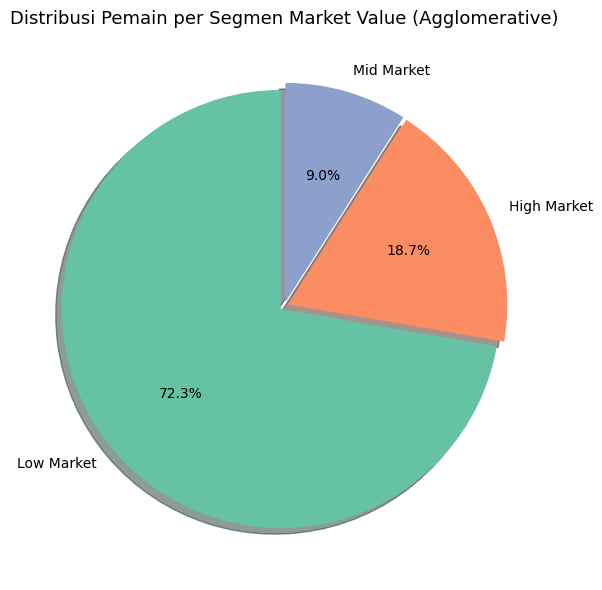

In [ ]:
# Hitung jumlah pemain per segmen
cluster_counts_agglo = df_Market_value['cluster_label_agglo'].value_counts()

# Visualisasi pie chart
sns.set_palette("Set2")
plt.figure(figsize=(8, 6))
cluster_counts_agglo.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    ylabel='',
    explode=[0.02] * len(cluster_counts_agglo),
    shadow=True
)

plt.title('Distribusi Pemain per Segmen Market Value (Agglomerative)', fontsize=13)
plt.tight_layout()
plt.show()


In [ ]:
# Hitung rata-rata market value tiap cluster
cluster_order_agglo = df_Market_value.groupby('clusters_agglo')['Market value (EUR)'].mean().sort_values()

# Mapping label
cluster_label_map = {cluster: label for cluster, label in zip(cluster_order_agglo.index, ['Low Market', 'Mid Market', 'High Market'])}
df_Market_value['cluster_label_agglo'] = df_Market_value['clusters_agglo'].map(cluster_label_map)


In [ ]:
df_Market_value.groupby('cluster_label_agglo')[[
    'Market value (EUR)', 'Age', 'Assists', 'Clean sheets',
    'Total shots', 'Accurate passes %', 'Average Sofascore'
]].mean().round(2).sort_values(by='Market value (EUR)')


,Market value (EUR),Age,Assists,Clean sheets,Total shots,Accurate passes %,Average Sofascore
cluster_label_agglo,,,,,,,
Low Market,7042677.96,25.81,0.24,0.73,4.99,80.78,6.72
Mid Market,9880208.33,27.22,2.11,0.09,18.84,81.62,6.86
High Market,10147095.96,26.47,1.28,0.00,16.00,80.95,6.81


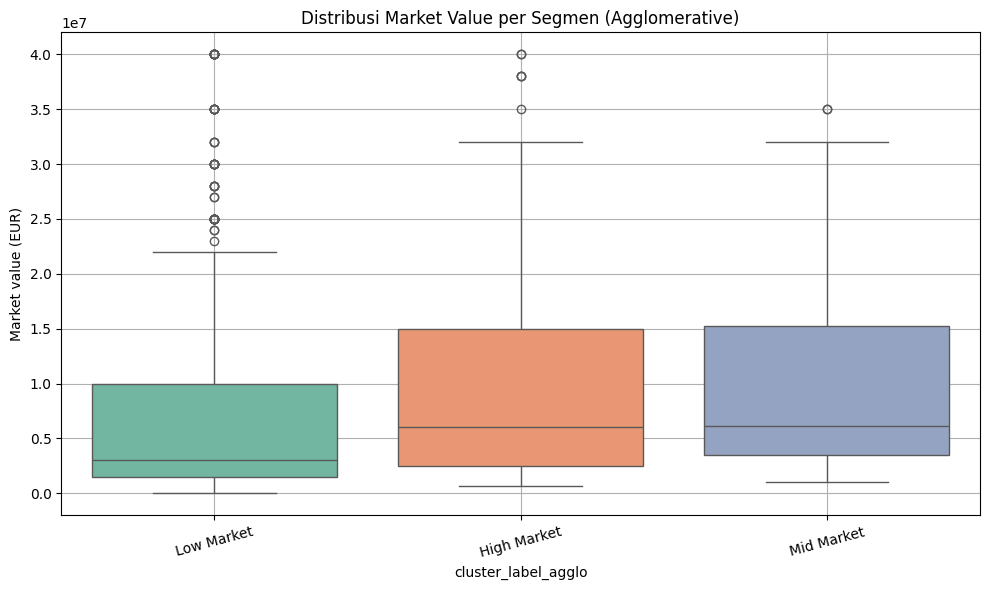

In [ ]:
# Boxplot Market Value per Segmen Agglomerative
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label_agglo', y='Market value (EUR)', data=df_Market_value, palette='Set2')
plt.title("Distribusi Market Value per Segmen (Agglomerative)")
plt.xticks(rotation=15)
plt.grid(True)
plt.tight_layout()
plt.show()


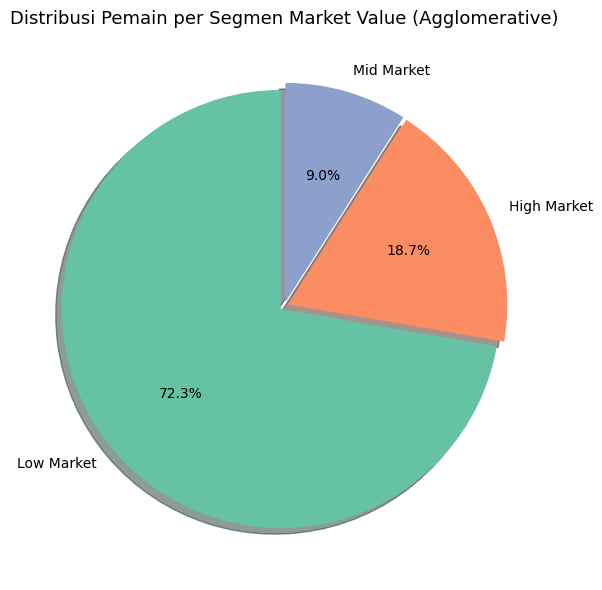

In [ ]:
# Hitung jumlah pemain per cluster label
cluster_counts = df_Market_value['cluster_label_agglo'].value_counts()

# Pie chart
plt.figure(figsize=(8, 6))
cluster_counts.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    ylabel='',  # hilangkan label default di tengah
    explode=[0.02] * len(cluster_counts),  # sedikit keluar tiap slice
    shadow=True
)

plt.title('Distribusi Pemain per Segmen Market Value (Agglomerative)', fontsize=13)
plt.tight_layout()
plt.show()


## ✅ Conclusion & Recommendation: Clustering Method

### 📌 **Conclusion**
- **K-Means Clustering** produces more **balanced**, **distinct**, and **well-separated clusters**, making it ideal for clean and structured player market segmentation that is easily deployable in real-world systems.
- In contrast, **Agglomerative Clustering** captures the **natural hierarchical structure** of the data better, but its clusters are **less balanced** and show **more overlap**, especially between **Low and High Market** segments.

---

### 📈 **Recommendation**
- It is recommended to use **K-Means Clustering** for **player market segmentation**, as it provides a more **practical**, **efficient**, and **interpretable** clustering solution suitable for real-world applications.
